In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
from sklearn import preprocessing, metrics

from time import time
from sklearnex import patch_sklearn
import warnings
warnings.filterwarnings('ignore')

In [2]:
econdev=pd.read_csv("C:/Users/attil/Downloads/Chi_Key_words (2)\Key_words/20230112000059_Econ_jingji/econ_develop_keywords.csv");econdev

,Unnamed: 0,Date,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,26697,1/3/2020 8:16,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,"In 2020, the year of the ""13th Five-Year Plan""...","In 2020, the year of the ""13th Five-Year Plan""...",0.817600,neutral,0.817600,neutral,Community Relations,0.737041,Community Relations,0.737041
1,26699,1/3/2020 8:16,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,": After the beginning of the opening, the upgr...","In 2020, the year of the ""13th Five-Year Plan""...",0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
2,26700,1/3/2020 8:16,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,": After the beginning of the opening, the upgr...","In 2020, the year of the ""13th Five-Year Plan""...",0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
3,166661,1/4/2020 5:38,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,The Japanese economy was not optimistic in 2020,"In 2019, it is a bumpy year for Japanese Prime...",0.712724,negative,0.593735,neutral,Non-ESG,0.344305,Community Relations,0.864024
4,26742,1/4/2020 8:19,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,The core issue of the reform of the economic s...,The core issue of the reform of the economic s...,0.523151,positive,0.523151,positive,Community Relations,0.889256,Community Relations,0.889256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5976,116823,9/30/2022 8:49,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"""China Supervision"" focuses on scientific and ...",The Shenzhen Stock Exchange and Shenzhen Secur...,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5977,116829,9/30/2022 8:49,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"""China Supervision"" focuses on scientific and ...",The Shenzhen Stock Exchange and Shenzhen Secur...,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5978,116841,9/30/2022 12:24,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Shenwei Pharmaceutical's non-executive Dong Lu...,"""Economic Construction News Agency 30th News"" ...",0.903338,neutral,0.810486,neutral,Corporate Governance,0.986725,Corporate Governance,0.752372
5979,116908,9/30/2022 17:48,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,KPM: Hong Kong's asset management industry is ...,"""Economic Communication News Agency 30th News""...",0.822867,neutral,0.577793,neutral,Business Ethics & Values,0.379221,Community Relations,0.802590


In [3]:
econ=econdev.iloc[:,[1,-8,-7,-6,-5,-4,-3,-2,-1]];econ

,Date,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,1/3/2020 8:16,0.817600,neutral,0.817600,neutral,Community Relations,0.737041,Community Relations,0.737041
1,1/3/2020 8:16,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
2,1/3/2020 8:16,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
3,1/4/2020 5:38,0.712724,negative,0.593735,neutral,Non-ESG,0.344305,Community Relations,0.864024
4,1/4/2020 8:19,0.523151,positive,0.523151,positive,Community Relations,0.889256,Community Relations,0.889256
...,...,...,...,...,...,...,...,...,...
5976,9/30/2022 8:49,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5977,9/30/2022 8:49,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5978,9/30/2022 12:24,0.903338,neutral,0.810486,neutral,Corporate Governance,0.986725,Corporate Governance,0.752372
5979,9/30/2022 17:48,0.822867,neutral,0.577793,neutral,Business Ethics & Values,0.379221,Community Relations,0.802590


In [4]:
econ.columns=["Date","senti_score_headline","senti_label_headline","senti_score_content","senti_label_content","ESG_label_headline","ESG_headline_score","ESG_label_content","ESG_content_score"]

In [5]:
econ

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score
0,1/3/2020 8:16,0.817600,neutral,0.817600,neutral,Community Relations,0.737041,Community Relations,0.737041
1,1/3/2020 8:16,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
2,1/3/2020 8:16,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
3,1/4/2020 5:38,0.712724,negative,0.593735,neutral,Non-ESG,0.344305,Community Relations,0.864024
4,1/4/2020 8:19,0.523151,positive,0.523151,positive,Community Relations,0.889256,Community Relations,0.889256
...,...,...,...,...,...,...,...,...,...
5976,9/30/2022 8:49,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5977,9/30/2022 8:49,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5978,9/30/2022 12:24,0.903338,neutral,0.810486,neutral,Corporate Governance,0.986725,Corporate Governance,0.752372
5979,9/30/2022 17:48,0.822867,neutral,0.577793,neutral,Business Ethics & Values,0.379221,Community Relations,0.802590


In [6]:
econ["Date"]=pd.to_datetime(econ["Date"])
econ["Date"]=econ["Date"].dt.strftime('%y-%m-%d')
econ["Date"]=pd.to_datetime(econ["Date"],format='%y-%m-%d');econ

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score
0,2020-01-03,0.817600,neutral,0.817600,neutral,Community Relations,0.737041,Community Relations,0.737041
1,2020-01-03,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
2,2020-01-03,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041
3,2020-01-04,0.712724,negative,0.593735,neutral,Non-ESG,0.344305,Community Relations,0.864024
4,2020-01-04,0.523151,positive,0.523151,positive,Community Relations,0.889256,Community Relations,0.889256
...,...,...,...,...,...,...,...,...,...
5976,2022-09-30,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5977,2022-09-30,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968
5978,2022-09-30,0.903338,neutral,0.810486,neutral,Corporate Governance,0.986725,Corporate Governance,0.752372
5979,2022-09-30,0.822867,neutral,0.577793,neutral,Business Ethics & Values,0.379221,Community Relations,0.802590


In [7]:
econ=econ.join(pd.get_dummies(econ[["senti_label_headline","senti_label_content","ESG_label_headline","ESG_label_content"]]));econ

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score,senti_label_headline_negative,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
0,2020-01-03,0.817600,neutral,0.817600,neutral,Community Relations,0.737041,Community Relations,0.737041,0,...,0,0,0,1,0,0,0,0,0,0
1,2020-01-03,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041,0,...,0,0,0,1,0,0,0,0,0,0
2,2020-01-03,0.703463,neutral,0.817600,neutral,Non-ESG,0.944995,Community Relations,0.737041,0,...,0,0,0,1,0,0,0,0,0,0
3,2020-01-04,0.712724,negative,0.593735,neutral,Non-ESG,0.344305,Community Relations,0.864024,1,...,0,0,0,1,0,0,0,0,0,0
4,2020-01-04,0.523151,positive,0.523151,positive,Community Relations,0.889256,Community Relations,0.889256,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5976,2022-09-30,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968,0,...,0,0,1,0,0,0,0,0,0,0
5977,2022-09-30,0.568837,neutral,0.502922,positive,Community Relations,0.833782,Climate Change,0.961968,0,...,0,0,1,0,0,0,0,0,0,0
5978,2022-09-30,0.903338,neutral,0.810486,neutral,Corporate Governance,0.986725,Corporate Governance,0.752372,0,...,0,0,0,0,1,0,0,0,0,0
5979,2022-09-30,0.822867,neutral,0.577793,neutral,Business Ethics & Values,0.379221,Community Relations,0.802590,0,...,0,0,0,1,0,0,0,0,0,0


In [8]:
econ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5981 entries, 0 to 5980
Data columns (total 33 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Date                                         5981 non-null   datetime64[ns]
 1   senti_score_headline                         5971 non-null   float64       
 2   senti_label_headline                         5924 non-null   object        
 3   senti_score_content                          5971 non-null   float64       
 4   senti_label_content                          5924 non-null   object        
 5   ESG_label_headline                           5924 non-null   object        
 6   ESG_headline_score                           5971 non-null   float64       
 7   ESG_label_content                            5924 non-null   object        
 8   ESG_content_score                            5971 non-null   float64       
 9

In [9]:

econ=econ.drop(["senti_score_headline","senti_label_headline","senti_score_content","senti_label_content","ESG_label_headline","ESG_headline_score","ESG_label_content","ESG_content_score"],axis=1)
econ_group=econ.groupby(pd.Grouper(key="Date",axis=0,freq="D")).sum();econ_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,3,0,0,3,0,0,0,1,0,...,0,0,0,3,0,0,0,0,0,0
2020-01-04,1,0,6,0,1,6,0,3,3,0,...,0,0,3,4,0,0,0,0,0,0
2020-01-05,0,1,1,0,0,2,0,0,2,0,...,0,0,0,2,0,0,0,0,0,0
2020-01-06,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-07,0,0,2,0,0,2,0,0,2,0,...,0,0,0,2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-09-27,0,0,3,0,0,3,0,1,2,0,...,0,0,1,2,0,0,0,0,0,0
2022-09-28,0,5,0,0,3,2,0,0,5,0,...,0,0,0,5,0,0,0,0,0,0


In [10]:
econ_group.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1002 entries, 2020-01-03 to 2022-09-30
Freq: D
Data columns (total 24 columns):
 #   Column                                       Non-Null Count  Dtype
---  ------                                       --------------  -----
 0   senti_label_headline_negative                1002 non-null   uint8
 1   senti_label_headline_neutral                 1002 non-null   uint8
 2   senti_label_headline_positive                1002 non-null   uint8
 3   senti_label_content_negative                 1002 non-null   uint8
 4   senti_label_content_neutral                  1002 non-null   uint8
 5   senti_label_content_positive                 1002 non-null   uint8
 6   ESG_label_headline_Business Ethics & Values  1002 non-null   uint8
 7   ESG_label_headline_Climate Change            1002 non-null   uint8
 8   ESG_label_headline_Community Relations       1002 non-null   uint8
 9   ESG_label_headline_Corporate Governance      1002 non-null   uint8
 10

In [11]:
hsi=pd.read_csv("HSI.csv")
hsi["Date"]=pd.to_datetime(hsi["Date"])
hsi.set_index(["Date"],inplace=True)
hsi


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400
...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100


In [12]:
hsi['Daily_return']=hsi["Close"].pct_change();hsi

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500,NaN
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800,0.003621
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800,0.002009
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900,0.001502
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400,0.009388
...,...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900,-0.007929
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800,0.002040
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100,0.018395


In [13]:
hsi_daily=hsi["2020-01-01":"2022-10-01"];hsi_daily

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2020-01-02,28249.369141,28543.519531,28245.970703,28543.519531,28543.519531,1262732800,0.012550
2020-01-03,28828.359375,28883.300781,28428.169922,28451.500000,28451.500000,1797904800,-0.003224
2020-01-06,28326.500000,28367.869141,28054.289063,28226.189453,28226.189453,1793426600,-0.007919
2020-01-07,28352.679688,28473.080078,28264.070313,28322.060547,28322.060547,1302687200,0.003397
2020-01-08,27999.580078,28198.609375,27857.730469,28087.919922,28087.919922,1709241600,-0.008267
...,...,...,...,...,...,...,...
2022-09-26,17781.869141,18077.640625,17727.400391,17855.140625,17855.140625,2557096600,-0.004357
2022-09-27,17838.650391,17904.210938,17648.419922,17860.310547,17860.310547,1900500000,0.000290
2022-09-28,17703.390625,17703.390625,17184.539063,17250.880859,17250.880859,2948457300,-0.034122


In [14]:
econ_group["hsi_daily_return"]=hsi_daily["Daily_return"];econ_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,3,0,0,3,0,0,0,1,0,...,0,0,3,0,0,0,0,0,0,-0.003224
2020-01-04,1,0,6,0,1,6,0,3,3,0,...,0,3,4,0,0,0,0,0,0,NaN
2020-01-05,0,1,1,0,0,2,0,0,2,0,...,0,0,2,0,0,0,0,0,0,NaN
2020-01-06,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.007919
2020-01-07,0,0,2,0,0,2,0,0,2,0,...,0,0,2,0,0,0,0,0,0,0.003397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.004357
2022-09-27,0,0,3,0,0,3,0,1,2,0,...,0,1,2,0,0,0,0,0,0,0.000290
2022-09-28,0,5,0,0,3,2,0,0,5,0,...,0,0,5,0,0,0,0,0,0,-0.034122


In [15]:
econ_group.fillna(value=0,inplace=True)

In [16]:
econ_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,3,0,0,3,0,0,0,1,0,...,0,0,3,0,0,0,0,0,0,-0.003224
2020-01-04,1,0,6,0,1,6,0,3,3,0,...,0,3,4,0,0,0,0,0,0,0.000000
2020-01-05,0,1,1,0,0,2,0,0,2,0,...,0,0,2,0,0,0,0,0,0,0.000000
2020-01-06,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.007919
2020-01-07,0,0,2,0,0,2,0,0,2,0,...,0,0,2,0,0,0,0,0,0,0.003397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.004357
2022-09-27,0,0,3,0,0,3,0,1,2,0,...,0,1,2,0,0,0,0,0,0,0.000290
2022-09-28,0,5,0,0,3,2,0,0,5,0,...,0,0,5,0,0,0,0,0,0,-0.034122


<AxesSubplot:xlabel='Date'>

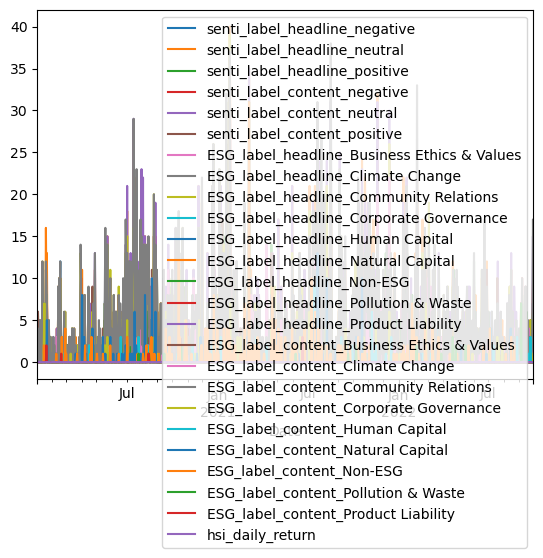

In [17]:
econ_group.plot()

In [18]:
econ_group.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1002 entries, 2020-01-03 to 2022-09-30
Freq: D
Data columns (total 25 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   senti_label_headline_negative                1002 non-null   uint8  
 1   senti_label_headline_neutral                 1002 non-null   uint8  
 2   senti_label_headline_positive                1002 non-null   uint8  
 3   senti_label_content_negative                 1002 non-null   uint8  
 4   senti_label_content_neutral                  1002 non-null   uint8  
 5   senti_label_content_positive                 1002 non-null   uint8  
 6   ESG_label_headline_Business Ethics & Values  1002 non-null   uint8  
 7   ESG_label_headline_Climate Change            1002 non-null   uint8  
 8   ESG_label_headline_Community Relations       1002 non-null   uint8  
 9   ESG_label_headline_Corporate Governance      100

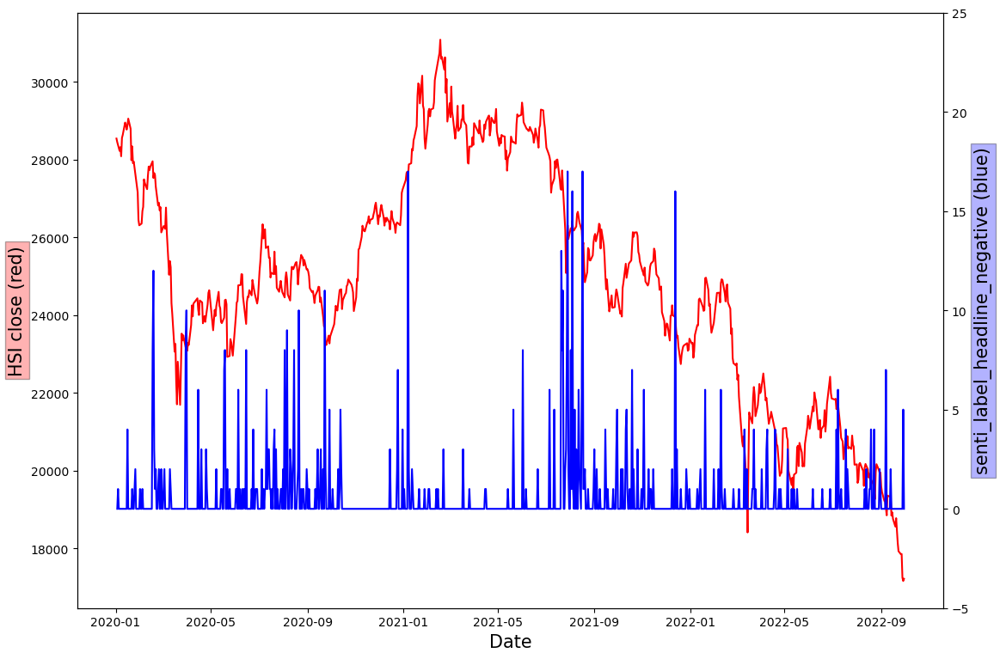

In [20]:
data_to_plot=econ_group["senti_label_headline_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(-5,25) 
plt.ylabel('senti_label_headline_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

In [21]:
import seaborn as sns

<AxesSubplot:>

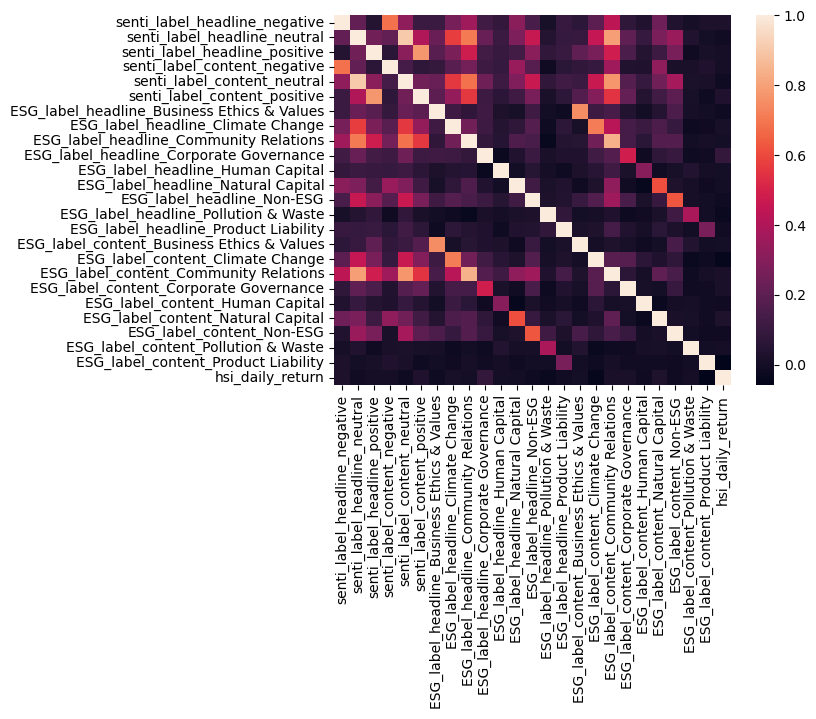

In [22]:
sns.heatmap(econ_group.corr())

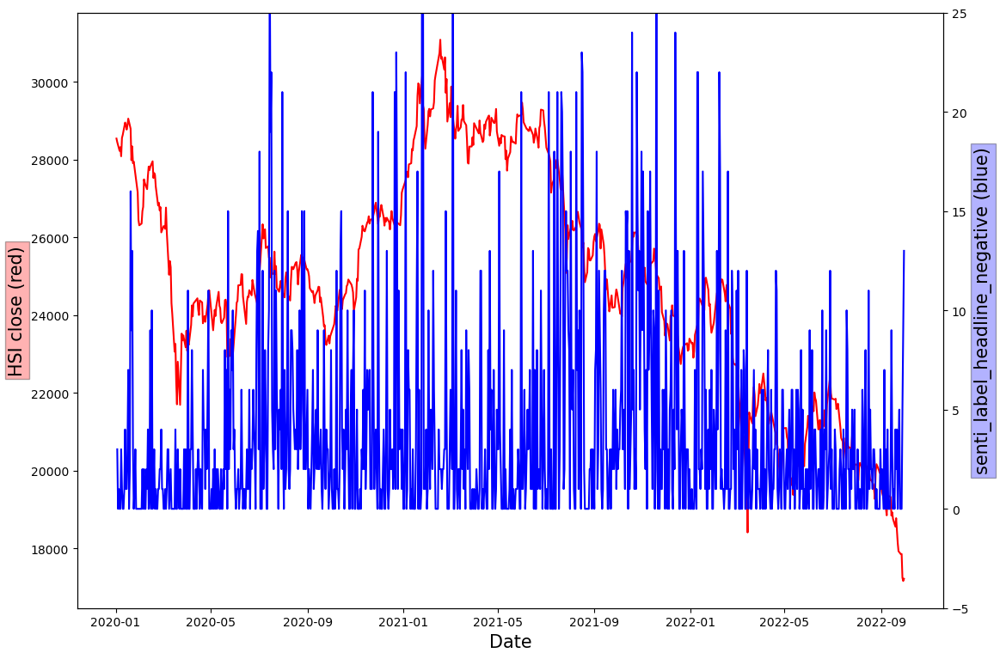

In [23]:
data_to_plot=econ_group["senti_label_headline_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(-5,25) 
plt.ylabel('senti_label_headline_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

In [24]:
econ_group.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1002 entries, 2020-01-03 to 2022-09-30
Freq: D
Data columns (total 25 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   senti_label_headline_negative                1002 non-null   uint8  
 1   senti_label_headline_neutral                 1002 non-null   uint8  
 2   senti_label_headline_positive                1002 non-null   uint8  
 3   senti_label_content_negative                 1002 non-null   uint8  
 4   senti_label_content_neutral                  1002 non-null   uint8  
 5   senti_label_content_positive                 1002 non-null   uint8  
 6   ESG_label_headline_Business Ethics & Values  1002 non-null   uint8  
 7   ESG_label_headline_Climate Change            1002 non-null   uint8  
 8   ESG_label_headline_Community Relations       1002 non-null   uint8  
 9   ESG_label_headline_Corporate Governance      100

In [25]:
econ_group["ESG_average"]=(econ_group.iloc[:,6:24].sum(axis=1))/18;econ_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,ESG_average
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,3,0,0,3,0,0,0,1,0,...,0,3,0,0,0,0,0,0,-0.003224,0.333333
2020-01-04,1,0,6,0,1,6,0,3,3,0,...,3,4,0,0,0,0,0,0,0.000000,0.777778
2020-01-05,0,1,1,0,0,2,0,0,2,0,...,0,2,0,0,0,0,0,0,0.000000,0.222222
2020-01-06,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,-0.007919,0.000000
2020-01-07,0,0,2,0,0,2,0,0,2,0,...,0,2,0,0,0,0,0,0,0.003397,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,-0.004357,0.000000
2022-09-27,0,0,3,0,0,3,0,1,2,0,...,1,2,0,0,0,0,0,0,0.000290,0.333333
2022-09-28,0,5,0,0,3,2,0,0,5,0,...,0,5,0,0,0,0,0,0,-0.034122,0.555556


<AxesSubplot:>

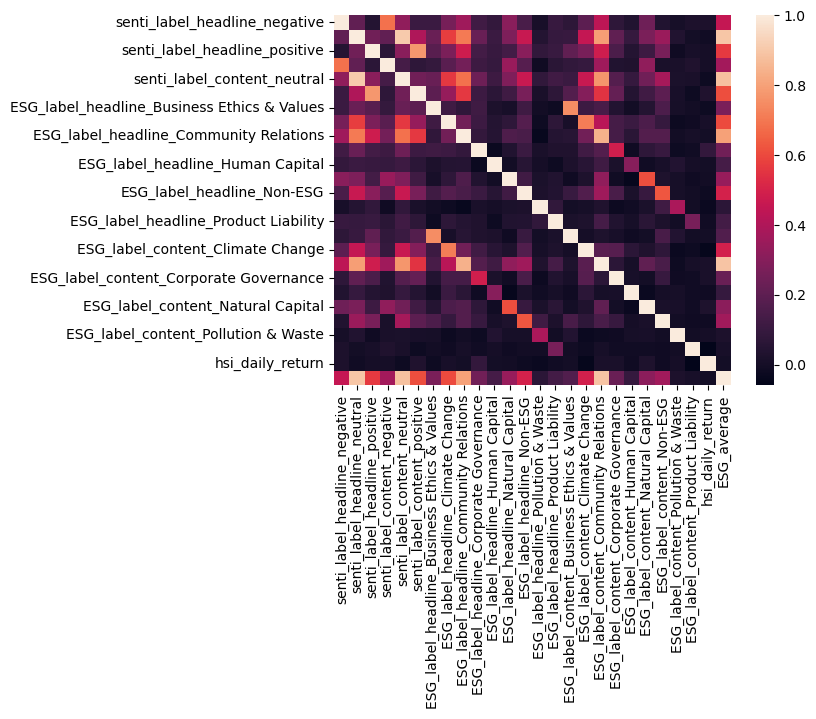

In [26]:
sns.heatmap(econ_group.corr())

In [27]:
name=[ a for a in econ_group.columns if a!="hsi_daily_return"];name

['senti_label_headline_negative',
 'senti_label_headline_neutral',
 'senti_label_headline_positive',
 'senti_label_content_negative',
 'senti_label_content_neutral',
 'senti_label_content_positive',
 'ESG_label_headline_Business Ethics & Values',
 'ESG_label_headline_Climate Change',
 'ESG_label_headline_Community Relations',
 'ESG_label_headline_Corporate Governance',
 'ESG_label_headline_Human Capital',
 'ESG_label_headline_Natural Capital',
 'ESG_label_headline_Non-ESG',
 'ESG_label_headline_Pollution & Waste',
 'ESG_label_headline_Product Liability',
 'ESG_label_content_Business Ethics & Values',
 'ESG_label_content_Climate Change',
 'ESG_label_content_Community Relations',
 'ESG_label_content_Corporate Governance',
 'ESG_label_content_Human Capital',
 'ESG_label_content_Natural Capital',
 'ESG_label_content_Non-ESG',
 'ESG_label_content_Pollution & Waste',
 'ESG_label_content_Product Liability',
 'ESG_average']

In [28]:
data_daily=econ_group[name].copy();data_daily

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,3,0,0,3,0,0,0,1,0,...,0,0,3,0,0,0,0,0,0,0.333333
2020-01-04,1,0,6,0,1,6,0,3,3,0,...,0,3,4,0,0,0,0,0,0,0.777778
2020-01-05,0,1,1,0,0,2,0,0,2,0,...,0,0,2,0,0,0,0,0,0,0.222222
2020-01-06,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
2020-01-07,0,0,2,0,0,2,0,0,2,0,...,0,0,2,0,0,0,0,0,0,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
2022-09-27,0,0,3,0,0,3,0,1,2,0,...,0,1,2,0,0,0,0,0,0,0.333333
2022-09-28,0,5,0,0,3,2,0,0,5,0,...,0,0,5,0,0,0,0,0,0,0.555556


In [29]:
from scipy import stats
data_daily=data_daily.apply(stats.zscore)
data_daily=data_daily.clip(lower=-2,upper=2);data_daily

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,-0.345230,-0.157090,-0.558912,-0.324071,-0.152959,-0.554060,-0.14041,-0.462530,-0.504811,-0.221086,...,-0.091516,-0.428071,-0.204261,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.419707
2020-01-04,0.164977,-0.737206,1.797454,-0.324071,-0.538047,1.558184,-0.14041,0.772252,-0.041393,-0.221086,...,-0.091516,0.982874,-0.015103,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,0.156779
2020-01-05,-0.345230,-0.543834,-0.166184,-0.324071,-0.730591,0.150021,-0.14041,-0.462530,-0.273102,-0.221086,...,-0.091516,-0.428071,-0.393420,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.563829
2020-01-06,-0.345230,-0.737206,-0.558912,-0.324071,-0.730591,-0.554060,-0.14041,-0.462530,-0.736520,-0.221086,...,-0.091516,-0.428071,-0.771738,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.852072
2020-01-07,-0.345230,-0.737206,0.226543,-0.324071,-0.730591,0.150021,-0.14041,-0.462530,-0.273102,-0.221086,...,-0.091516,-0.428071,-0.393420,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.563829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,-0.345230,-0.737206,-0.558912,-0.324071,-0.730591,-0.554060,-0.14041,-0.462530,-0.736520,-0.221086,...,-0.091516,-0.428071,-0.771738,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.852072
2022-09-27,-0.345230,-0.737206,0.619271,-0.324071,-0.730591,0.502062,-0.14041,-0.050936,-0.273102,-0.221086,...,-0.091516,0.042244,-0.393420,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.419707
2022-09-28,-0.345230,0.229653,-0.558912,-0.324071,-0.152959,0.150021,-0.14041,-0.462530,0.422025,-0.221086,...,-0.091516,-0.428071,0.174056,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.131464


In [30]:
data_daily['hsi_daily_return']=econ_group['hsi_daily_return'];data_daily

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,-0.345230,-0.157090,-0.558912,-0.324071,-0.152959,-0.554060,-0.14041,-0.462530,-0.504811,-0.221086,...,-0.428071,-0.204261,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.419707,-0.003224
2020-01-04,0.164977,-0.737206,1.797454,-0.324071,-0.538047,1.558184,-0.14041,0.772252,-0.041393,-0.221086,...,0.982874,-0.015103,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,0.156779,0.000000
2020-01-05,-0.345230,-0.543834,-0.166184,-0.324071,-0.730591,0.150021,-0.14041,-0.462530,-0.273102,-0.221086,...,-0.428071,-0.393420,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.563829,0.000000
2020-01-06,-0.345230,-0.737206,-0.558912,-0.324071,-0.730591,-0.554060,-0.14041,-0.462530,-0.736520,-0.221086,...,-0.428071,-0.771738,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.852072,-0.007919
2020-01-07,-0.345230,-0.737206,0.226543,-0.324071,-0.730591,0.150021,-0.14041,-0.462530,-0.273102,-0.221086,...,-0.428071,-0.393420,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.563829,0.003397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,-0.345230,-0.737206,-0.558912,-0.324071,-0.730591,-0.554060,-0.14041,-0.462530,-0.736520,-0.221086,...,-0.428071,-0.771738,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.852072,-0.004357
2022-09-27,-0.345230,-0.737206,0.619271,-0.324071,-0.730591,0.502062,-0.14041,-0.050936,-0.273102,-0.221086,...,0.042244,-0.393420,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.419707,0.000290
2022-09-28,-0.345230,0.229653,-0.558912,-0.324071,-0.152959,0.150021,-0.14041,-0.462530,0.422025,-0.221086,...,-0.428071,0.174056,-0.190632,-0.196974,-0.196347,-0.265828,-0.085074,-0.057191,-0.131464,-0.034122


In [31]:
data_train=data_daily[:600]
data_test=data_daily[600:]

In [32]:
x_train=data_train[name]
y_train=data_train["hsi_daily_return"]
X_train_shift = x_train.values
Y_train_shift = y_train.values
x_test=data_test[name]
y_test=data_test["hsi_daily_return"]
X_test_shift = x_test.values
Y_test_shift = y_test.values

In [33]:
X_train_shift

array([[-0.34523014, -0.15709041, -0.55891167, ..., -0.0850743 ,
        -0.05719099, -0.41970733],
       [ 0.16497723, -0.73720561,  1.79745365, ..., -0.0850743 ,
        -0.05719099,  0.15677896],
       [-0.34523014, -0.54383387, -0.16618411, ..., -0.0850743 ,
        -0.05719099, -0.5638289 ],
       ...,
       [-0.34523014, -0.73720561, -0.55891167, ..., -0.0850743 ,
        -0.05719099, -0.85207205],
       [-0.34523014, -0.73720561, -0.16618411, ..., -0.0850743 ,
        -0.05719099, -0.70795047],
       [ 0.16497723, -0.73720561, -0.55891167, ..., -0.0850743 ,
        -0.05719099, -0.70795047]])

In [34]:
X_test_shift

array([[-0.34523014, -0.73720561, -0.55891167, ..., -0.0850743 ,
        -0.05719099, -0.85207205],
       [-0.34523014, -0.35046214, -0.16618411, ..., -0.0850743 ,
        -0.05719099, -0.41970733],
       [-0.34523014, -0.35046214, -0.55891167, ..., -0.0850743 ,
        -0.05719099, -0.5638289 ],
       ...,
       [-0.34523014,  0.22965306, -0.55891167, ..., -0.0850743 ,
        -0.05719099, -0.13146419],
       [ 2.        ,  1.00313999,  1.01199854, ..., -0.0850743 ,
        -0.05719099,  1.74211624],
       [-0.34523014,  1.77662692, -0.55891167, ..., -0.0850743 ,
        -0.05719099,  1.02150838]])

In [35]:
scaler = preprocessing.MinMaxScaler()
X_train_trans = scaler.fit_transform(X_train_shift)
# X_test_trans=scaler.fit_transform(X_test_shift)

from sklearn.linear_model import LinearRegression
clf = LinearRegression().fit(X_train_trans,Y_train_shift)
Y_train_pred = clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({'Actual': Y_train_shift, 'Predicted': Y_train_pred})


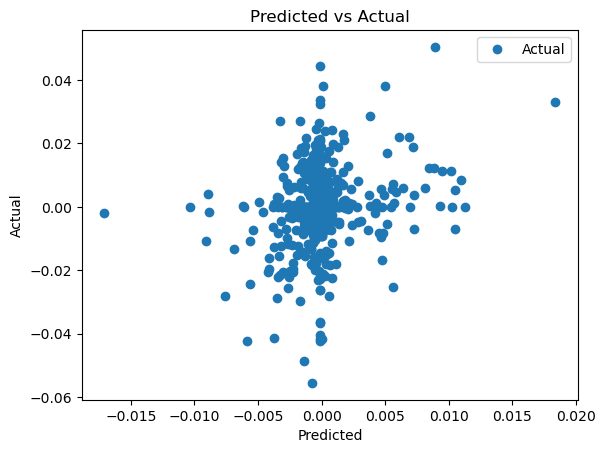

In [36]:
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [37]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.007182958885764865
Mean Squared Error: 0.00012774993519588617
Root Mean Squared Error: 0.011302651688691738
R-square: 0.051580184864947864


In [38]:
clf.coef_

array([-2.16666365e-03, -2.60191303e-03, -1.51165186e-03,  7.79918796e-04,
        3.28937743e-03,  3.85026620e-03, -4.38727180e-03,  3.62183447e-03,
       -2.58936383e-03,  8.30926549e-03,  4.28105843e-04, -1.81366609e-03,
        2.59819258e-04,  8.44070331e-03,  1.02012811e-02,  7.76548208e-04,
       -3.98164311e-03,  2.24621495e-03, -2.07401489e-03, -3.89325977e-04,
       -2.46630445e-03, -3.48757525e-03, -4.65136893e-03, -1.86406297e-02,
        5.80563062e-05])

In [39]:
train_act_pred

,Actual,Predicted
0,-0.003224,0.000359
1,0.000000,0.000942
2,0.000000,0.000376
3,-0.007919,-0.000143
4,0.003397,0.000328
...,...,...
595,-0.018431,-0.000748
596,0.000000,-0.000143
597,0.000000,-0.000143
598,0.010458,0.000035


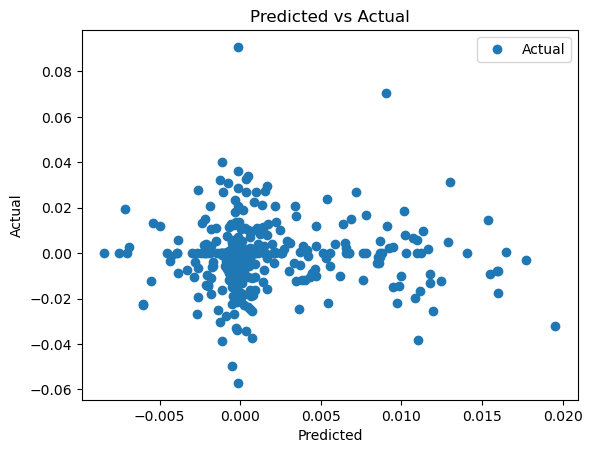

In [40]:
X_test_trans = scaler.transform(X_test_shift)
Y_test_pred = clf.predict(X_test_trans)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [41]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.009264393072820464
Mean Squared Error: 0.00021393407060475635
Root Mean Squared Error: 0.014626485244403603
R-square: -0.13048515151816042


In [42]:
test_act_pred

,Actual,Predicted
0,-0.001320,-0.000143
1,-0.010830,-0.000037
2,-0.000307,-0.001062
3,0.000000,0.000708
4,0.000000,-0.000143
...,...,...
397,-0.004357,-0.000143
398,0.000290,0.000464
399,-0.034122,0.000380
400,-0.004928,0.000889


In [43]:
overall_hsi=pd.concat([train_act_pred,test_act_pred],ignore_index=True);overall_hsi

,Actual,Predicted
0,-0.003224,0.000359
1,0.000000,0.000942
2,0.000000,0.000376
3,-0.007919,-0.000143
4,0.003397,0.000328
...,...,...
997,-0.004357,-0.000143
998,0.000290,0.000464
999,-0.034122,0.000380
1000,-0.004928,0.000889


<AxesSubplot:>

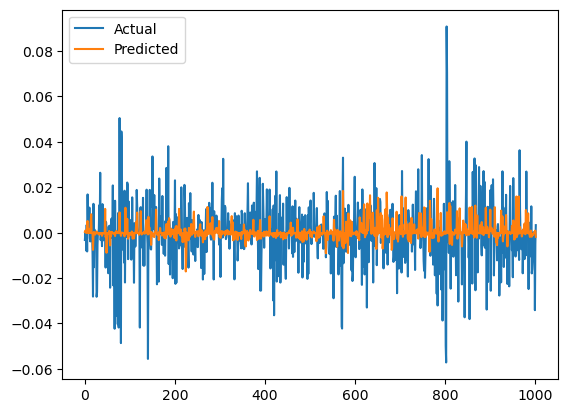

In [44]:
overall_hsi.plot()

In [47]:
overall_hsi["Actual_accu_return"]=overall_hsi["Actual"]+1
overall_hsi["Predicted_accu_return"]=overall_hsi["Predicted"]+1;overall_hsi

,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,0.000359,0.996776,1.000359
1,0.000000,0.000942,1.000000,1.000942
2,0.000000,0.000376,1.000000,1.000376
3,-0.007919,-0.000143,0.992081,0.999857
4,0.003397,0.000328,1.003397,1.000328
...,...,...,...,...
997,-0.004357,-0.000143,0.995643,0.999857
998,0.000290,0.000464,1.000290,1.000464
999,-0.034122,0.000380,0.965878,1.000380
1000,-0.004928,0.000889,0.995072,1.000889


In [49]:
overall_hsi["Actual_accu_return"]=overall_hsi['Actual_accu_return'].cumprod()
overall_hsi["Predicted_accu_return"]=overall_hsi['Predicted_accu_return'].cumprod();overall_hsi

,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,0.000359,0.996776,1.000359
1,0.000000,0.000942,0.996776,1.001301
2,0.000000,0.000376,0.996776,1.001677
3,-0.007919,-0.000143,0.988883,1.001534
4,0.003397,0.000328,0.992241,1.001862
...,...,...,...,...
997,-0.004357,-0.000143,0.625541,1.618119
998,0.000290,0.000464,0.625722,1.618870
999,-0.034122,0.000380,0.604371,1.619484
1000,-0.004928,0.000889,0.601393,1.620924


<AxesSubplot:>

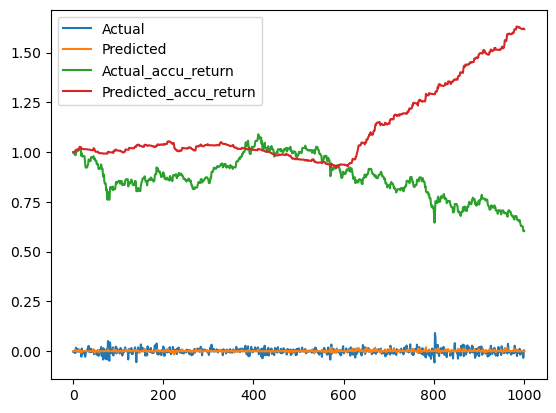

In [51]:
overall_hsi.plot()


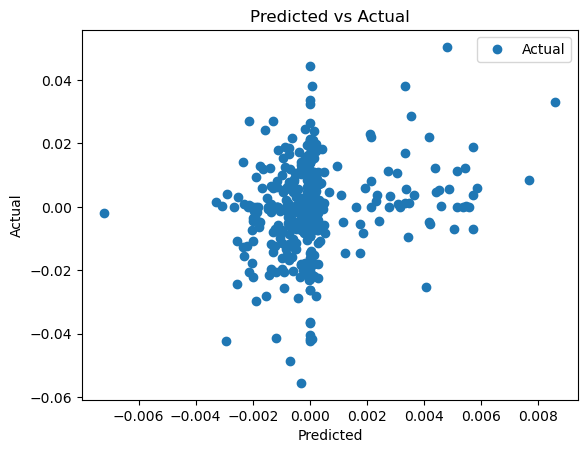

In [54]:
from sklearn.linear_model import Lasso
clf=Lasso(alpha=0.00005, fit_intercept=False)
clf.fit(X_train_trans, Y_train_shift)
Y_train_pred=clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({"Actual": Y_train_shift, "Predicted": Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [55]:
clf.coef_

array([-0.0007336 , -0.        ,  0.        , -0.        , -0.        ,
        0.00048475, -0.00124114,  0.00028981, -0.        ,  0.00542684,
       -0.        , -0.00017351, -0.        ,  0.0025454 ,  0.00515307,
       -0.        , -0.00040151,  0.        , -0.        ,  0.        ,
       -0.00081675, -0.0022182 , -0.        , -0.0068296 , -0.        ])

In [56]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.007058320451296696
Mean Squared Error: 0.00013007954316915344
Root Mean Squared Error: 0.011405241916292413
R-square: 0.0342850969265045


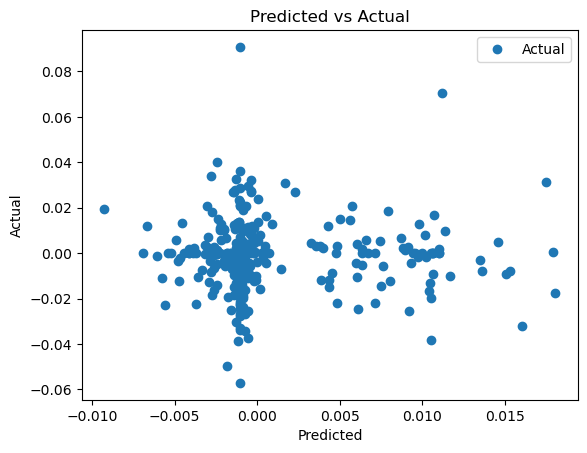

In [57]:
Y_test_pred = clf.predict(X_test_shift)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [58]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.009383246756115574
Mean Squared Error: 0.00021143902370583046
Root Mean Squared Error: 0.014540943012949004
R-square: -0.11730065283777846


In [59]:
overall_hsi_lasso=pd.concat([train_act_pred,test_act_pred],ignore_index=True);overall_hsi_lasso

,Actual,Predicted
0,-0.003224,0.000000
1,0.000000,0.000153
2,0.000000,0.000134
3,-0.007919,0.000000
4,0.003397,0.000134
...,...,...
997,-0.004357,-0.001048
998,0.000290,-0.000605
999,-0.034122,-0.000707
1000,-0.004928,-0.002445


In [60]:
overall_hsi_lasso["Actual_accu_return"]=overall_hsi_lasso["Actual"]+1
overall_hsi_lasso["Predicted_accu_return"]=overall_hsi_lasso["Predicted"]+1

overall_hsi_lasso["Actual_accu_return"]=overall_hsi_lasso['Actual_accu_return'].cumprod()
overall_hsi_lasso["Predicted_accu_return"]=overall_hsi_lasso['Predicted_accu_return'].cumprod();overall_hsi_lasso

,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,0.000000,0.996776,1.000000
1,0.000000,0.000153,0.996776,1.000153
2,0.000000,0.000134,0.996776,1.000287
3,-0.007919,0.000000,0.988883,1.000287
4,0.003397,0.000134,0.992241,1.000421
...,...,...,...,...
997,-0.004357,-0.001048,0.625541,1.184209
998,0.000290,-0.000605,0.625722,1.183492
999,-0.034122,-0.000707,0.604371,1.182655
1000,-0.004928,-0.002445,0.601393,1.179764


<AxesSubplot:>

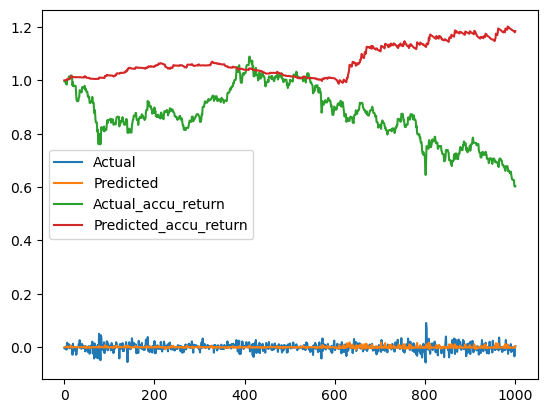

In [61]:
overall_hsi_lasso.plot()

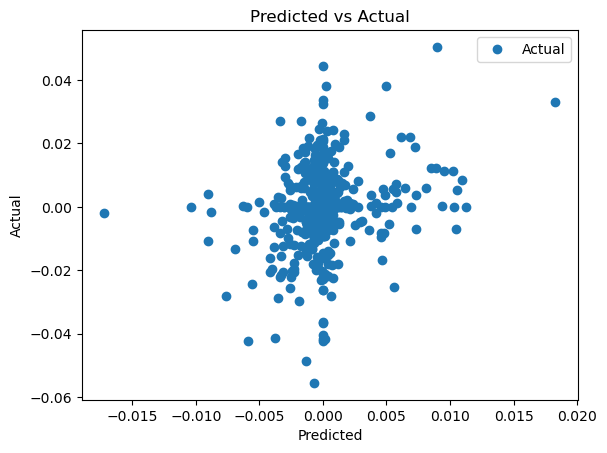

In [62]:
from sklearn.linear_model import Ridge
clf=Ridge(alpha=0.00001, fit_intercept=False)
clf.fit(X_train_trans, Y_train_shift)
Y_train_pred=clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({"Actual": Y_train_shift, "Predicted": Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [63]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.007157221614573883
Mean Squared Error: 0.000127759781499104
Root Mean Squared Error: 0.011303087255219434
R-square: 0.05150708557872652


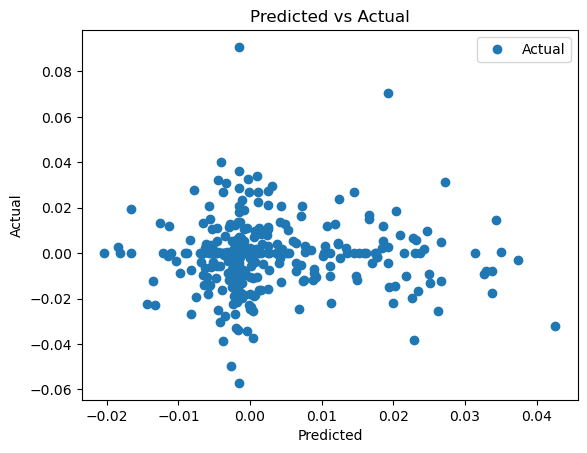

In [64]:
Y_test_pred = clf.predict(X_test_shift)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [65]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.011285643768720205
Mean Squared Error: 0.0002893899045964433
Root Mean Squared Error: 0.017011463916913303
R-square: -0.5292140668418746


In [66]:
overall_hsi_ridge=pd.concat([train_act_pred,test_act_pred],ignore_index=True)
overall_hsi_ridge["Actual_accu_return"]=overall_hsi_ridge["Actual"]+1
overall_hsi_ridge["Predicted_accu_return"]=overall_hsi_ridge["Predicted"]+1

overall_hsi_ridge["Actual_accu_return"]=overall_hsi_ridge['Actual_accu_return'].cumprod()
overall_hsi_ridge["Predicted_accu_return"]=overall_hsi_ridge['Predicted_accu_return'].cumprod();overall_hsi_ridge


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,0.000473,0.996776,1.000473
1,0.000000,0.000981,0.996776,1.001454
2,0.000000,0.000488,0.996776,1.001944
3,-0.007919,0.000000,0.988883,1.001944
4,0.003397,0.000438,0.992241,1.002382
...,...,...,...,...
997,-0.004357,-0.001467,0.625541,2.133011
998,0.000290,-0.000007,0.625722,2.132996
999,-0.034122,-0.000395,0.604371,2.132154
1000,-0.004928,0.001766,0.601393,2.135919


<AxesSubplot:>

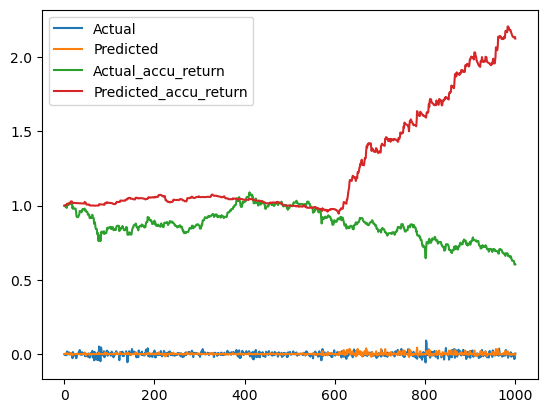

In [67]:
overall_hsi_ridge.plot()

In [73]:
hsi_data=pd.read_csv("C:/Users/attil/Downloads/HSI_with_sentiment (1).csv");hsi_data

,Unnamed: 0,Date,Open,High,Low,Close,Adj Close,Volume,non_view_engagements,comment_count,...,ESG_label_headline_Natural Capital,ESG_label_headline_Non-ESG,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive
0,0,2020-01-10,28665.140625,28665.140625,28504.269531,28638.199219,28638.199219,1448401000,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0
1,1,2020-01-13,28772.369141,28971.400391,28671.839844,28954.939453,28954.939453,1765055700,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0
2,2,2020-01-14,29149.529297,29149.529297,28790.490234,28885.140625,28885.140625,1643504700,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0
3,3,2020-01-15,28891.070313,28972.679688,28619.099609,28773.589844,28773.589844,1240120700,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0
4,4,2020-01-16,28806.119141,28987.730469,28709.570313,28883.039063,28883.039063,1620926200,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
666,666,2022-09-26,17781.869141,18077.640625,17727.400391,17855.140625,17855.140625,2557096600,0.0,0.0,...,0.0,81.0,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0
667,667,2022-09-27,17838.650391,17904.210938,17648.419922,17860.310547,17860.310547,1900500000,14.0,0.0,...,0.0,86.0,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0
668,668,2022-09-28,17703.390625,17703.390625,17184.539063,17250.880859,17250.880859,2948457300,0.0,0.0,...,6.0,107.0,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0
669,669,2022-09-29,17570.169922,17629.669922,17046.830078,17165.869141,17165.869141,2534665600,0.0,0.0,...,0.0,102.0,0.0,0.0,0.0,153.0,12.0,0.0,145.0,20.0


In [74]:
hsi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671 entries, 0 to 670
Data columns (total 50 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Unnamed: 0                                   671 non-null    int64  
 1   Date                                         671 non-null    object 
 2   Open                                         671 non-null    float64
 3   High                                         671 non-null    float64
 4   Low                                          671 non-null    float64
 5   Close                                        671 non-null    float64
 6   Adj Close                                    671 non-null    float64
 7   Volume                                       671 non-null    int64  
 8   non_view_engagements                         671 non-null    float64
 9   comment_count                                671 non-null    float64
 10  li

In [75]:
hsi_data1=hsi_data.drop(["Unnamed: 0","Volume", "Open","High", "Low","Close","Adj Close","pubdate.1","sentiment_headline","sentiment_content","ESG_label_score_headline","ESG_label_score_content"],axis=1);hsi_data1

,Date,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,ESG_label_headline_Natural Capital,ESG_label_headline_Non-ESG,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive
0,2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0
1,2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0
2,2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0
3,2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0
4,2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
666,2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,81.0,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0
667,2022-09-27,14.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,86.0,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0
668,2022-09-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.0,107.0,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0
669,2022-09-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,102.0,0.0,0.0,0.0,153.0,12.0,0.0,145.0,20.0


In [76]:
hsi_data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671 entries, 0 to 670
Data columns (total 38 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Date                                         671 non-null    object 
 1   non_view_engagements                         671 non-null    float64
 2   comment_count                                671 non-null    float64
 3   like_count                                   671 non-null    float64
 4   dislike_count                                671 non-null    float64
 5   love_count                                   671 non-null    float64
 6   haha_count                                   671 non-null    float64
 7   wow_count                                    671 non-null    float64
 8   angry_count                                  671 non-null    float64
 9   sad_count                                    671 non-null    float64
 10  sh

<AxesSubplot:>

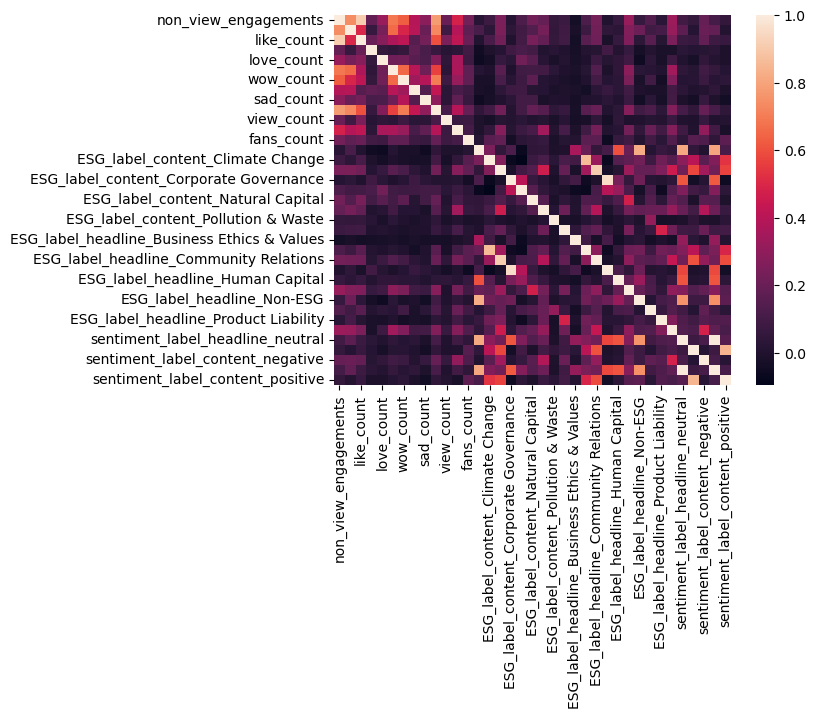

In [77]:
sns.heatmap(hsi_data1.corr())

In [80]:
hsi_data1["ESG_average"]=(hsi_data1.iloc[:,14:32].sum(axis=1))/18

In [81]:
hsi_data1

,Date,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,ESG_label_headline_Non-ESG,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average
0,2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.444444
1,2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0,1.000000
2,2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0,1.444444
3,2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0,1.666667
4,2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0,1.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
666,2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,81.0,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0,13.000000
667,2022-09-27,14.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,...,86.0,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0,11.888889
668,2022-09-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,107.0,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0,20.888889
669,2022-09-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,102.0,0.0,0.0,0.0,153.0,12.0,0.0,145.0,20.0,18.333333


In [82]:
hsi_data1["Date"]=pd.to_datetime(hsi_data1["Date"])

In [84]:
hsi_daily

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2020-01-02,28249.369141,28543.519531,28245.970703,28543.519531,28543.519531,1262732800,0.012550
2020-01-03,28828.359375,28883.300781,28428.169922,28451.500000,28451.500000,1797904800,-0.003224
2020-01-06,28326.500000,28367.869141,28054.289063,28226.189453,28226.189453,1793426600,-0.007919
2020-01-07,28352.679688,28473.080078,28264.070313,28322.060547,28322.060547,1302687200,0.003397
2020-01-08,27999.580078,28198.609375,27857.730469,28087.919922,28087.919922,1709241600,-0.008267
...,...,...,...,...,...,...,...
2022-09-26,17781.869141,18077.640625,17727.400391,17855.140625,17855.140625,2557096600,-0.004357
2022-09-27,17838.650391,17904.210938,17648.419922,17860.310547,17860.310547,1900500000,0.000290
2022-09-28,17703.390625,17703.390625,17184.539063,17250.880859,17250.880859,2948457300,-0.034122


In [85]:
hsi_daily.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 679 entries, 2020-01-02 to 2022-09-30
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          679 non-null    float64
 1   High          679 non-null    float64
 2   Low           679 non-null    float64
 3   Close         679 non-null    float64
 4   Adj Close     679 non-null    float64
 5   Volume        679 non-null    int64  
 6   Daily_return  679 non-null    float64
dtypes: float64(6), int64(1)
memory usage: 58.6 KB


In [88]:
hsi_daily.head(10)

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2020-01-02,28249.369141,28543.519531,28245.970703,28543.519531,28543.519531,1262732800,0.012550
2020-01-03,28828.359375,28883.300781,28428.169922,28451.500000,28451.500000,1797904800,-0.003224
2020-01-06,28326.500000,28367.869141,28054.289063,28226.189453,28226.189453,1793426600,-0.007919
2020-01-07,28352.679688,28473.080078,28264.070313,28322.060547,28322.060547,1302687200,0.003397
2020-01-08,27999.580078,28198.609375,27857.730469,28087.919922,28087.919922,1709241600,-0.008267
2020-01-09,28367.650391,28561.000000,28325.859375,28561.000000,28561.000000,1692786200,0.016843
2020-01-10,28665.140625,28665.140625,28504.269531,28638.199219,28638.199219,1448401000,0.002703
2020-01-13,28772.369141,28971.400391,28671.839844,28954.939453,28954.939453,1765055700,0.011060
2020-01-14,29149.529297,29149.529297,28790.490234,28885.140625,28885.140625,1643504700,-0.002411


In [87]:
hsi_data1.set_index(["Date"],inplace=True)
hsi_data1["hsi_daily_return"]=hsi_daily["Daily_return"];hsi_data1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.444444,0.002703
2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0,1.000000,0.011060
2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0,1.444444,-0.002411
2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0,1.666667,-0.003862
2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0,1.222222,0.003804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0,13.000000,-0.004357
2022-09-27,14.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0,11.888889,0.000290
2022-09-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0,20.888889,-0.034122


In [89]:
hsi_data1.fillna(value=0,inplace=True)

In [90]:
hsi_data1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.444444,0.002703
2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0,1.000000,0.011060
2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0,1.444444,-0.002411
2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0,1.666667,-0.003862
2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0,1.222222,0.003804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0,13.000000,-0.004357
2022-09-27,14.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0,11.888889,0.000290
2022-09-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0,20.888889,-0.034122


<AxesSubplot:>

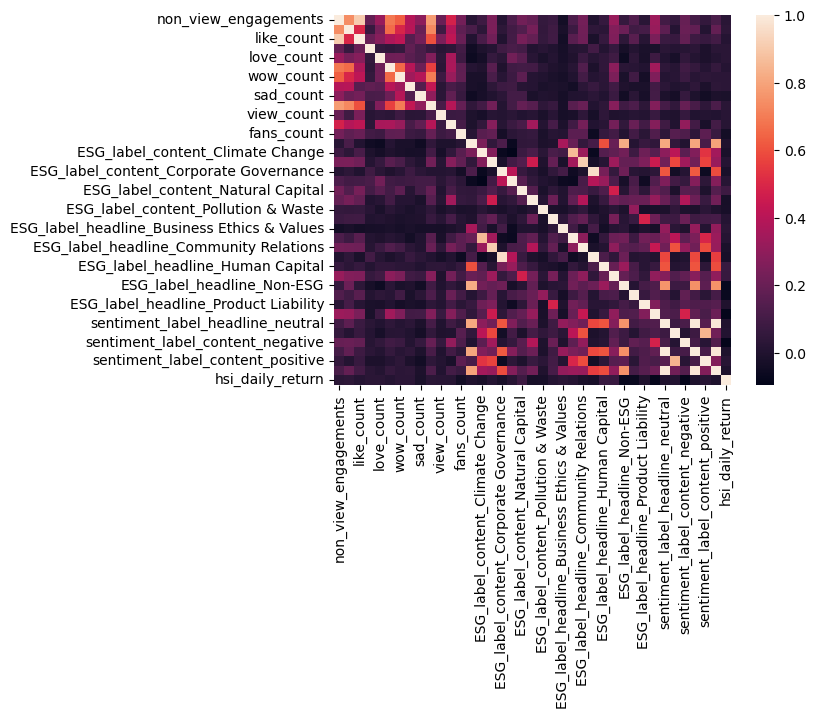

In [92]:
sns.heatmap(hsi_data1.corr())

In [93]:
hsi_data1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 671 entries, 2020-01-10 to 2022-09-30
Data columns (total 39 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         671 non-null    float64
 1   comment_count                                671 non-null    float64
 2   like_count                                   671 non-null    float64
 3   dislike_count                                671 non-null    float64
 4   love_count                                   671 non-null    float64
 5   haha_count                                   671 non-null    float64
 6   wow_count                                    671 non-null    float64
 7   angry_count                                  671 non-null    float64
 8   sad_count                                    671 non-null    float64
 9   share_count                                  671 non-null

In [94]:
hsi_daily

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2020-01-02,28249.369141,28543.519531,28245.970703,28543.519531,28543.519531,1262732800,0.012550
2020-01-03,28828.359375,28883.300781,28428.169922,28451.500000,28451.500000,1797904800,-0.003224
2020-01-06,28326.500000,28367.869141,28054.289063,28226.189453,28226.189453,1793426600,-0.007919
2020-01-07,28352.679688,28473.080078,28264.070313,28322.060547,28322.060547,1302687200,0.003397
2020-01-08,27999.580078,28198.609375,27857.730469,28087.919922,28087.919922,1709241600,-0.008267
...,...,...,...,...,...,...,...
2022-09-26,17781.869141,18077.640625,17727.400391,17855.140625,17855.140625,2557096600,-0.004357
2022-09-27,17838.650391,17904.210938,17648.419922,17860.310547,17860.310547,1900500000,0.000290
2022-09-28,17703.390625,17703.390625,17184.539063,17250.880859,17250.880859,2948457300,-0.034122


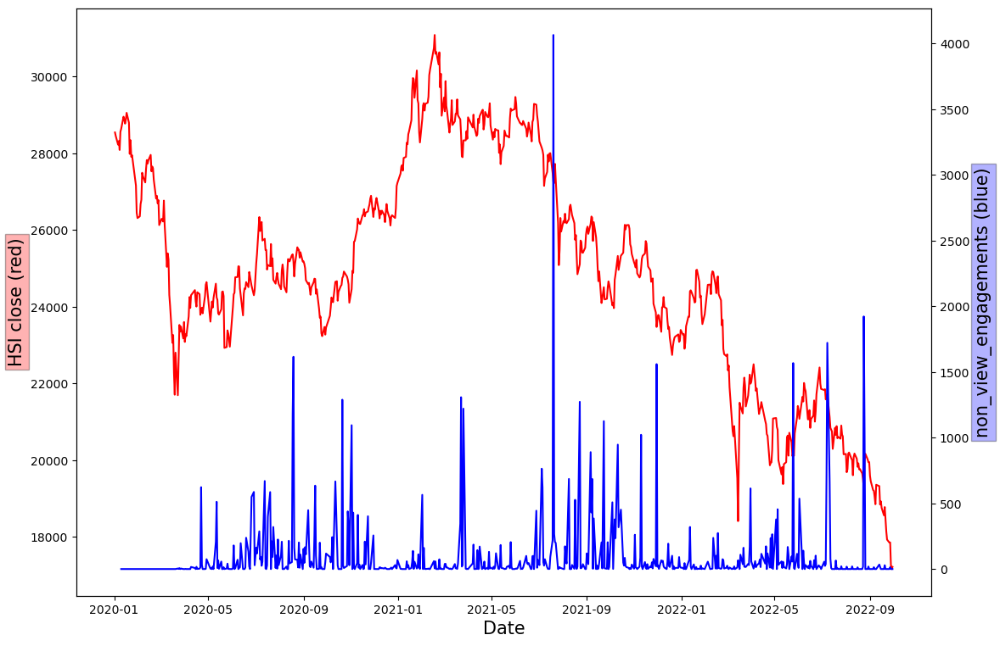

In [95]:
data_to_plot=hsi_data1["non_view_engagements"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(45000,-5000) 
plt.ylabel('non_view_engagements (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

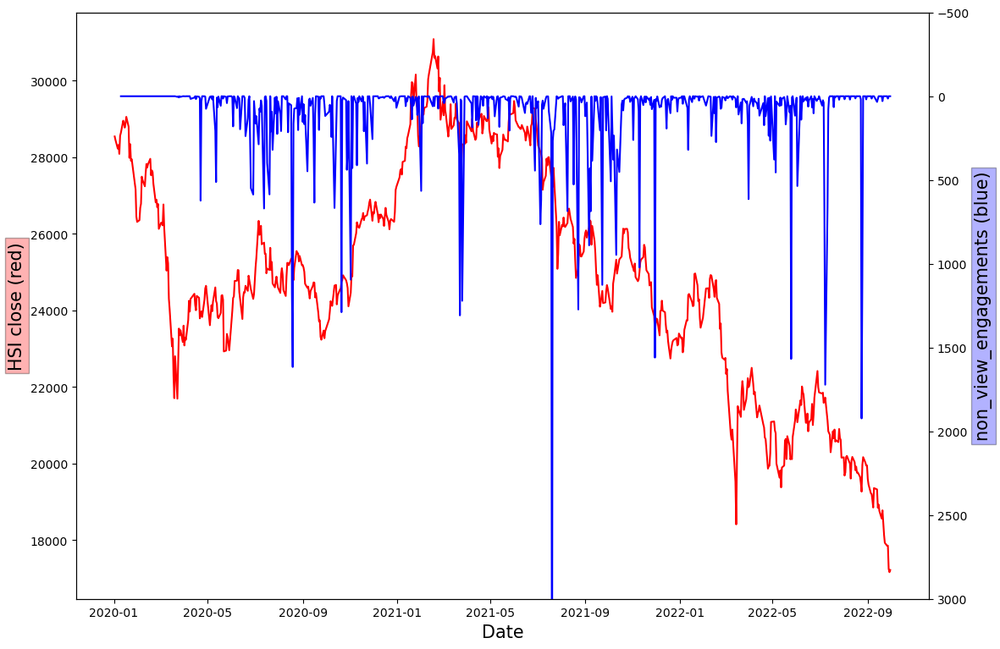

In [97]:
data_to_plot=hsi_data1["non_view_engagements"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(3000,-500) 
plt.ylabel('non_view_engagements (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

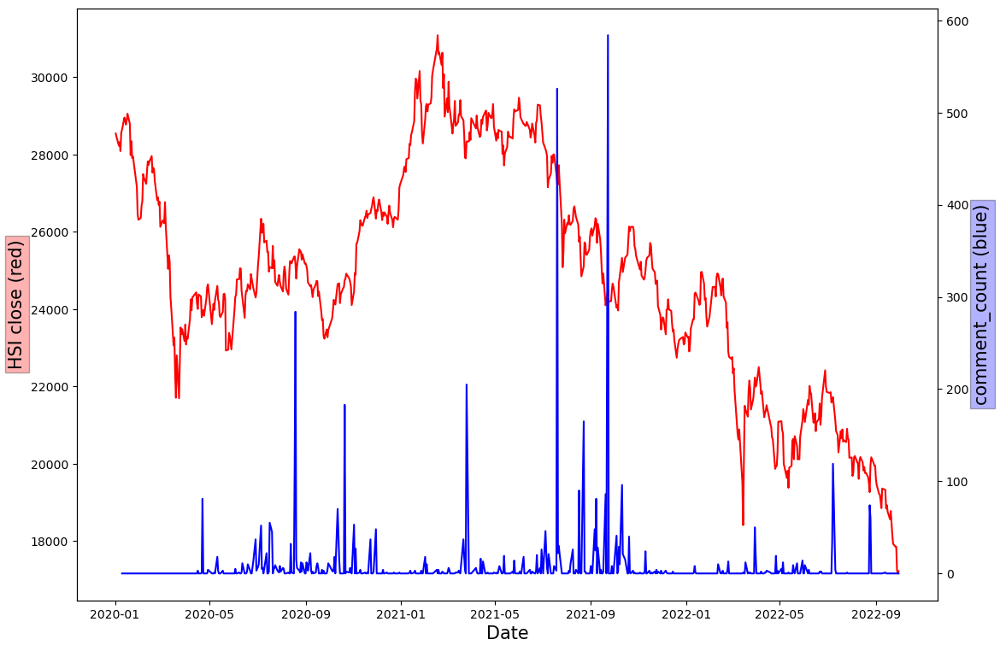

In [98]:
data_to_plot=hsi_data1["comment_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('comment_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

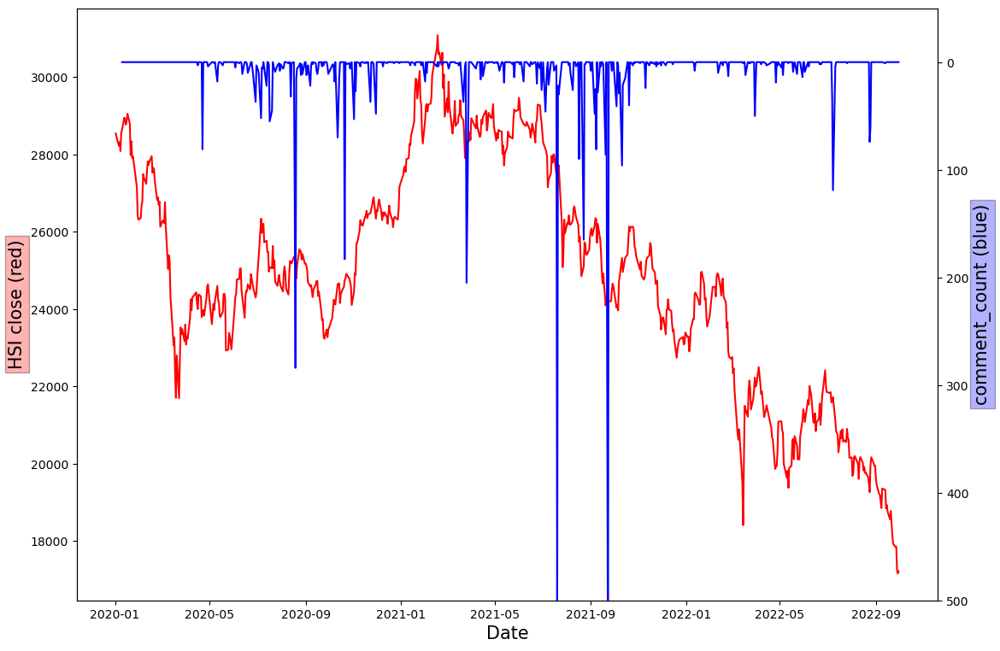

In [99]:
data_to_plot=hsi_data1["comment_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(500,-50) 
plt.ylabel('comment_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

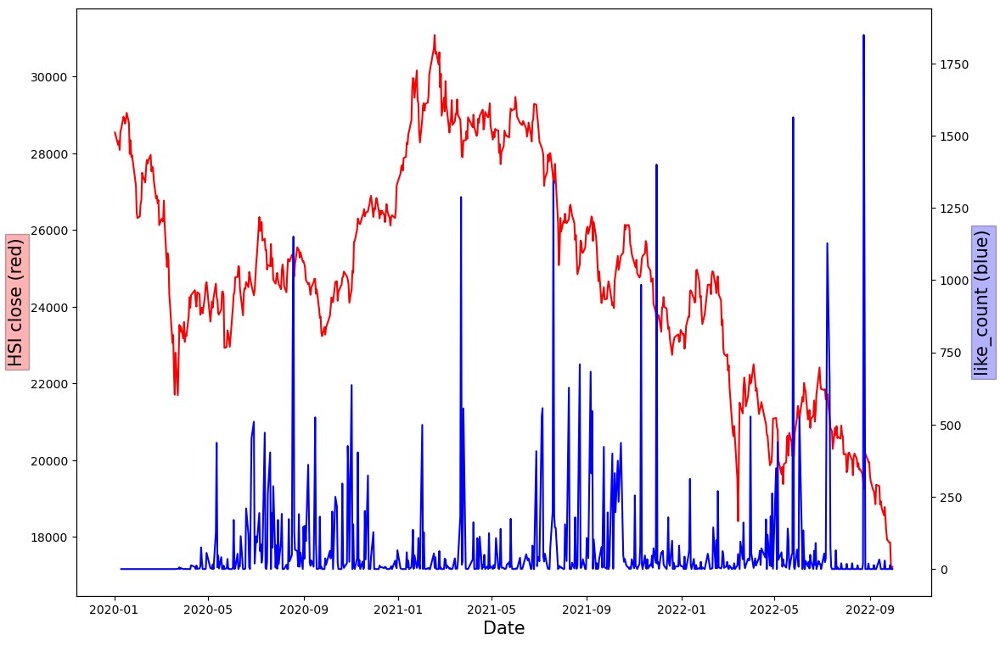

In [100]:
data_to_plot=hsi_data1["like_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('like_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

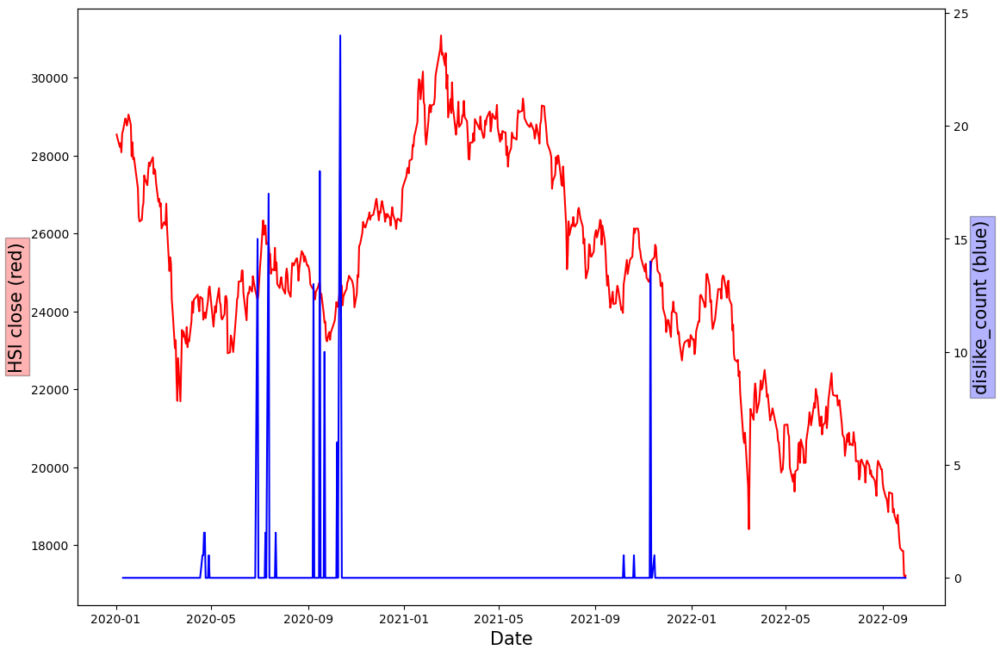

In [101]:
data_to_plot=hsi_data1["dislike_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('dislike_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

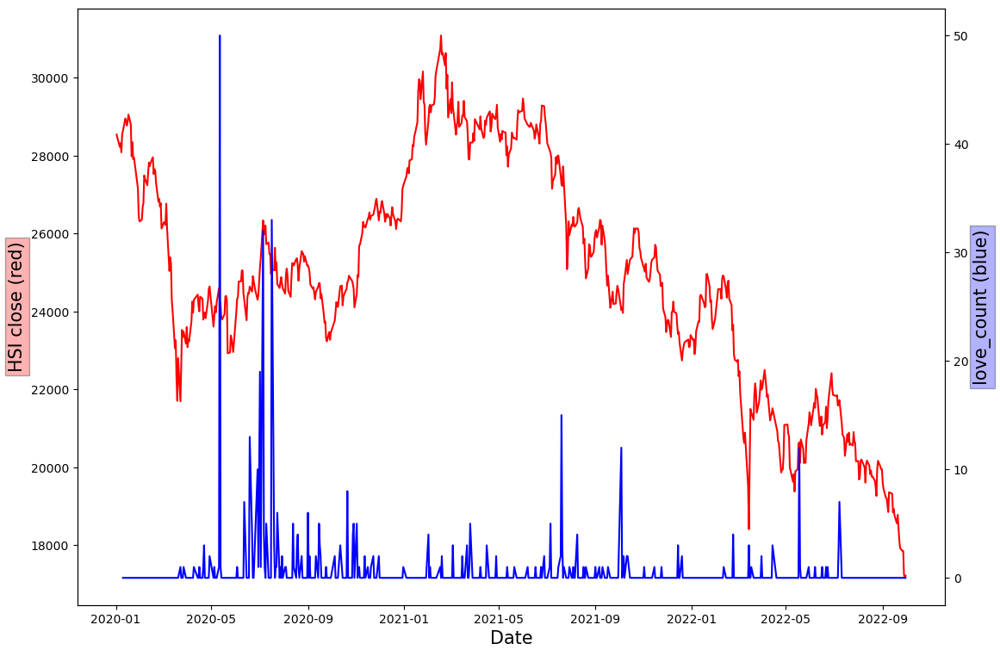

In [102]:
data_to_plot=hsi_data1["love_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('love_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

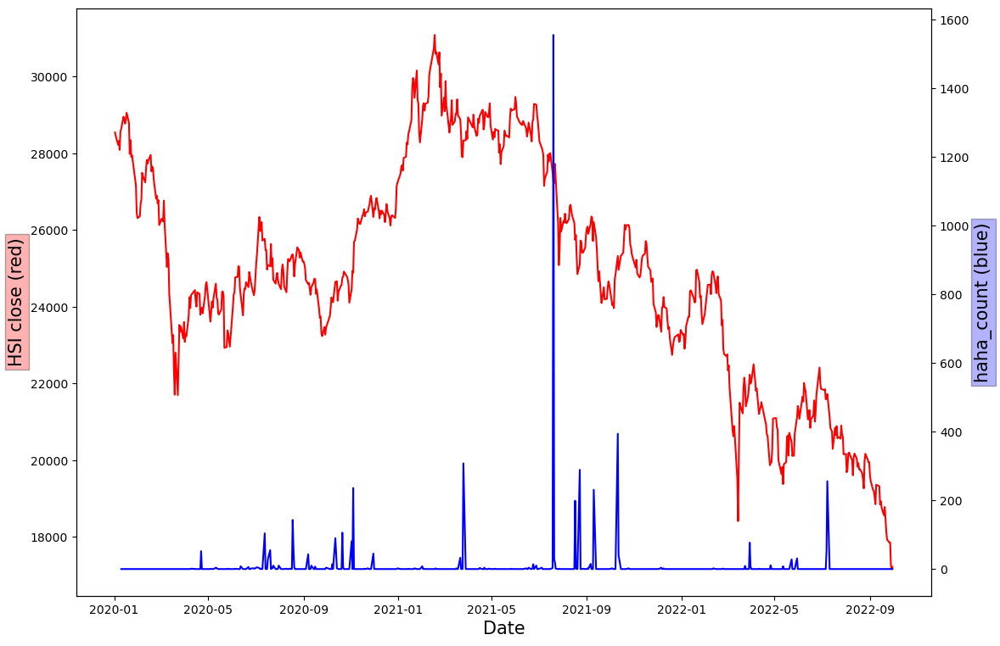

In [103]:
data_to_plot=hsi_data1["haha_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('haha_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

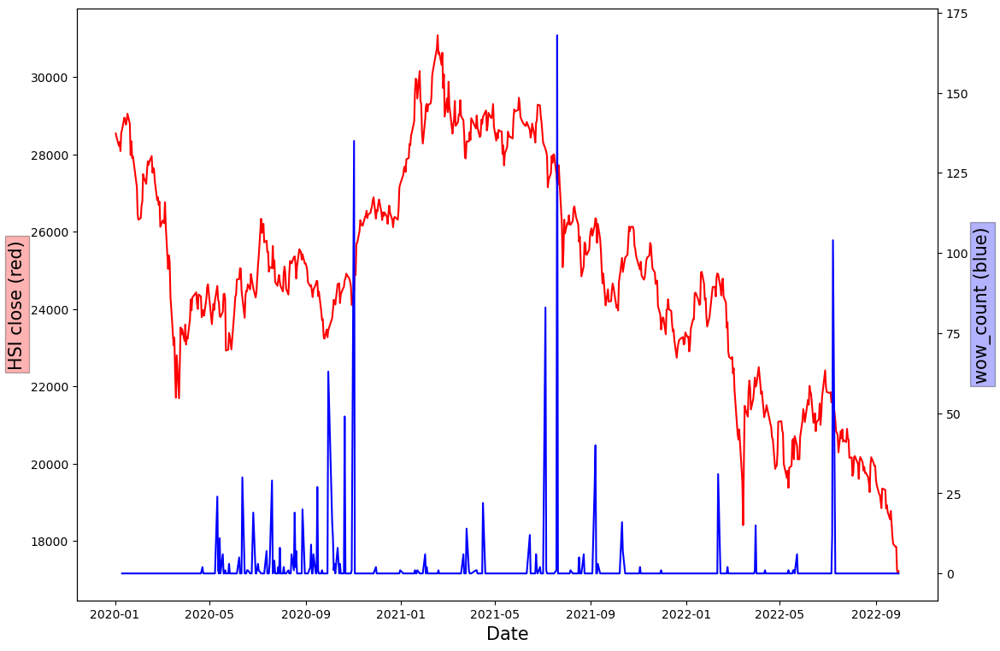

In [104]:
data_to_plot=hsi_data1["wow_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('wow_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

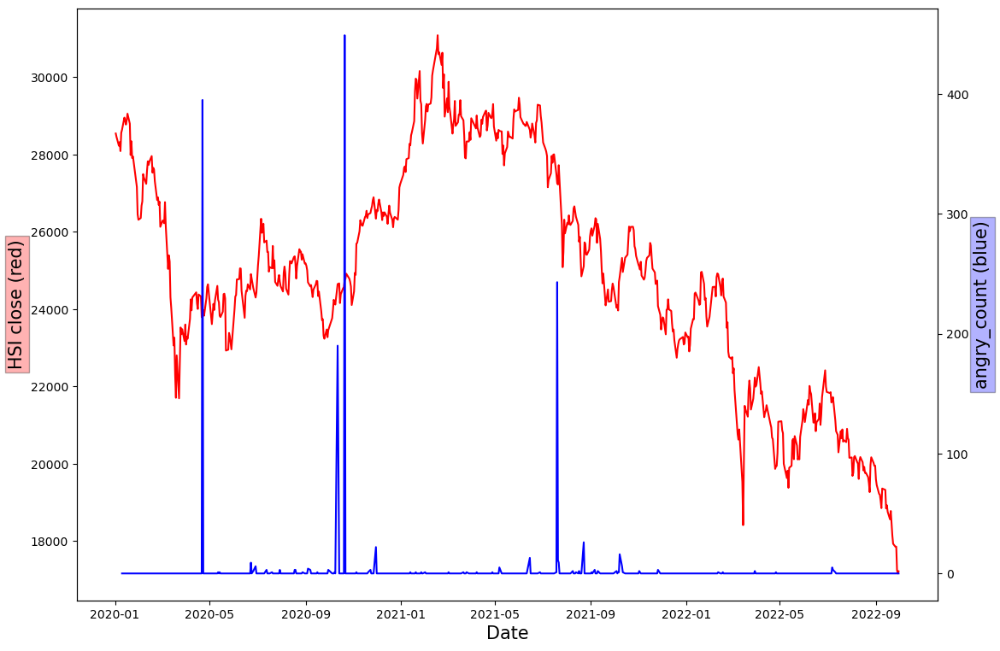

In [105]:
data_to_plot=hsi_data1["angry_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('angry_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

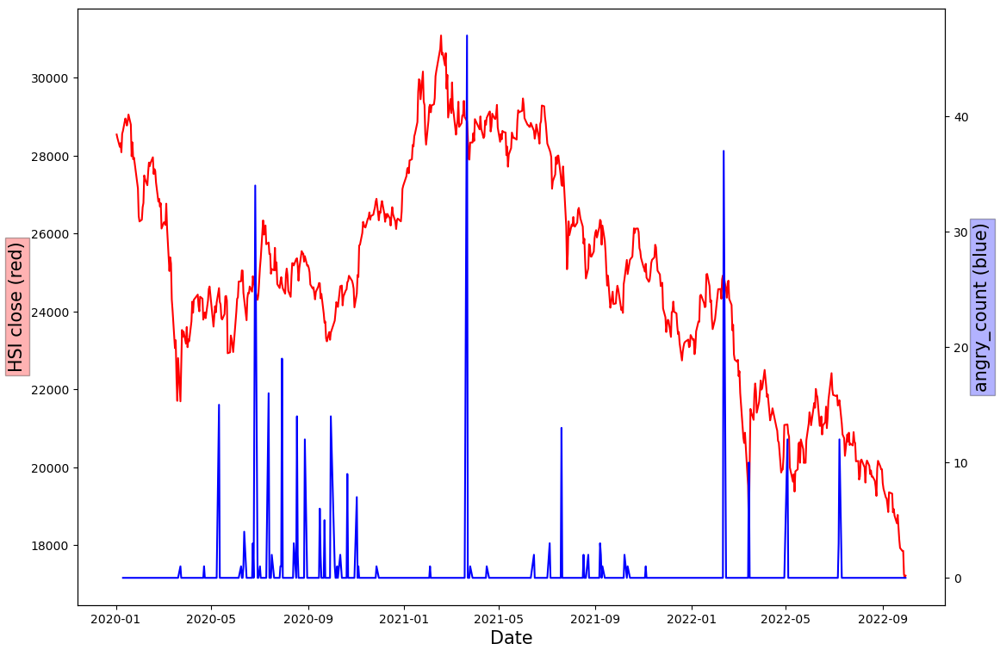

In [106]:
data_to_plot=hsi_data1["sad_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('angry_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

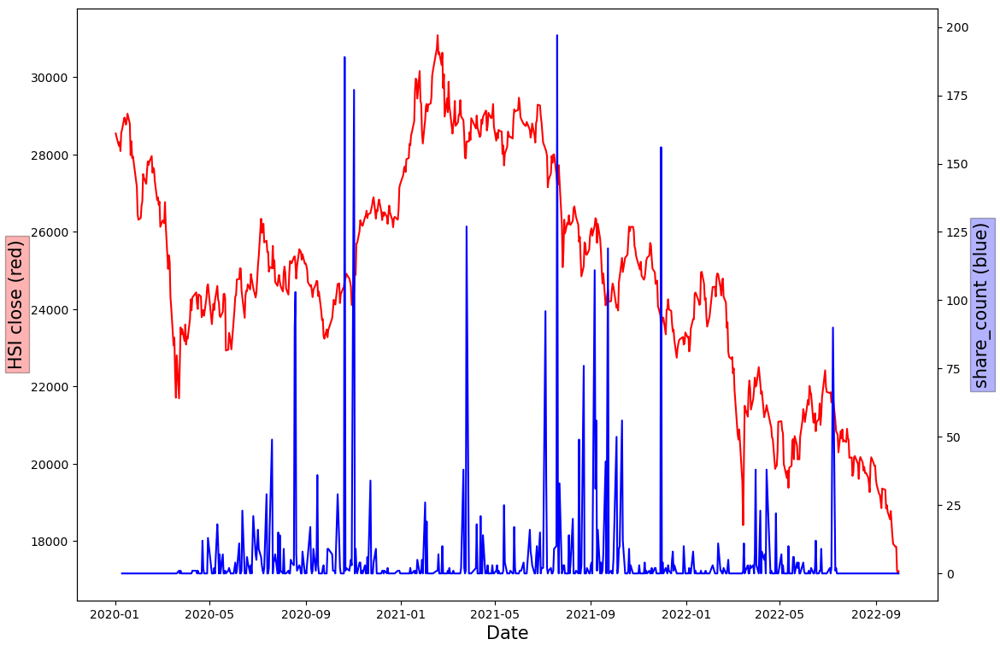

In [107]:
data_to_plot=hsi_data1["share_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('share_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

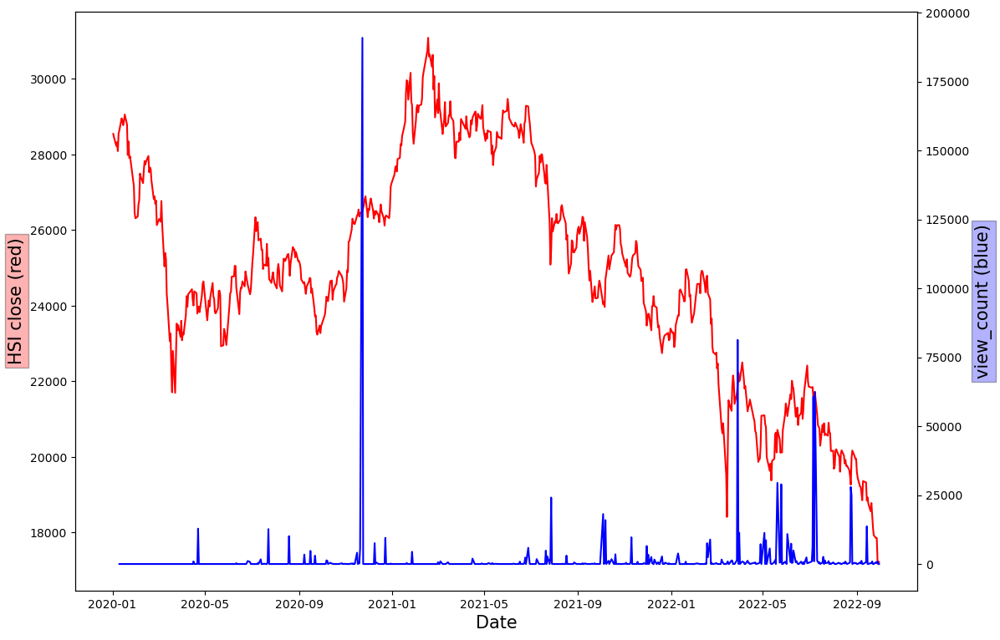

In [108]:
data_to_plot=hsi_data1["view_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('view_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

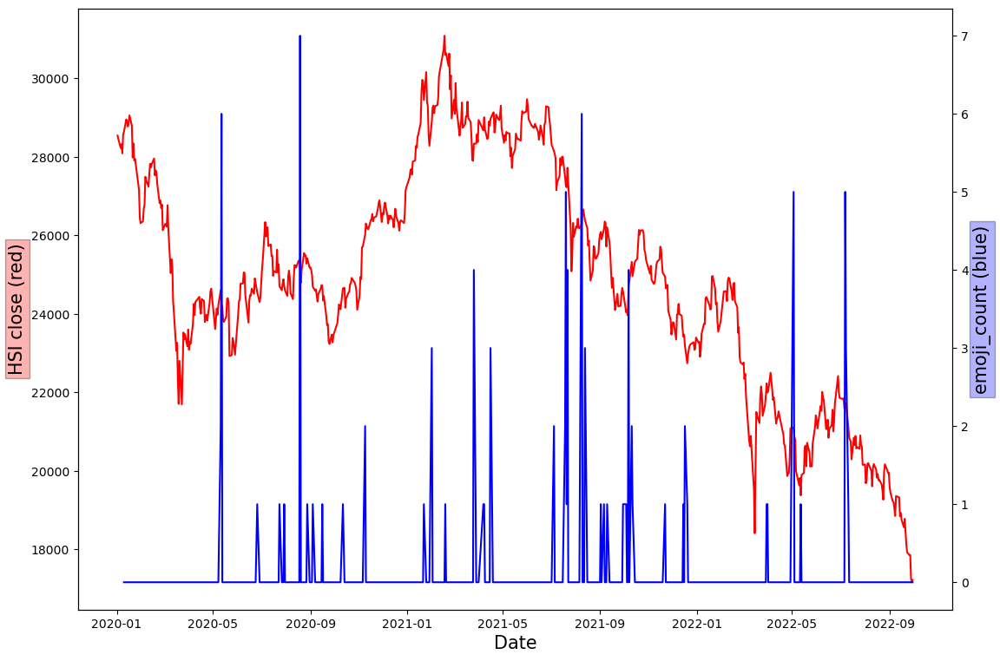

In [109]:
data_to_plot=hsi_data1["emoji_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('emoji_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

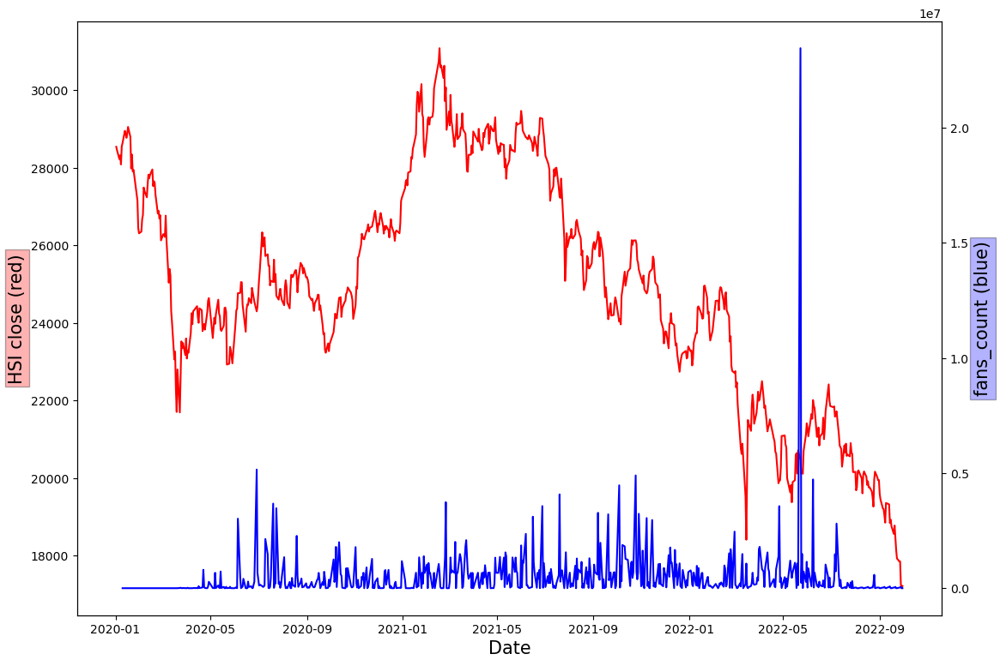

In [110]:
data_to_plot=hsi_data1["fans_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('fans_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

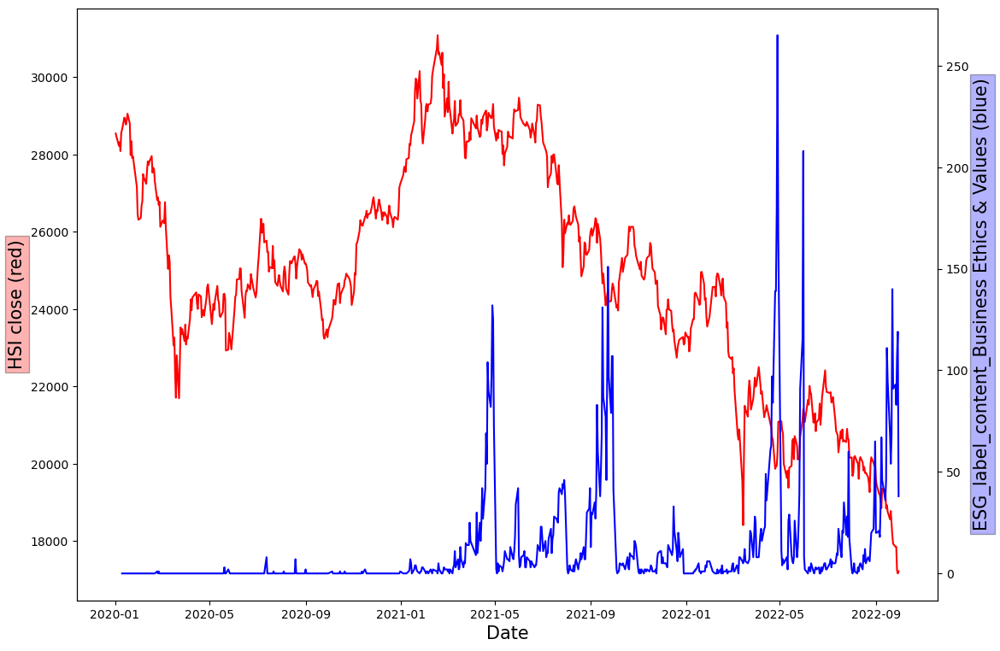

In [111]:
data_to_plot=hsi_data1["ESG_label_content_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('ESG_label_content_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

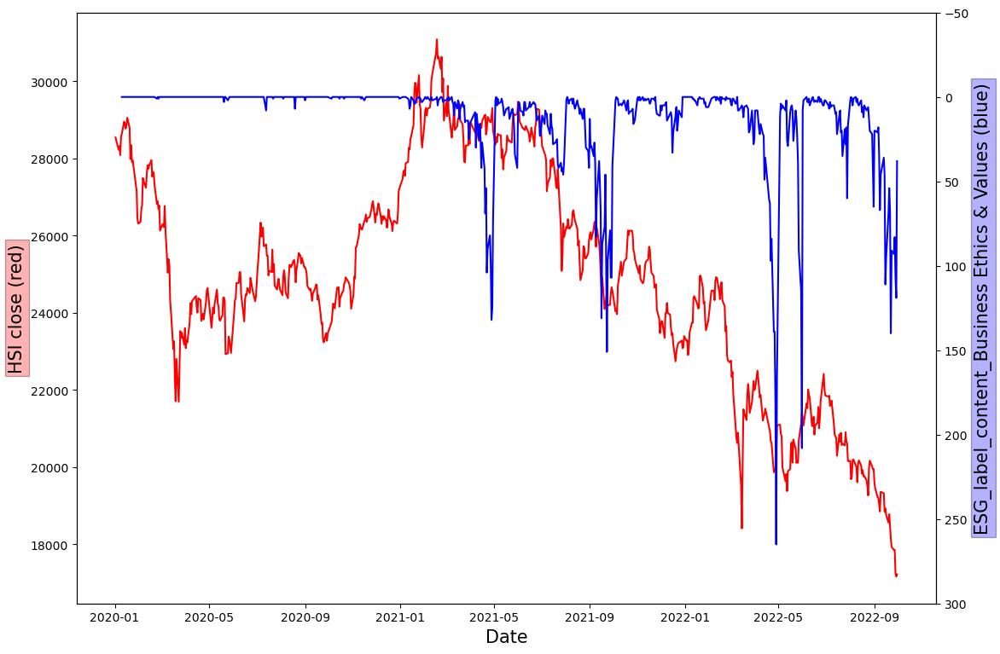

In [113]:
data_to_plot=hsi_data1["ESG_label_content_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(300,-50) 
plt.ylabel('ESG_label_content_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

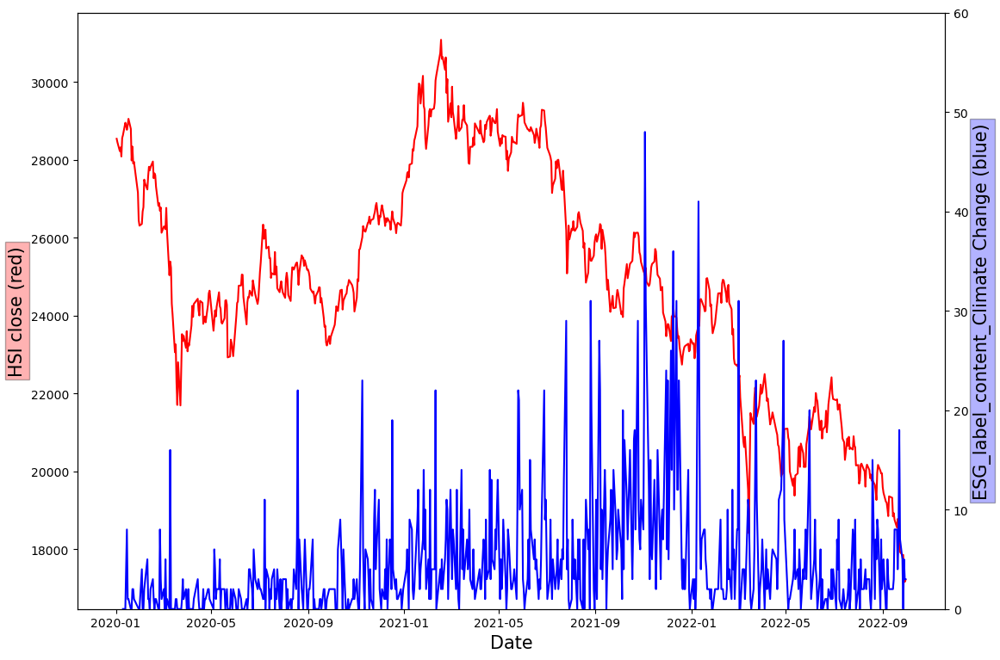

In [117]:
data_to_plot=hsi_data1["ESG_label_content_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(0,60) 
plt.ylabel('ESG_label_content_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

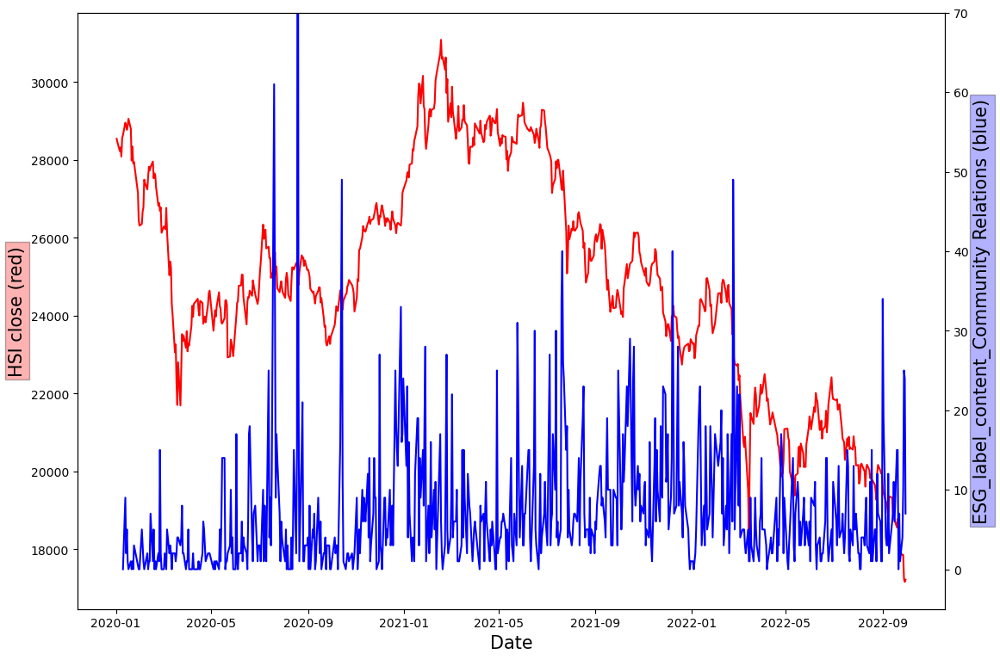

In [120]:
data_to_plot=hsi_data1["ESG_label_content_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(-5,70) 
plt.ylabel('ESG_label_content_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

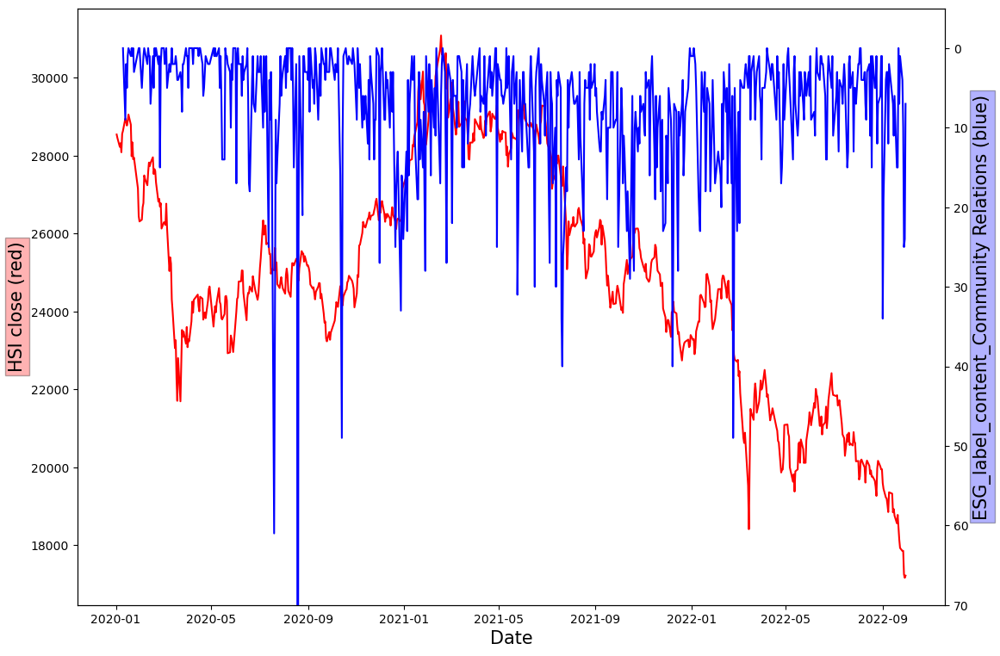

In [122]:
data_to_plot=hsi_data1["ESG_label_content_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

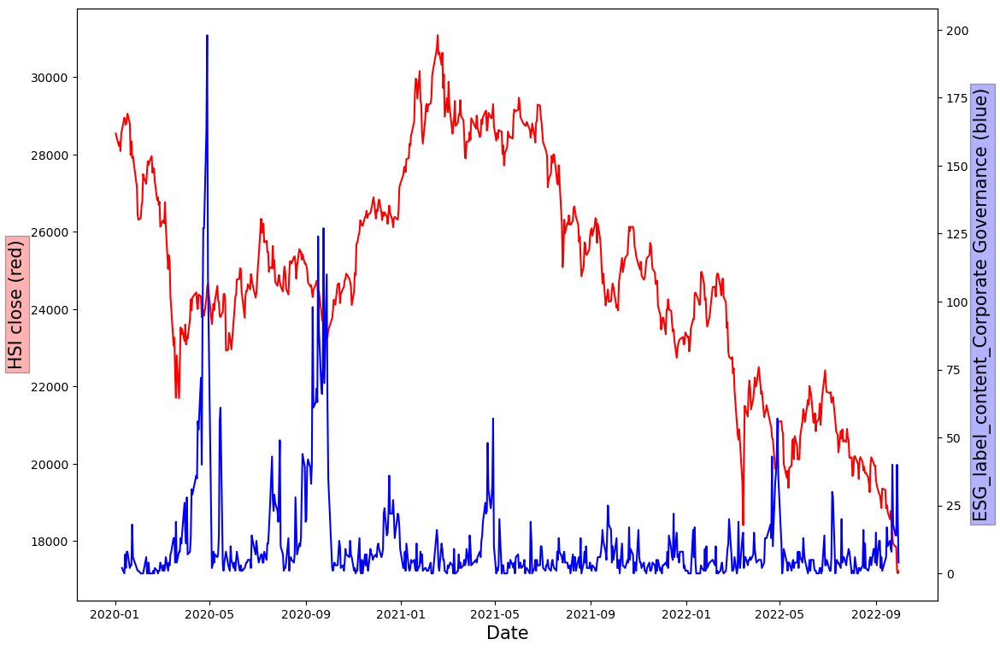

In [125]:
data_to_plot=hsi_data1["ESG_label_content_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

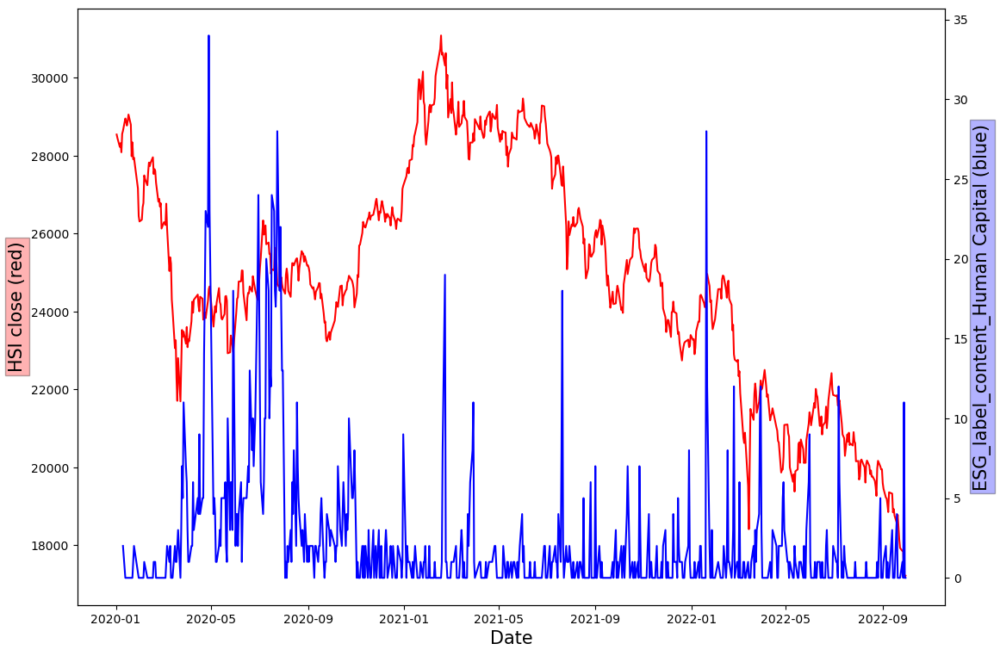

In [126]:
data_to_plot=hsi_data1["ESG_label_content_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

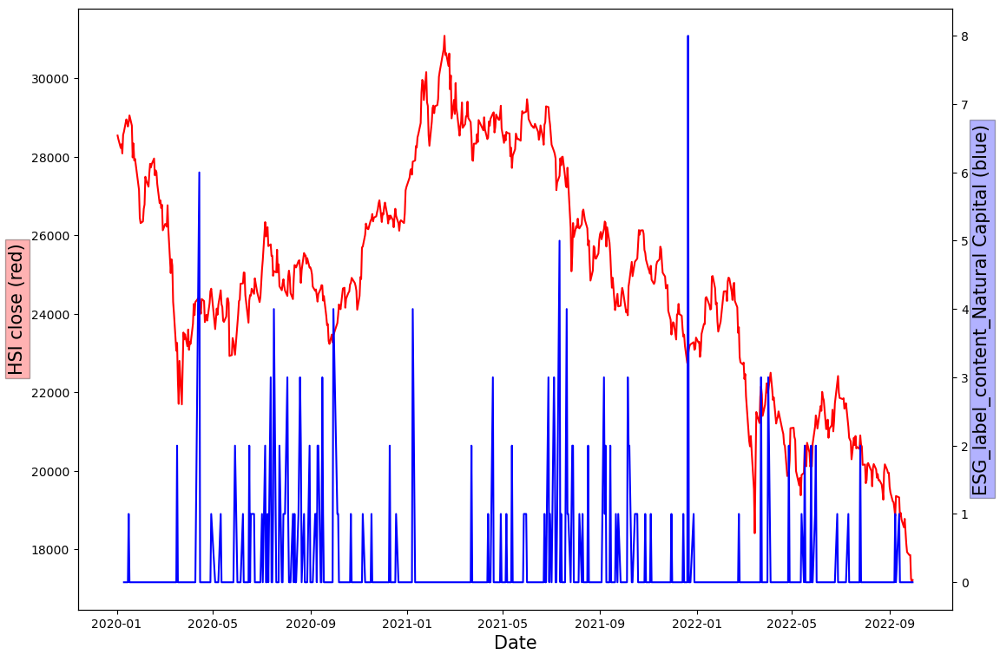

In [127]:
data_to_plot=hsi_data1["ESG_label_content_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

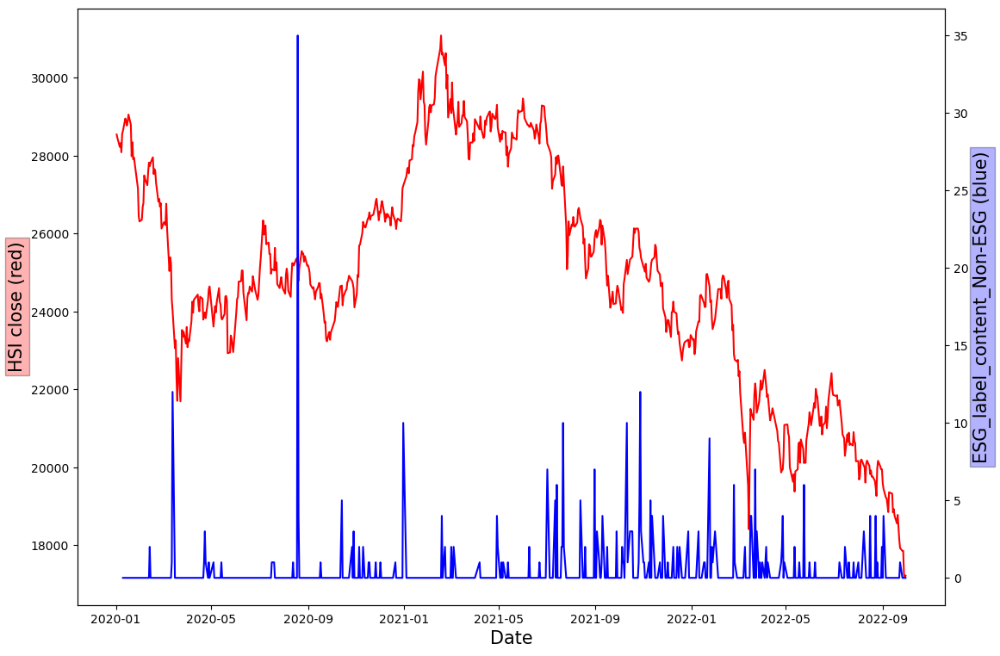

In [128]:
data_to_plot=hsi_data1["ESG_label_content_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

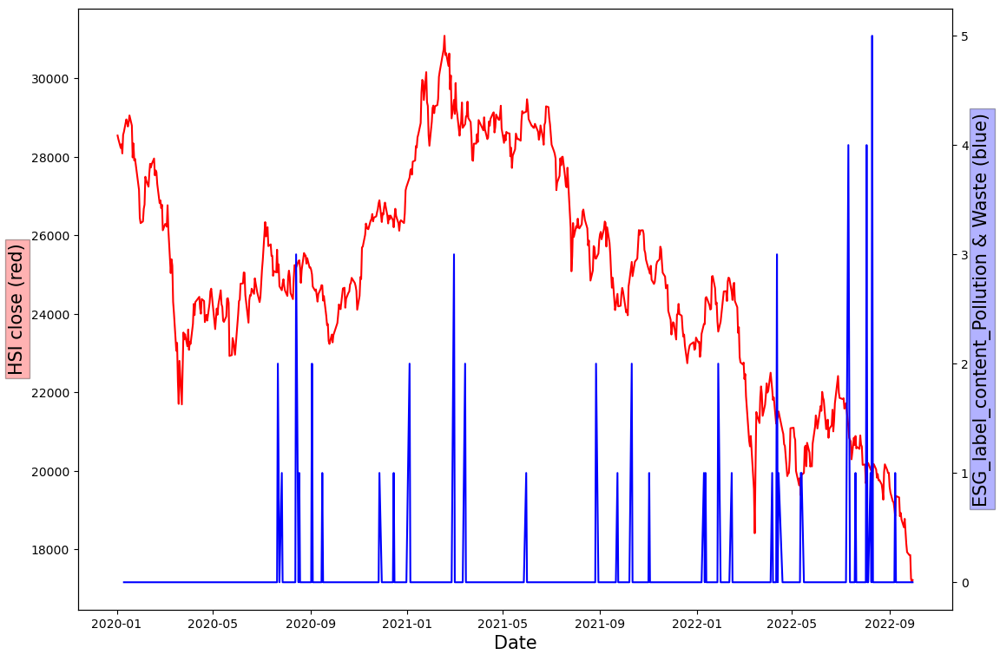

In [129]:
data_to_plot=hsi_data1["ESG_label_content_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

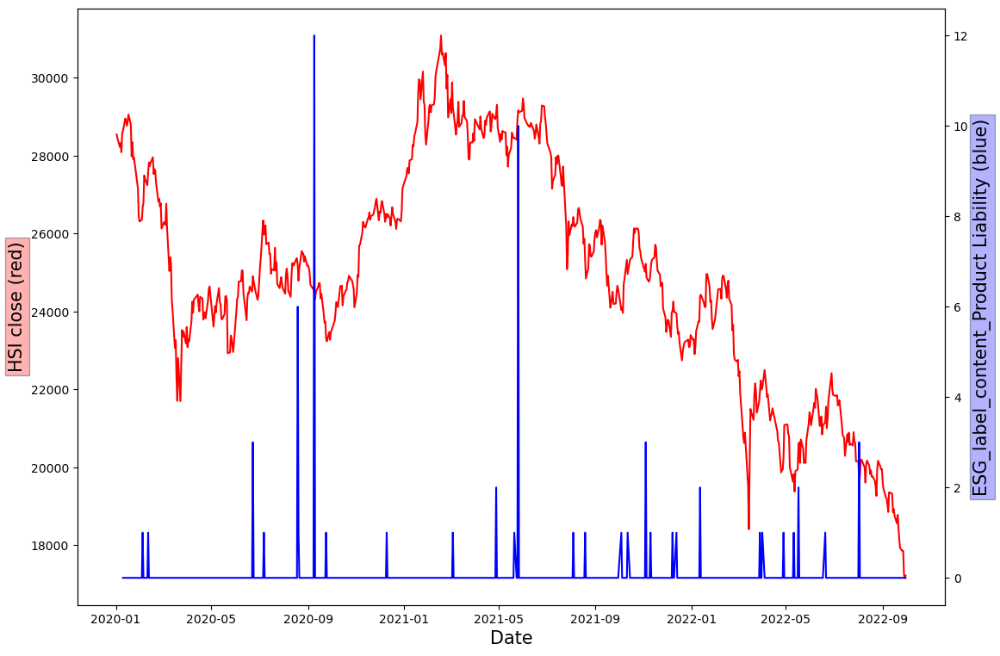

In [130]:
data_to_plot=hsi_data1["ESG_label_content_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_content_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

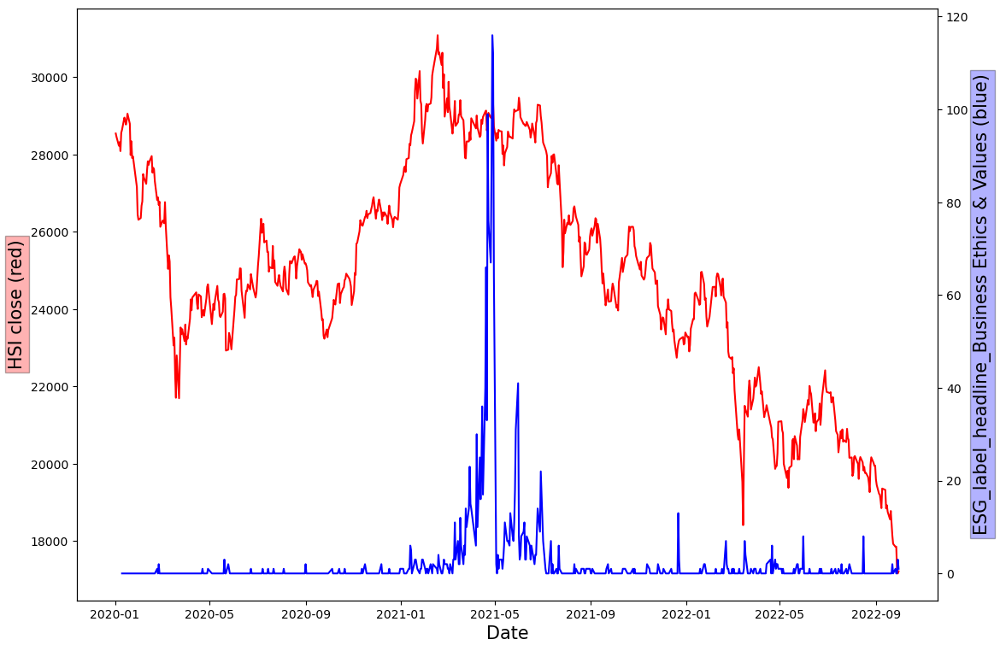

In [131]:
data_to_plot=hsi_data1["ESG_label_headline_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

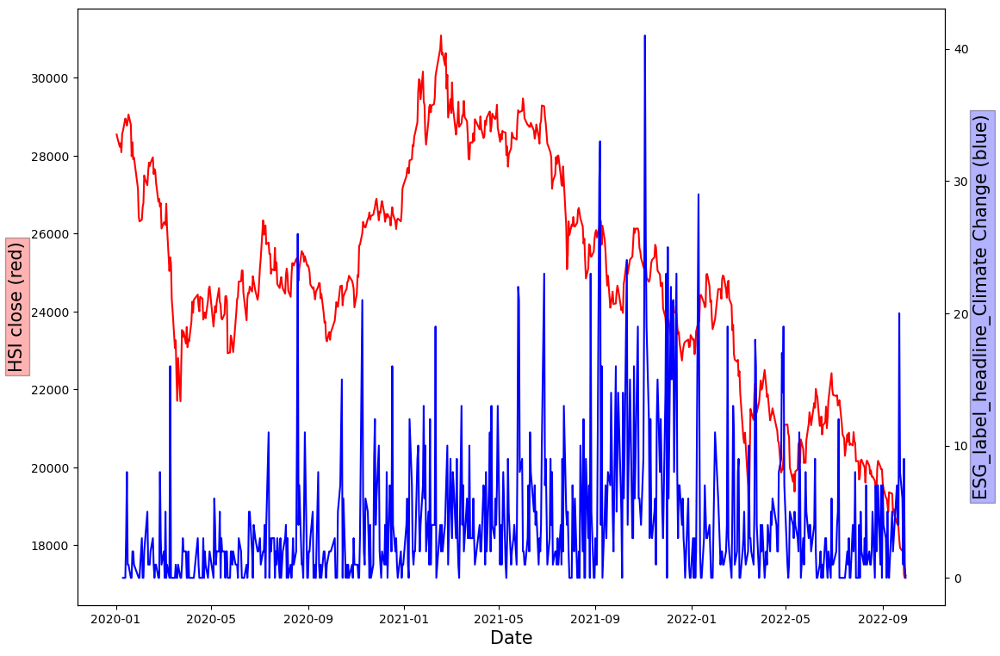

In [132]:
data_to_plot=hsi_data1["ESG_label_headline_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

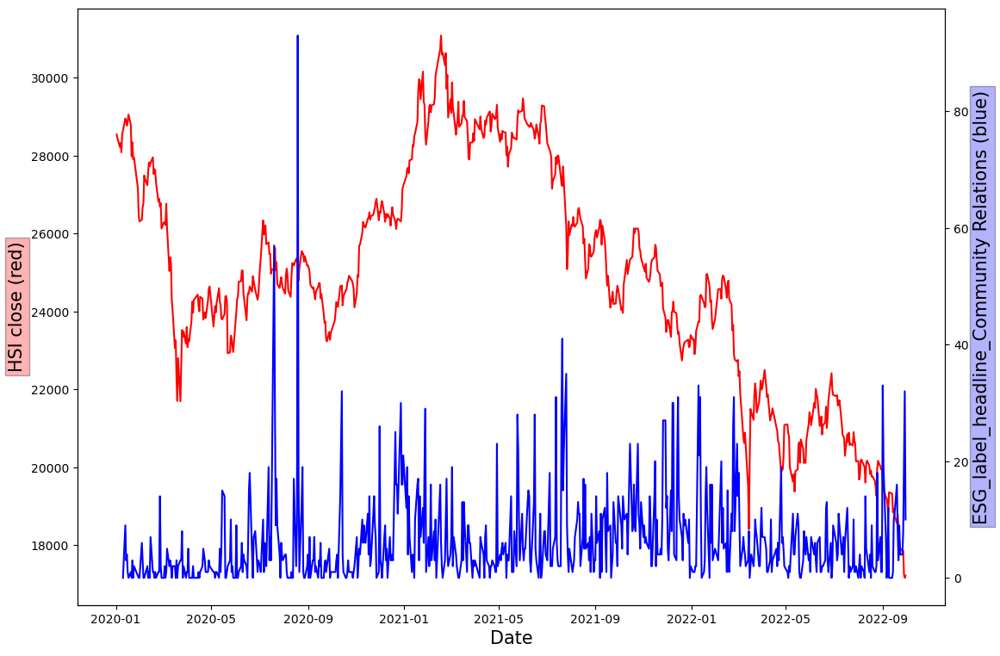

In [133]:
data_to_plot=hsi_data1["ESG_label_headline_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

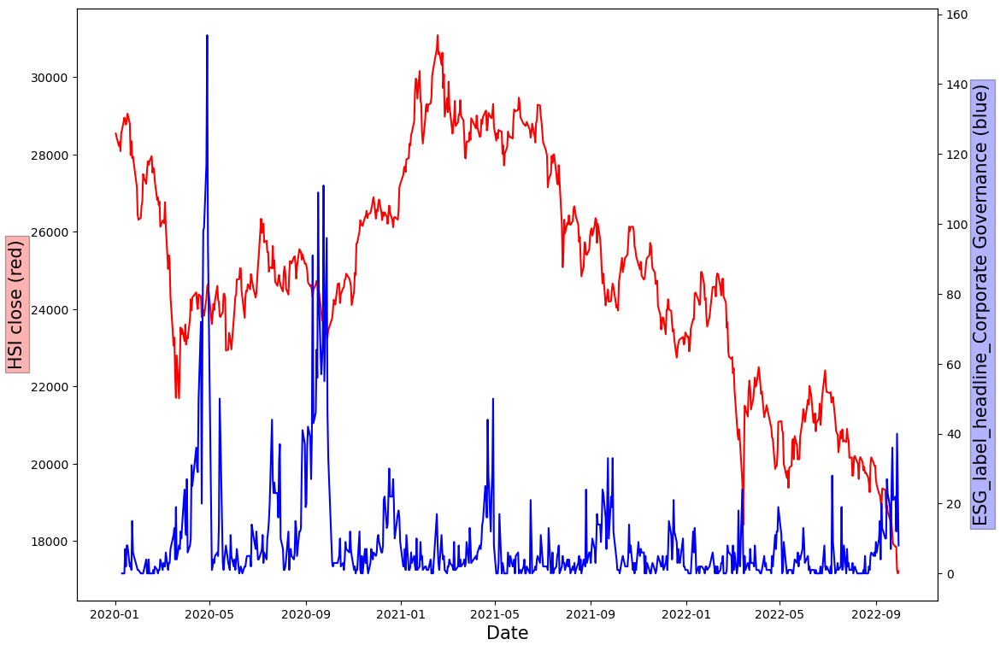

In [134]:
data_to_plot=hsi_data1["ESG_label_headline_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

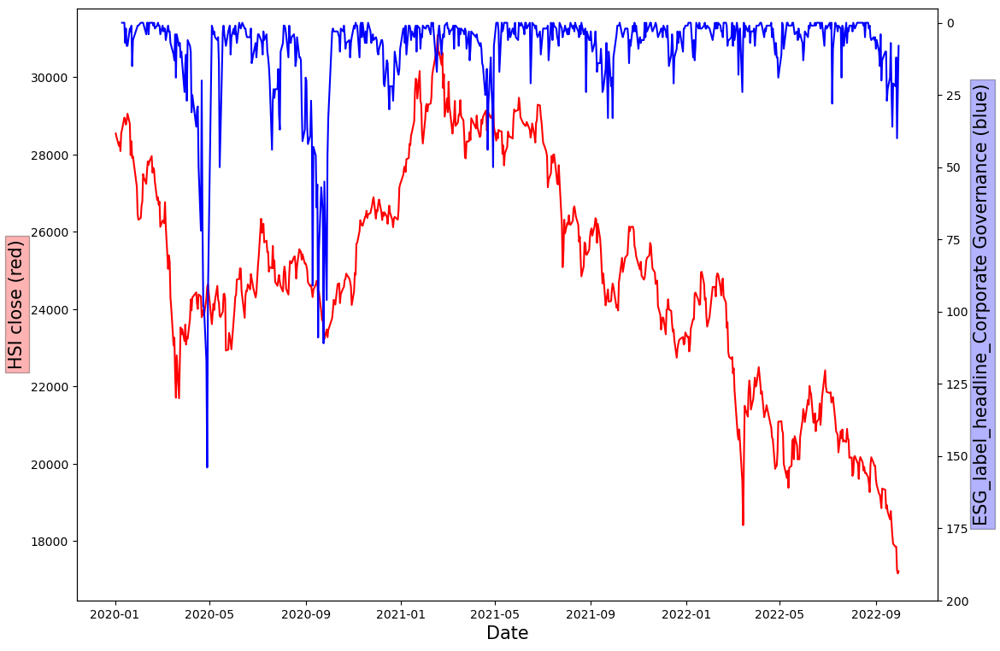

In [135]:
data_to_plot=hsi_data1["ESG_label_headline_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(200,-5) 
plt.ylabel('ESG_label_headline_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

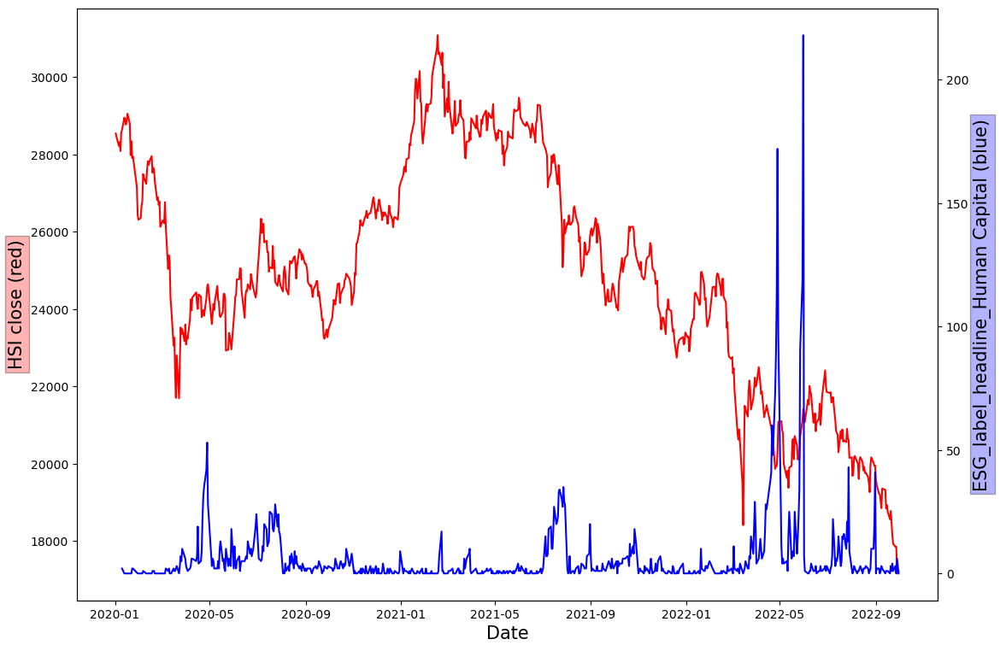

In [137]:
data_to_plot=hsi_data1["ESG_label_headline_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-5) 
plt.ylabel('ESG_label_headline_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

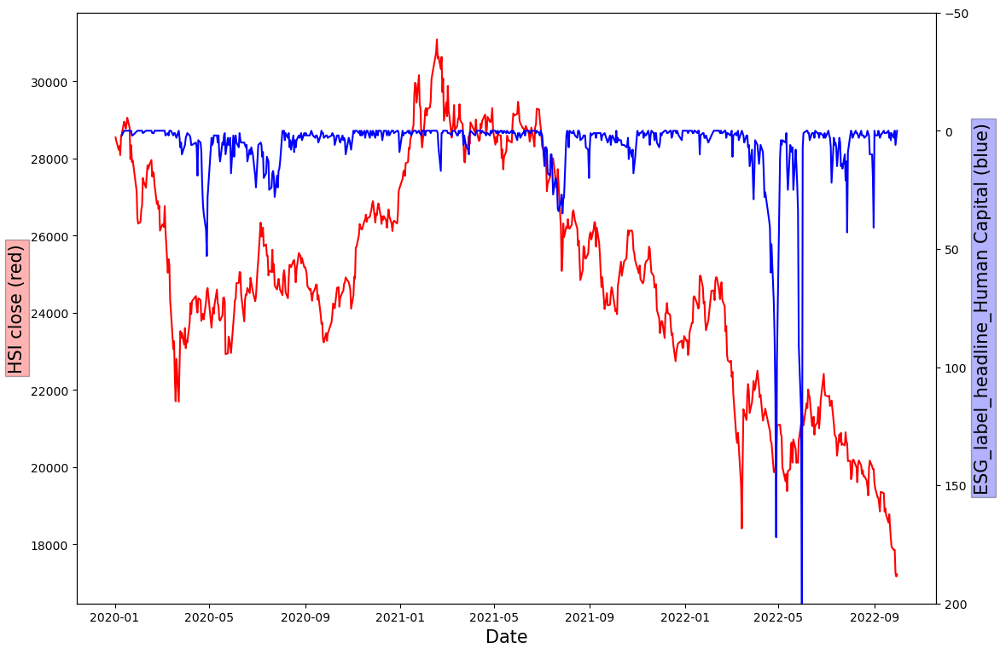

In [139]:
data_to_plot=hsi_data1["ESG_label_headline_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(200,-50) 
plt.ylabel('ESG_label_headline_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

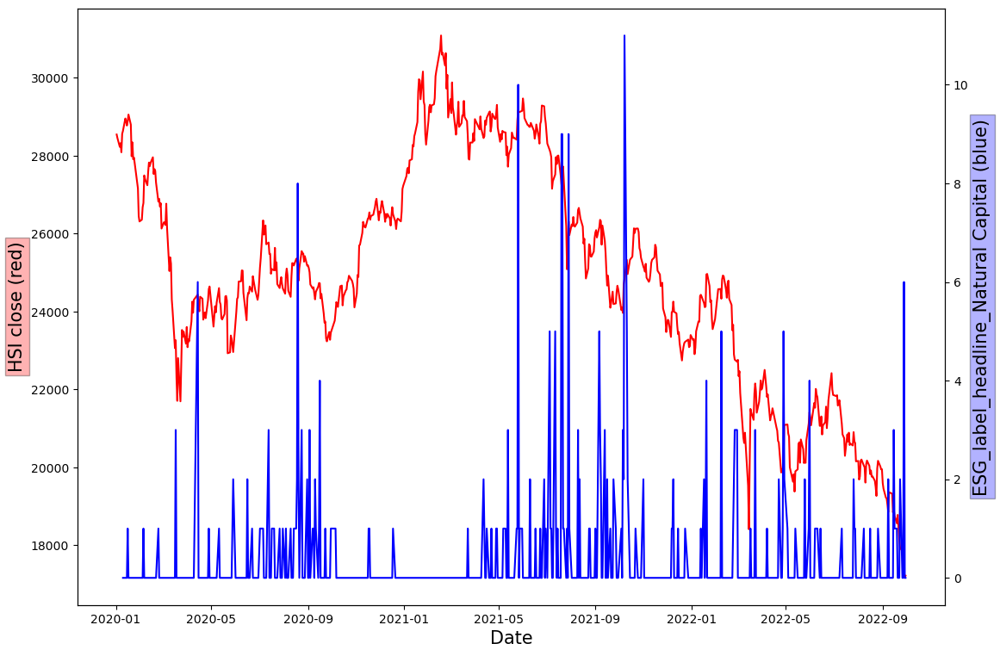

In [141]:

data_to_plot=hsi_data1["ESG_label_headline_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('ESG_label_headline_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

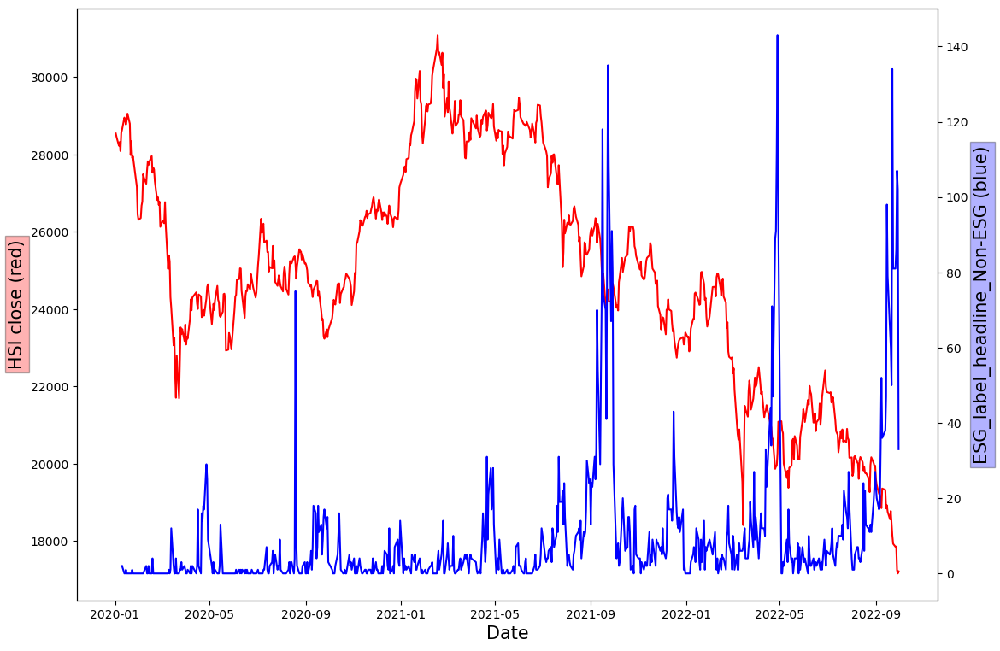

In [142]:
data_to_plot=hsi_data1["ESG_label_headline_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('ESG_label_headline_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

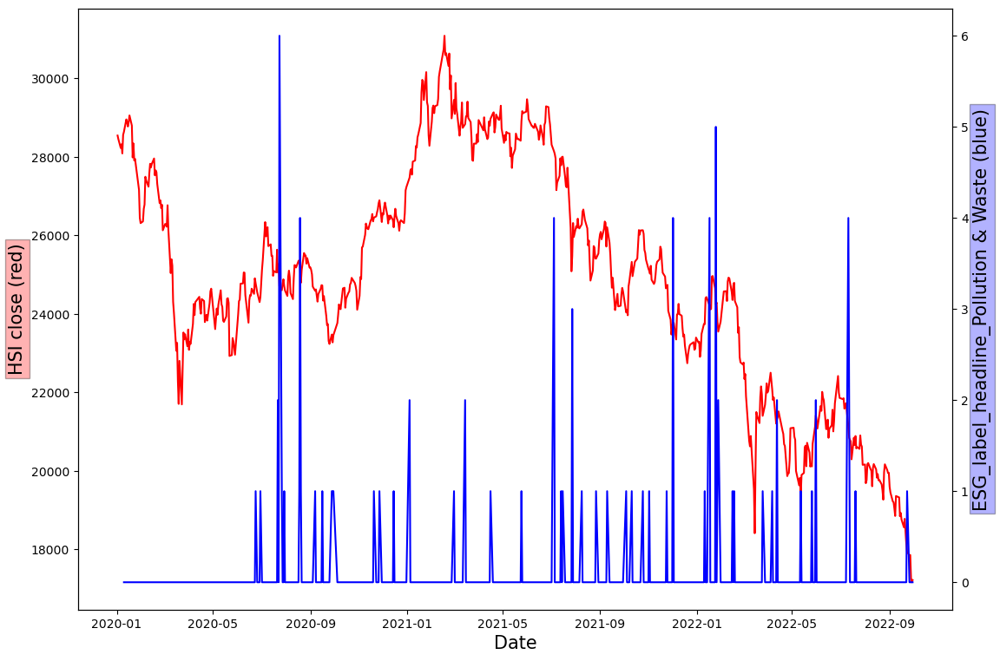

In [143]:
data_to_plot=hsi_data1["ESG_label_headline_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('ESG_label_headline_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

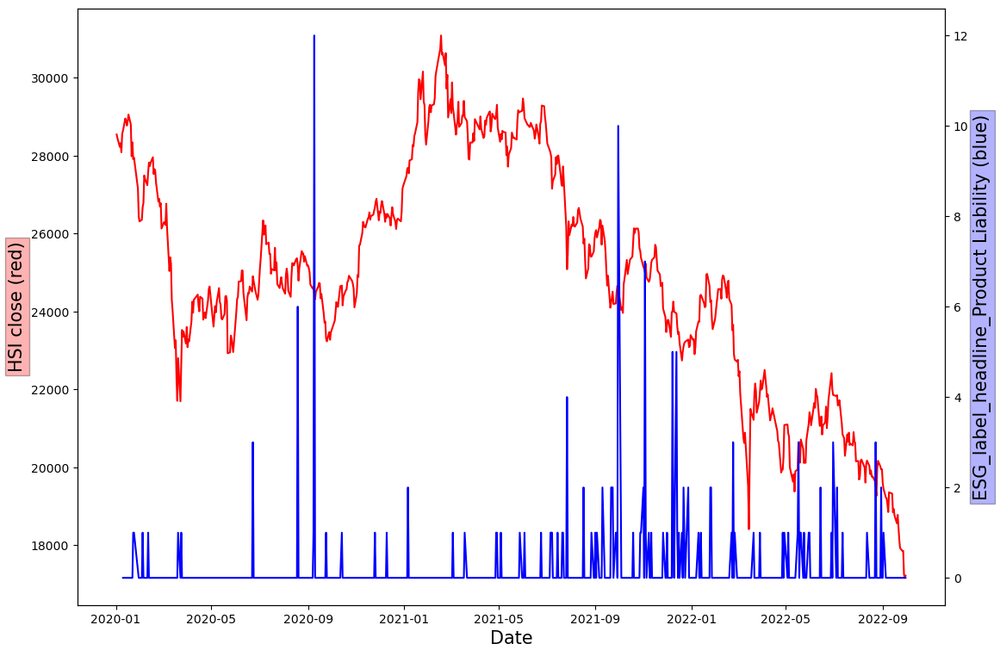

In [144]:
data_to_plot=hsi_data1["ESG_label_headline_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('ESG_label_headline_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

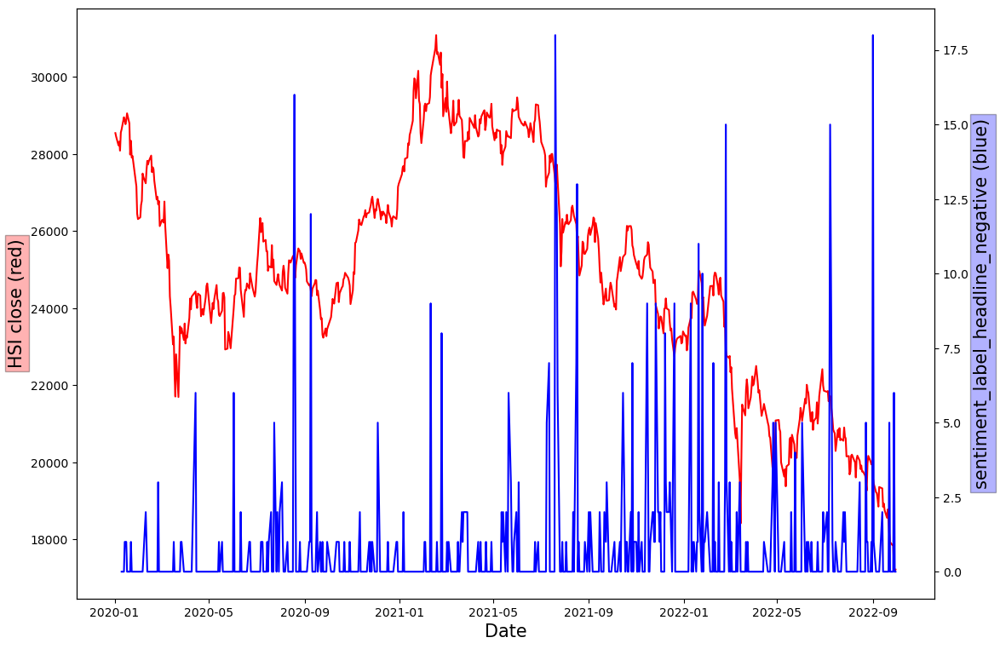

In [145]:
data_to_plot=hsi_data1["sentiment_label_headline_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('sentiment_label_headline_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

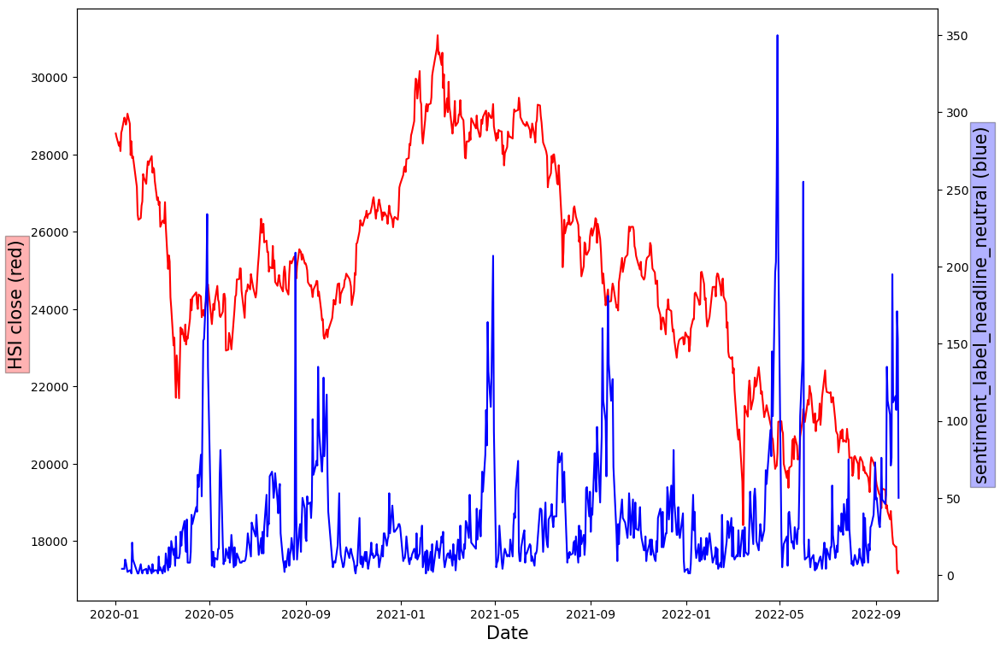

In [146]:
data_to_plot=hsi_data1["sentiment_label_headline_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('sentiment_label_headline_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

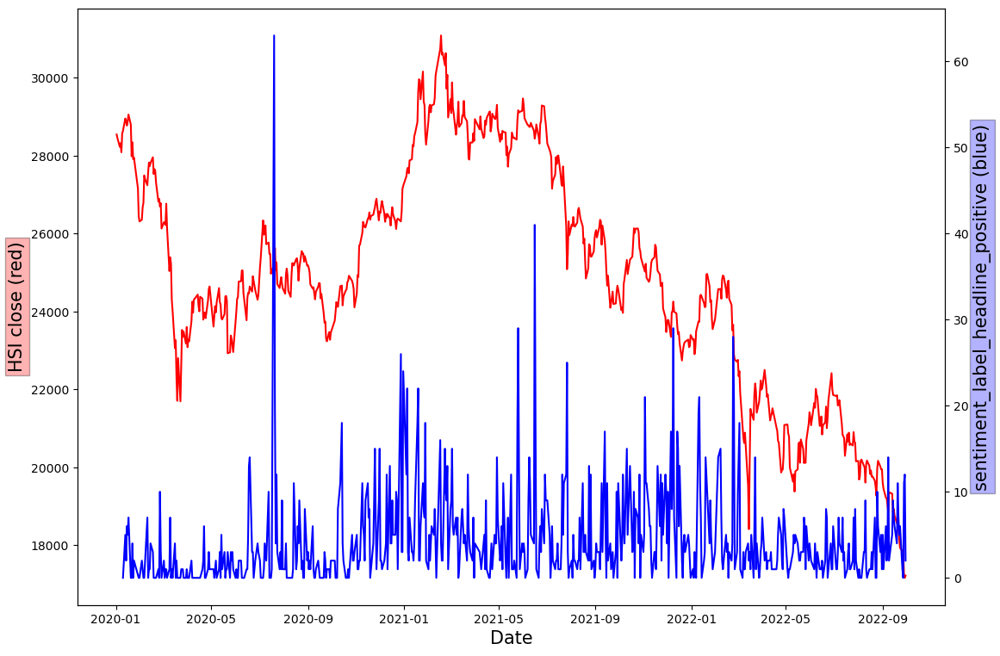

In [147]:
data_to_plot=hsi_data1["sentiment_label_headline_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('sentiment_label_headline_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

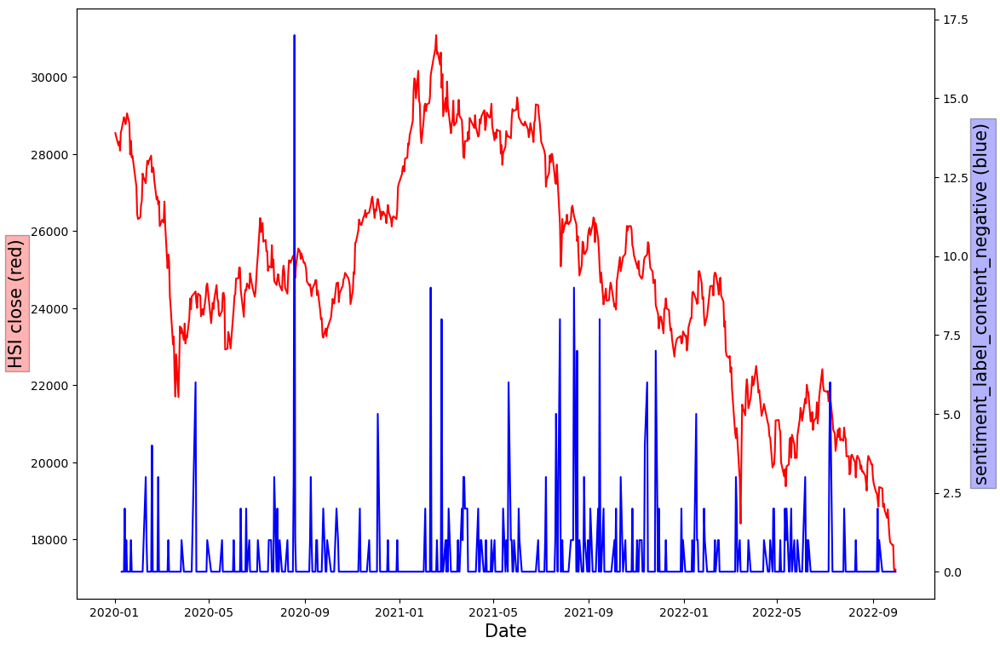

In [148]:
data_to_plot=hsi_data1["sentiment_label_content_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('sentiment_label_content_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

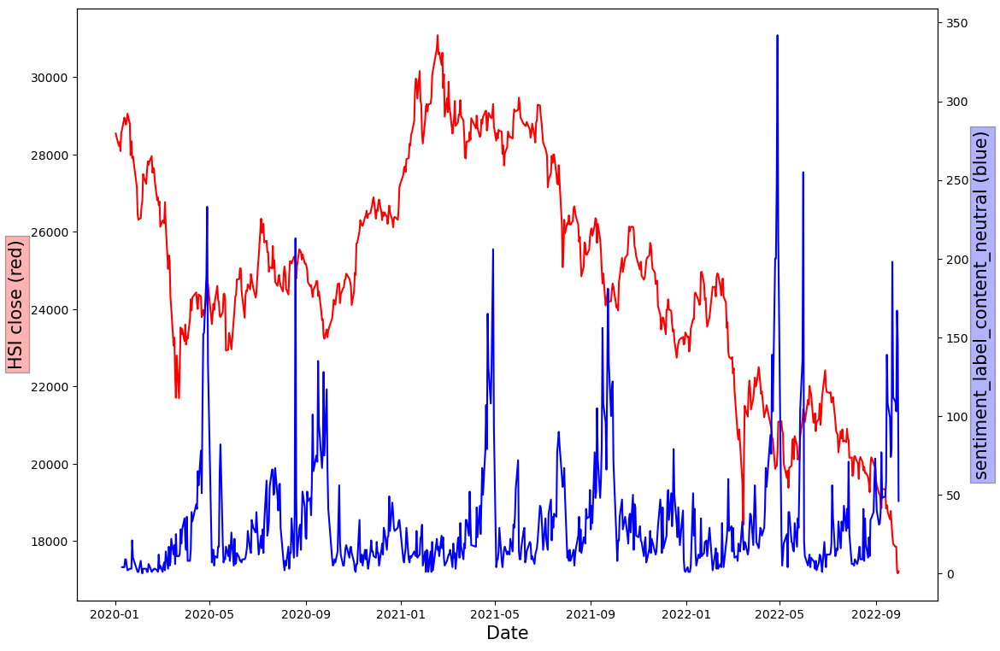

In [149]:
data_to_plot=hsi_data1["sentiment_label_content_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('sentiment_label_content_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

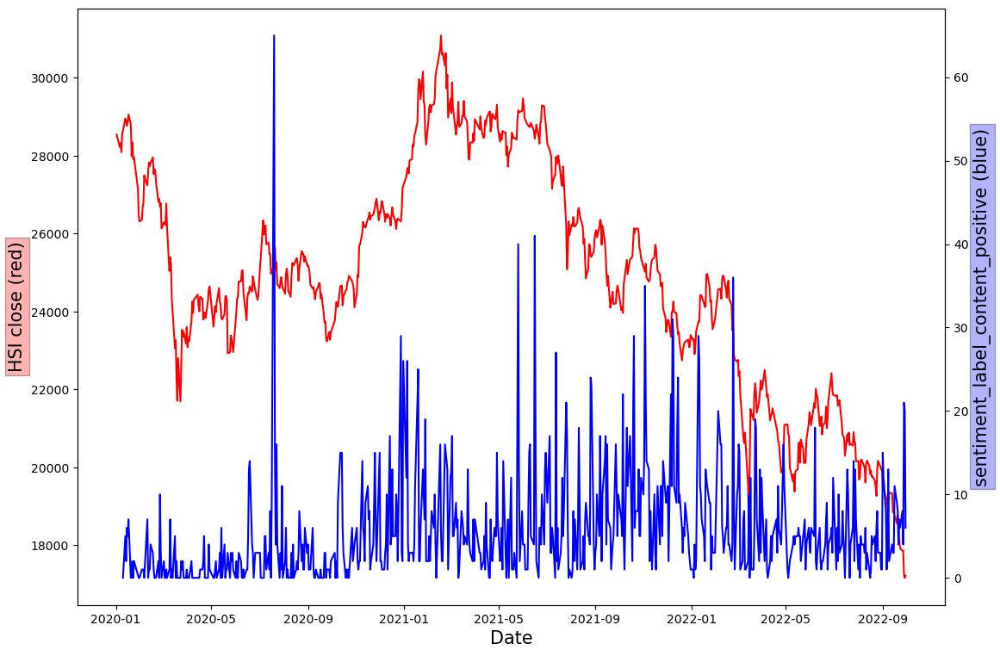

In [150]:
data_to_plot=hsi_data1["sentiment_label_content_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('sentiment_label_content_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

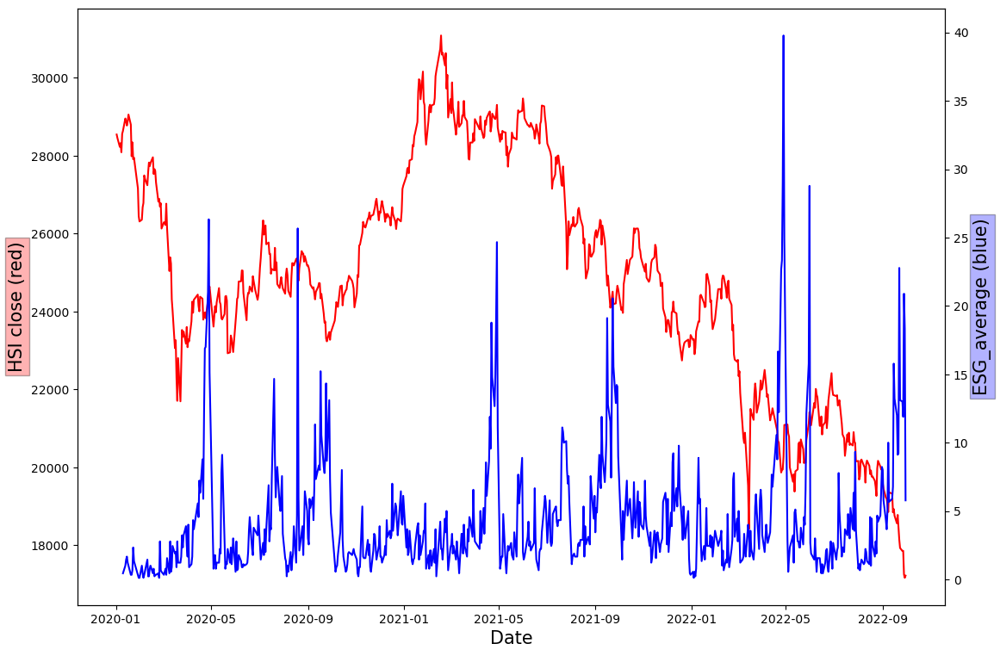

In [151]:
data_to_plot=hsi_data1["ESG_average"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(200,-50) 
plt.ylabel('ESG_average (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

In [152]:
hsi_data1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.444444,0.002703
2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0,1.000000,0.011060
2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0,1.444444,-0.002411
2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0,1.666667,-0.003862
2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0,1.222222,0.003804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0,13.000000,-0.004357
2022-09-27,14.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0,11.888889,0.000290
2022-09-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0,20.888889,-0.034122


In [153]:
data_train=hsi_data1[:400]
data_test=hsi_data1[400:]
name=[ a for a in hsi_data1.columns if a!="hsi_daily_return"]
x_train=data_train[name]
y_train=data_train["hsi_daily_return"]
X_train_shift = x_train.values
Y_train_shift = y_train.values
x_test=data_test[name]
y_test=data_test["hsi_daily_return"]
X_test_shift = x_test.values
Y_test_shift = y_test.values

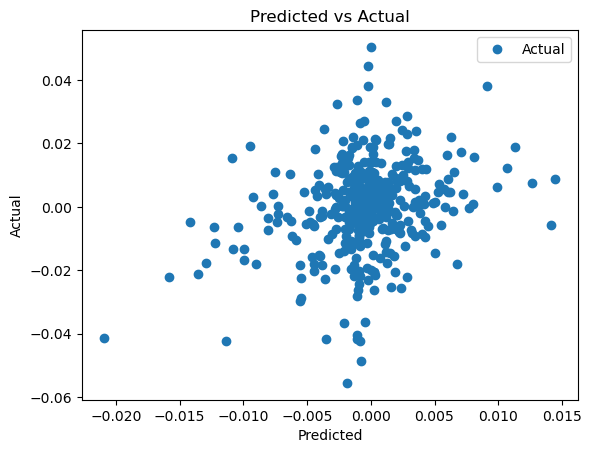

In [154]:
scaler = preprocessing.MinMaxScaler()
X_train_trans = scaler.fit_transform(X_train_shift)
# X_test_trans=scaler.fit_transform(X_test_shift)

from sklearn.linear_model import LinearRegression
clf = LinearRegression().fit(X_train_trans,Y_train_shift)
Y_train_pred = clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({'Actual': Y_train_shift, 'Predicted': Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [155]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.010098260637772662
Mean Squared Error: 0.0001851192457401108
Root Mean Squared Error: 0.01360585336317097
R-square: 0.06951841951989068


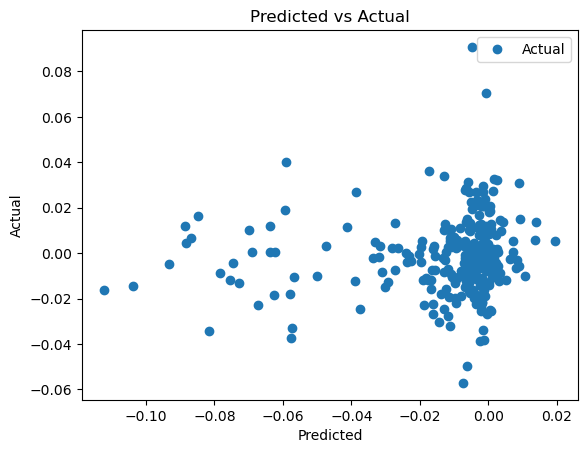

In [156]:
X_test_trans = scaler.transform(X_test_shift)
Y_test_pred = clf.predict(X_test_trans)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [157]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.01925750350321989
Mean Squared Error: 0.0008283243710424618
Root Mean Squared Error: 0.028780624924460235
R-square: -1.9568238509616611


In [158]:
overall_keyword_hsi=pd.concat([train_act_pred,test_act_pred],ignore_index=True);overall_keyword_hsi

,Actual,Predicted
0,0.002703,-0.001205
1,0.011060,0.000080
2,-0.002411,-0.003109
3,-0.003862,0.000633
4,0.003804,0.000099
...,...,...
666,-0.004357,-0.074673
667,0.000290,-0.069103
668,-0.034122,-0.081627
669,-0.004928,-0.093117


In [159]:
overall_keyword_hsi["Actual_accu_return"]=overall_keyword_hsi["Actual"]+1
overall_keyword_hsi["Predicted_accu_return"]=overall_keyword_hsi["Predicted"]+1

overall_keyword_hsi["Actual_accu_return"]=overall_keyword_hsi['Actual_accu_return'].cumprod()
overall_keyword_hsi["Predicted_accu_return"]=overall_keyword_hsi['Predicted_accu_return'].cumprod();overall_keyword_hsi

,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,0.002703,-0.001205,1.002703,0.998795
1,0.011060,0.000080,1.013793,0.998875
2,-0.002411,-0.003109,1.011349,0.995769
3,-0.003862,0.000633,1.007443,0.996400
4,0.003804,0.000099,1.011275,0.996498
...,...,...,...,...
666,-0.004357,-0.074673,0.645418,0.030717
667,0.000290,-0.069103,0.645605,0.028594
668,-0.034122,-0.081627,0.623576,0.026260
669,-0.004928,-0.093117,0.620503,0.023815


<AxesSubplot:>

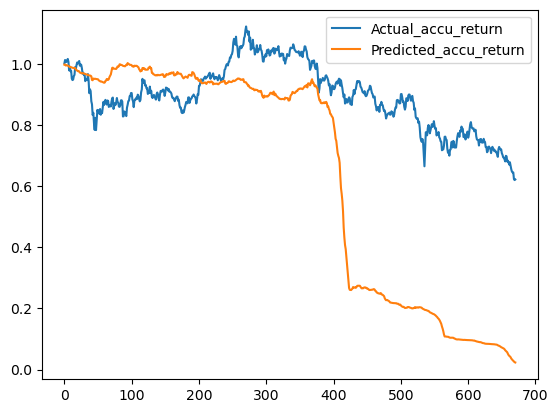

In [163]:
overall_keyword_hsi.iloc[:,2:].plot()

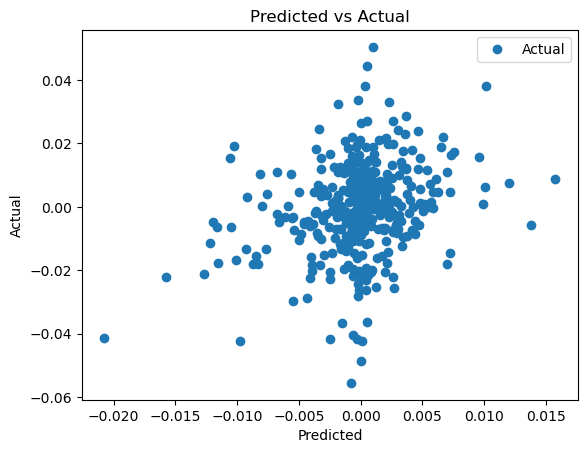

In [176]:
from sklearn.linear_model import Lasso
clf=Lasso(alpha=0.000000012, fit_intercept=False)
clf.fit(X_train_trans, Y_train_shift)
Y_train_pred=clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({"Actual": Y_train_shift, "Predicted": Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [177]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.010030204238568681
Mean Squared Error: 0.00018369317945846154
Root Mean Squared Error: 0.013553345692428182
R-square: 0.07668638524011229


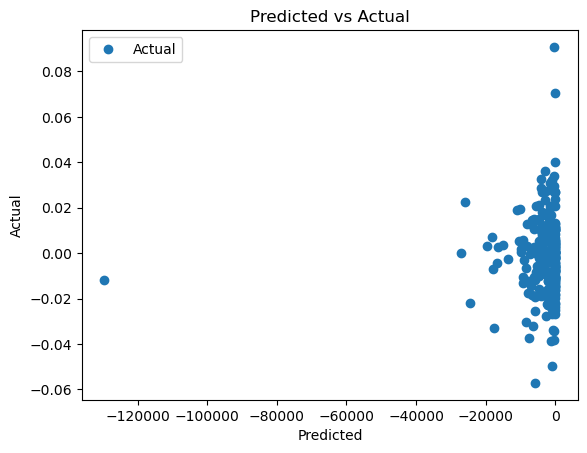

In [179]:
Y_test_pred = clf.predict(X_test_shift)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [180]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))


Mean Absolute Error: 3305.1490292550448
Mean Squared Error: 88874169.25644606
Root Mean Squared Error: 9427.309757107065
R-square: -317249223345.0946


In [181]:
overall_keyword_hsi_lasso=pd.concat([train_act_pred,test_act_pred],ignore_index=True)
overall_keyword_hsi_lasso["Actual_accu_return"]=overall_keyword_hsi_lasso["Actual"]+1
overall_keyword_hsi_lasso["Predicted_accu_return"]=overall_keyword_hsi_lasso["Predicted"]+1


In [182]:
overall_keyword_hsi_lasso["Actual_accu_return"]=overall_keyword_hsi_lasso['Actual_accu_return'].cumprod()
overall_keyword_hsi_lasso["Predicted_accu_return"]=overall_keyword_hsi_lasso['Predicted_accu_return'].cumprod();overall_keyword_hsi_lasso


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,0.002703,-0.000206,1.002703,0.999794
1,0.011060,0.001199,1.013793,1.000992
2,-0.002411,-0.002819,1.011349,0.998171
3,-0.003862,0.000911,1.007443,0.999080
4,0.003804,0.000585,1.011275,0.999664
...,...,...,...,...
666,-0.004357,-159.739375,0.645418,inf
667,0.000290,-193.819199,0.645605,-inf
668,-0.034122,-313.920502,0.623576,inf
669,-0.004928,-10.027987,0.620503,-inf


<AxesSubplot:>

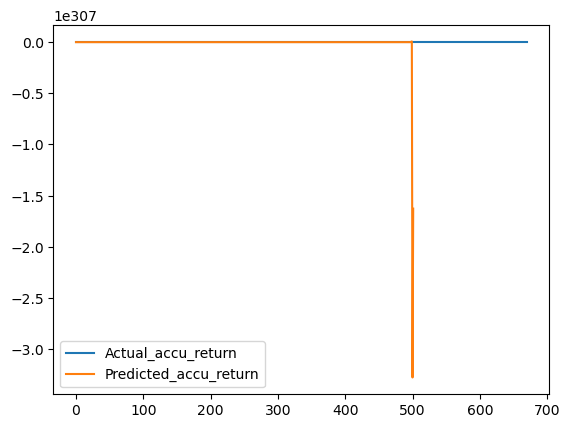

In [183]:
overall_keyword_hsi_lasso.iloc[:,2:].plot()

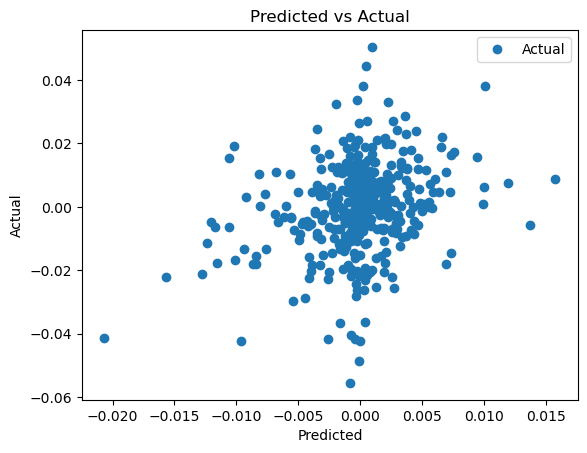

In [184]:
from sklearn.linear_model import Ridge
clf=Ridge(alpha=0.00001, fit_intercept=False)
clf.fit(X_train_trans, Y_train_shift)
Y_train_pred=clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({"Actual": Y_train_shift, "Predicted": Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [185]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.010034233838601614
Mean Squared Error: 0.00018368790525267103
Root Mean Squared Error: 0.013553151118934336
R-square: 0.0767128954569194


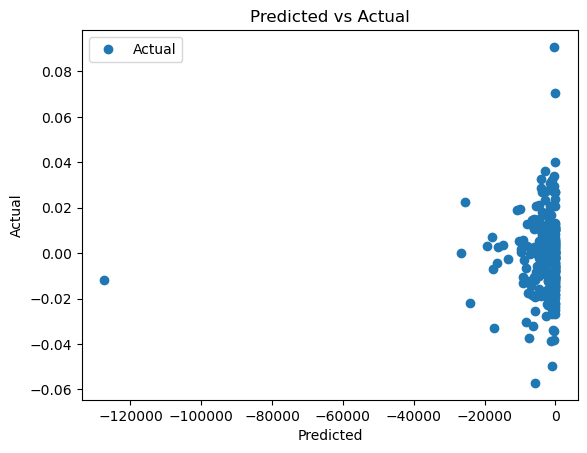

In [186]:
Y_test_pred = clf.predict(X_test_shift)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [187]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 3251.455318677622
Mean Squared Error: 85945068.64756404
Root Mean Squared Error: 9270.656322373516
R-square: -306793374350.4443


In [188]:
overall_keyword_hsi_ridge=pd.concat([train_act_pred,test_act_pred],ignore_index=True)
overall_keyword_hsi_ridge["Actual_accu_return"]=overall_keyword_hsi_ridge["Actual"]+1
overall_keyword_hsi_ridge["Predicted_accu_return"]=overall_keyword_hsi_ridge["Predicted"]+1

overall_keyword_hsi_ridge["Actual_accu_return"]=overall_keyword_hsi_ridge['Actual_accu_return'].cumprod()
overall_keyword_hsi_ridge["Predicted_accu_return"]=overall_keyword_hsi_ridge['Predicted_accu_return'].cumprod();overall_keyword_hsi_ridge

,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,0.002703,-0.000326,1.002703,0.999674
1,0.011060,0.001094,1.013793,1.000767
2,-0.002411,-0.002906,1.011349,0.997859
3,-0.003862,0.000866,1.007443,0.998723
4,0.003804,0.000484,1.011275,0.999207
...,...,...,...,...
666,-0.004357,-157.230850,0.645418,inf
667,0.000290,-191.061947,0.645605,-inf
668,-0.034122,-309.022696,0.623576,inf
669,-0.004928,-10.353663,0.620503,-inf


<AxesSubplot:>

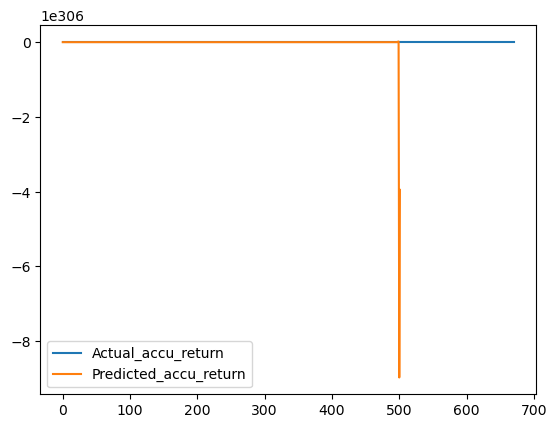

In [189]:
overall_keyword_hsi_ridge.iloc[:,2:].plot()

In [190]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
poly = PolynomialFeatures(degree=2, include_bias=False)
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
X,y=hsi_data1[name],hsi_data1["hsi_daily_return"]
poly = PolynomialFeatures(degree=2, include_bias=False)
poly_features = poly.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=42)


In [191]:
poly_reg_model = LinearRegression()
poly_reg_model.fit(X_train, y_train)
poly_reg_y_predicted = poly_reg_model.predict(X_test)
poly_reg_train_predicted = poly_reg_model.predict(X_train)
from sklearn.metrics import mean_squared_error
poly_reg_rmse_test = np.sqrt(mean_squared_error(y_test, poly_reg_y_predicted))
poly_reg_rmse_test 

36.8480717097714

In [192]:
poly_reg_rmse_train = np.sqrt(mean_squared_error(y_train, poly_reg_train_predicted));poly_reg_rmse_train 

0.005681040805055447

In [193]:
test_act_pred=pd.DataFrame({'Actual': y_test, 'Predicted': poly_reg_y_predicted})
train_act_pred=pd.DataFrame({"Actual": y_train, "Predicted": poly_reg_train_predicted})
overall_hsi_poly2=pd.concat([train_act_pred,test_act_pred])
overall_hsi_poly2=overall_hsi_poly2.sort_index();overall_hsi_poly2

,Actual,Predicted
Date,,
2020-01-10,0.002703,0.009091
2020-01-13,0.011060,0.003013
2020-01-14,-0.002411,-0.471889
2020-01-15,-0.003862,-0.004019
2020-01-16,0.003804,0.001603
...,...,...
2022-09-26,-0.004357,-0.510863
2022-09-27,0.000290,-1.707665
2022-09-28,-0.034122,-0.035926


In [194]:
overall_hsi_poly2["Actual_accu_return"]=overall_hsi_poly2["Actual"]+1
overall_hsi_poly2["Predicted_accu_return"]=overall_hsi_poly2["Predicted"]+1

overall_hsi_poly2["Actual_accu_return"]=overall_hsi_poly2['Actual_accu_return'].cumprod()
overall_hsi_poly2["Predicted_accu_return"]=overall_hsi_poly2['Predicted_accu_return'].cumprod();overall_hsi_poly2


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
Date,,,,
2020-01-10,0.002703,0.009091,1.002703,1.009091e+00
2020-01-13,0.011060,0.003013,1.013793,1.012131e+00
2020-01-14,-0.002411,-0.471889,1.011349,5.345176e-01
2020-01-15,-0.003862,-0.004019,1.007443,5.323696e-01
2020-01-16,0.003804,0.001603,1.011275,5.332231e-01
...,...,...,...,...
2022-09-26,-0.004357,-0.510863,0.645418,5.785710e+63
2022-09-27,0.000290,-1.707665,0.645605,-4.094347e+63
2022-09-28,-0.034122,-0.035926,0.623576,-3.947252e+63


<AxesSubplot:xlabel='Date'>

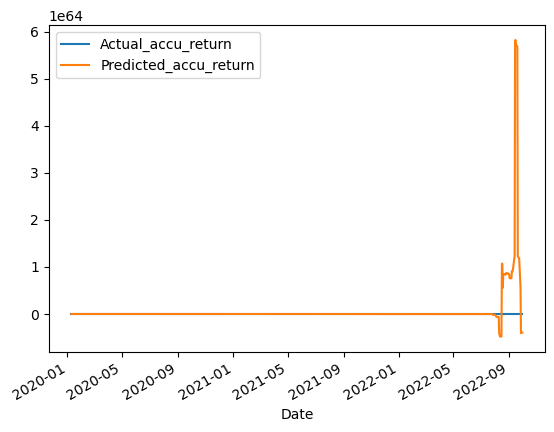

In [196]:
overall_hsi_poly2.iloc[:,2:].plot()

In [197]:
X,y=hsi_data1[name],hsi_data1["hsi_daily_return"]
poly = PolynomialFeatures(degree=3, include_bias=False)
poly_features = poly.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=42)

poly_reg_model = LinearRegression()
poly_reg_model.fit(X_train, y_train)
poly_reg_y_predicted = poly_reg_model.predict(X_test)
poly_reg_train_predicted = poly_reg_model.predict(X_train)
poly_reg_rmse_train = np.sqrt(mean_squared_error(y_train, poly_reg_train_predicted))
poly_reg_rmse_test = np.sqrt(mean_squared_error(y_test, poly_reg_y_predicted))
print(poly_reg_rmse_train,poly_reg_rmse_test) 

0.01601659435535938 3248.1580927166433


In [198]:
test_act_pred=pd.DataFrame({'Actual': y_test, 'Predicted': poly_reg_y_predicted})
train_act_pred=pd.DataFrame({"Actual": y_train, "Predicted": poly_reg_train_predicted})
overall_hsi_poly3=pd.concat([train_act_pred,test_act_pred])
overall_hsi_poly3=overall_hsi_poly3.sort_index();overall_hsi_poly3

,Actual,Predicted
Date,,
2020-01-10,0.002703,-0.000647
2020-01-13,0.011060,-0.000184
2020-01-14,-0.002411,-0.000794
2020-01-15,-0.003862,-0.000545
2020-01-16,0.003804,-0.000547
...,...,...
2022-09-26,-0.004357,-0.089584
2022-09-27,0.000290,-0.037876
2022-09-28,-0.034122,-0.035247


In [199]:
overall_hsi_poly3["Actual_accu_return"]=overall_hsi_poly3["Actual"]+1
overall_hsi_poly3["Predicted_accu_return"]=overall_hsi_poly3["Predicted"]+1

overall_hsi_poly3["Actual_accu_return"]=overall_hsi_poly3['Actual_accu_return'].cumprod()
overall_hsi_poly3["Predicted_accu_return"]=overall_hsi_poly3['Predicted_accu_return'].cumprod();overall_hsi_poly3

,Actual,Predicted,Actual_accu_return,Predicted_accu_return
Date,,,,
2020-01-10,0.002703,-0.000647,1.002703,9.993526e-01
2020-01-13,0.011060,-0.000184,1.013793,9.991686e-01
2020-01-14,-0.002411,-0.000794,1.011349,9.983752e-01
2020-01-15,-0.003862,-0.000545,1.007443,9.978310e-01
2020-01-16,0.003804,-0.000547,1.011275,9.972851e-01
...,...,...,...,...
2022-09-26,-0.004357,-0.089584,0.645418,-6.421728e+47
2022-09-27,0.000290,-0.037876,0.645605,-6.178499e+47
2022-09-28,-0.034122,-0.035247,0.623576,-5.960723e+47


<AxesSubplot:xlabel='Date'>

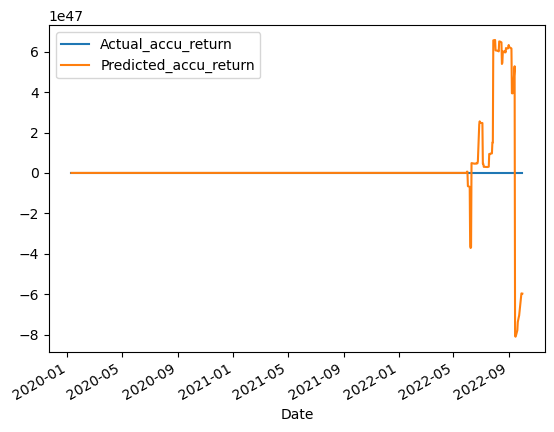

In [200]:
overall_hsi_poly3.iloc[:,2:].plot()

In [201]:
hsi_data1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.444444,0.002703
2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.0,5.0,0.0,4.0,5.0,1.000000,0.011060
2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,10.0,2.0,2.0,9.0,2.0,1.444444,-0.002411
2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,8.0,6.0,0.0,9.0,6.0,1.666667,-0.003862
2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,5.0,5.0,1.0,5.0,5.0,1.222222,0.003804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,116.0,1.0,0.0,109.0,8.0,13.000000,-0.004357
2022-09-27,14.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,107.0,0.0,0.0,103.0,4.0,11.888889,0.000290
2022-09-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,6.0,171.0,11.0,0.0,167.0,21.0,20.888889,-0.034122


In [202]:
name

['non_view_engagements',
 'comment_count',
 'like_count',
 'dislike_count',
 'love_count',
 'haha_count',
 'wow_count',
 'angry_count',
 'sad_count',
 'share_count',
 'view_count',
 'emoji_count',
 'fans_count',
 'ESG_label_content_Business Ethics & Values',
 'ESG_label_content_Climate Change',
 'ESG_label_content_Community Relations',
 'ESG_label_content_Corporate Governance',
 'ESG_label_content_Human Capital',
 'ESG_label_content_Natural Capital',
 'ESG_label_content_Non-ESG',
 'ESG_label_content_Pollution & Waste',
 'ESG_label_content_Product Liability',
 'ESG_label_headline_Business Ethics & Values',
 'ESG_label_headline_Climate Change',
 'ESG_label_headline_Community Relations',
 'ESG_label_headline_Corporate Governance',
 'ESG_label_headline_Human Capital',
 'ESG_label_headline_Natural Capital',
 'ESG_label_headline_Non-ESG',
 'ESG_label_headline_Pollution & Waste',
 'ESG_label_headline_Product Liability',
 'sentiment_label_headline_negative',
 'sentiment_label_headline_neutral'

In [ ]:
from scipy import stats

In [207]:
hsi_data2=hsi_data1.apply(stats.zscore);hsi_data2

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,-0.750315,-0.792498,-0.341845,-0.728649,-0.874312,-0.856646,0.216144
2020-01-13,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,-0.750315,0.105756,-0.341845,-0.728649,-0.123527,-0.734377,0.764676
2020-01-14,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,0.063707,-0.599065,-0.433197,1.162274,-0.601945,-0.573998,-0.636562,-0.119493
2020-01-15,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,0.063707,-0.649481,0.285406,-0.341845,-0.601945,0.026630,-0.587655,-0.214750
2020-01-16,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,0.063707,-0.725106,0.105756,0.410214,-0.703308,-0.123527,-0.685470,0.288400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,2.073020,-0.612847,-0.341845,1.932124,0.326944,1.906625,-0.247225
2022-09-27,-0.293851,-0.194233,-0.302935,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,1.846145,-0.792498,-0.341845,1.780079,-0.273684,1.662088,0.057736
2022-09-28,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,2.267185,3.459479,1.183660,-0.341845,3.401884,2.278985,3.642840,-2.200923


In [208]:
hsi_data2=hsi_data2.clip(lower=-2,upper=2)
hsi_data2["hsi_daily_return"]=hsi_data1["hsi_daily_return"];hsi_data2

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,-0.750315,-0.792498,-0.341845,-0.728649,-0.874312,-0.856646,0.002703
2020-01-13,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,-0.750315,0.105756,-0.341845,-0.728649,-0.123527,-0.734377,0.011060
2020-01-14,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,0.063707,-0.599065,-0.433197,1.162274,-0.601945,-0.573998,-0.636562,-0.002411
2020-01-15,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,0.063707,-0.649481,0.285406,-0.341845,-0.601945,0.026630,-0.587655,-0.003862
2020-01-16,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,0.063707,-0.725106,0.105756,0.410214,-0.703308,-0.123527,-0.685470,0.003804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,2.000000,-0.612847,-0.341845,1.932124,0.326944,1.906625,-0.004357
2022-09-27,-0.293851,-0.194233,-0.302935,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,-0.376988,1.846145,-0.792498,-0.341845,1.780079,-0.273684,1.662088,0.000290
2022-09-28,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.229612,-0.257431,2.000000,2.000000,1.183660,-0.341845,2.000000,2.000000,2.000000,-0.034122


In [209]:
hsi_data2["Positive_return_or_not"]=np.where(hsi_data2["hsi_daily_return"]>=0,1,0);hsi_data2

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,sentiment_label_headline_negative,sentiment_label_headline_neutral,sentiment_label_headline_positive,sentiment_label_content_negative,sentiment_label_content_neutral,sentiment_label_content_positive,ESG_average,hsi_daily_return,Positive_return_or_not
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-10,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,-0.376988,-0.750315,-0.792498,-0.341845,-0.728649,-0.874312,-0.856646,0.002703,1
2020-01-13,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,-0.376988,-0.750315,0.105756,-0.341845,-0.728649,-0.123527,-0.734377,0.011060,1
2020-01-14,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,0.063707,-0.599065,-0.433197,1.162274,-0.601945,-0.573998,-0.636562,-0.002411,0
2020-01-15,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,0.063707,-0.649481,0.285406,-0.341845,-0.601945,0.026630,-0.587655,-0.003862,0
2020-01-16,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,0.063707,-0.725106,0.105756,0.410214,-0.703308,-0.123527,-0.685470,0.003804,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,-0.376988,2.000000,-0.612847,-0.341845,1.932124,0.326944,1.906625,-0.004357,0
2022-09-27,-0.293851,-0.194233,-0.302935,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,-0.376988,1.846145,-0.792498,-0.341845,1.780079,-0.273684,1.662088,0.000290,1
2022-09-28,-0.344300,-0.194233,-0.377798,-0.115673,-0.211636,-0.107782,-0.161489,-0.08513,-0.157232,-0.271385,...,-0.257431,2.000000,2.000000,1.183660,-0.341845,2.000000,2.000000,2.000000,-0.034122,0


In [211]:
len(hsi_data2[hsi_data2["Positive_return_or_not"]==1])

337

In [212]:
len(hsi_data2[hsi_data2["Positive_return_or_not"]==0])

334

In [213]:
x_train=hsi_data2[name][:470]
y_train=hsi_data2["Positive_return_or_not"][:470]
x_test=hsi_data2[name][470:]
y_test=hsi_data2["Positive_return_or_not"][470:]

In [214]:
X_train_shift = x_train.values
Y_train_shift = y_train.values

X_test_shift = x_test.values
Y_test_shift = y_test.values

In [215]:
from sklearn import preprocessing, metrics
scaler = preprocessing.MinMaxScaler()

X_train_trans = scaler.fit_transform(X_train_shift)

# Transform test data
X_test_trans = scaler.transform(X_test_shift)

Random Forest Accuracy: 0.537
--------------------------------------
              precision    recall  f1-score   support

           0       0.59      0.45      0.51       108
           1       0.50      0.63      0.56        93

    accuracy                           0.54       201
   macro avg       0.55      0.54      0.54       201
weighted avg       0.55      0.54      0.53       201



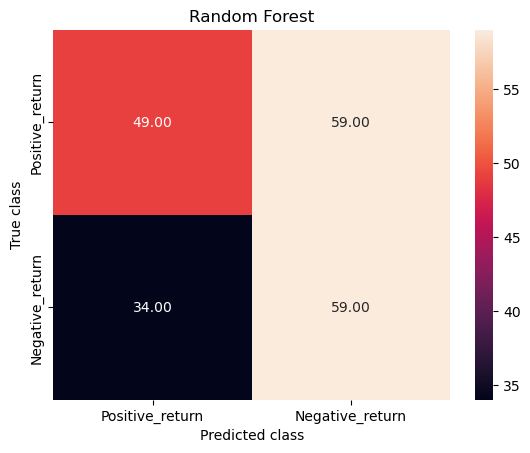

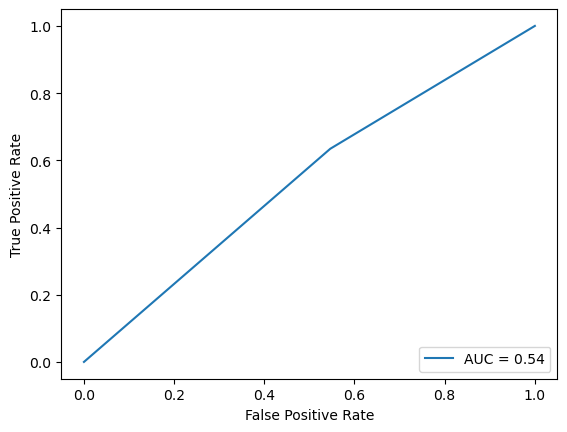

In [233]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
clf = RandomForestClassifier(max_depth=4,n_estimators=13500)
clf.fit(X_train_trans, Y_train_shift)
# Predict!
Y_pred = clf.predict(X_test_trans)
print('Random Forest Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))
clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Random Forest')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Gradient Boosting Accuracy: 0.542
--------------------------------------
              precision    recall  f1-score   support

           0       0.58      0.52      0.55       108
           1       0.50      0.57      0.54        93

    accuracy                           0.54       201
   macro avg       0.54      0.54      0.54       201
weighted avg       0.55      0.54      0.54       201



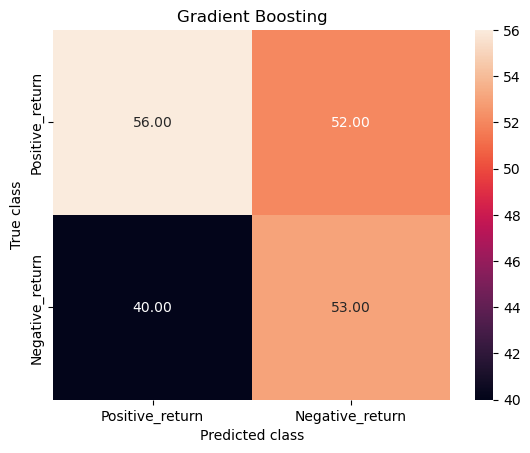

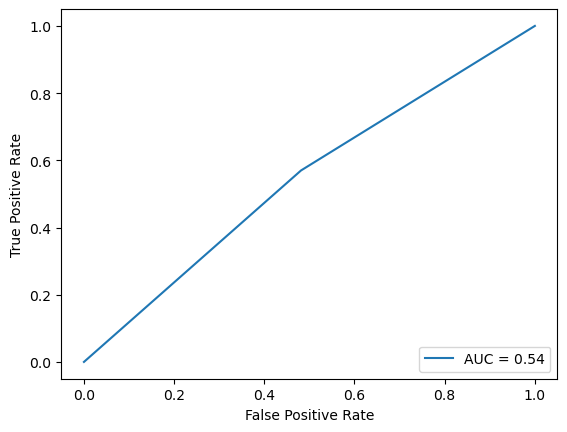

In [259]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier(learning_rate=0.00125,n_estimators=15000, subsample=0.4,max_depth=3,max_features='sqrt')
clf.fit(X_train_trans, Y_train_shift)

Y_pred = clf.predict(X_test_trans)
print('Gradient Boosting Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Gradient Boosting')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

AdaBoosting Accuracy: 0.597
--------------------------------------
              precision    recall  f1-score   support

           0       0.65      0.56      0.60       108
           1       0.56      0.65      0.60        93

    accuracy                           0.60       201
   macro avg       0.60      0.60      0.60       201
weighted avg       0.60      0.60      0.60       201



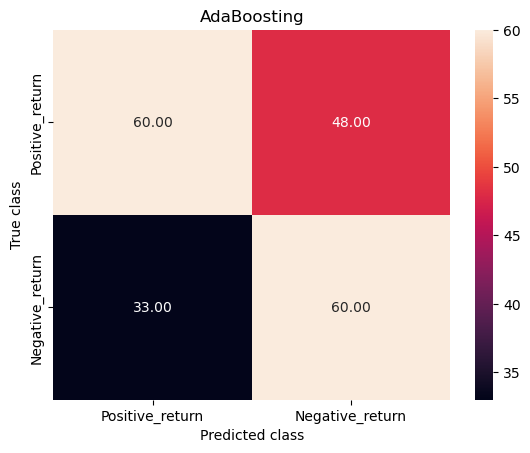

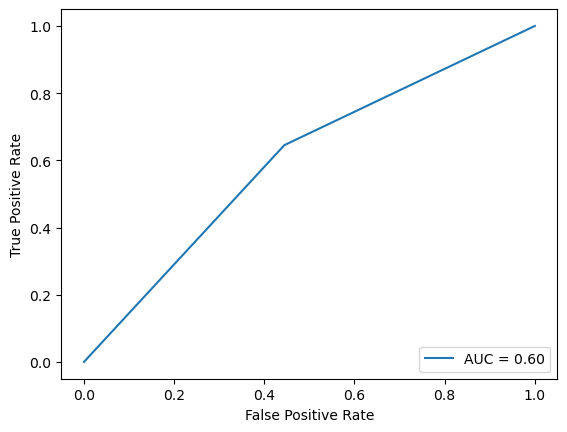

In [303]:
from sklearn.ensemble import AdaBoostClassifier

adab = AdaBoostClassifier(n_estimators=1500,random_state=42, learning_rate=0.06575)
adab.fit(X_train_trans, Y_train_shift)

# Predict!
Y_pred = adab.predict(X_test_trans)
print('AdaBoosting Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('AdaBoosting')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Support Vector Classification Accuracy: 0.463
--------------------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       108
           1       0.46      1.00      0.63        93

    accuracy                           0.46       201
   macro avg       0.23      0.50      0.32       201
weighted avg       0.21      0.46      0.29       201



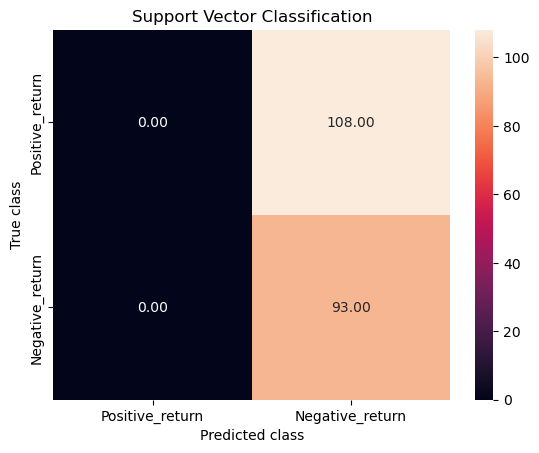

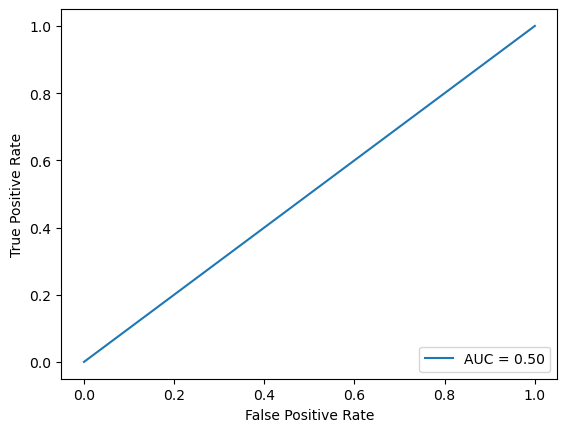

In [322]:
from sklearn.svm import SVC

svc = SVC(kernel='rbf',random_state=42,degree=2,C=0.055).fit(X_train_trans, Y_train_shift)


# Predict!
Y_pred = svc.predict(X_test_trans)
print('Support Vector Classification Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Support Vector Classification')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()


Bagging Classification Accuracy: 0.517
--------------------------------------
              precision    recall  f1-score   support

           0       0.56      0.48      0.52       108
           1       0.48      0.56      0.52        93

    accuracy                           0.52       201
   macro avg       0.52      0.52      0.52       201
weighted avg       0.52      0.52      0.52       201



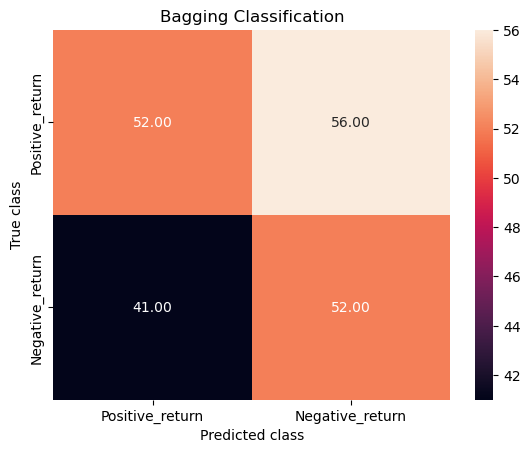

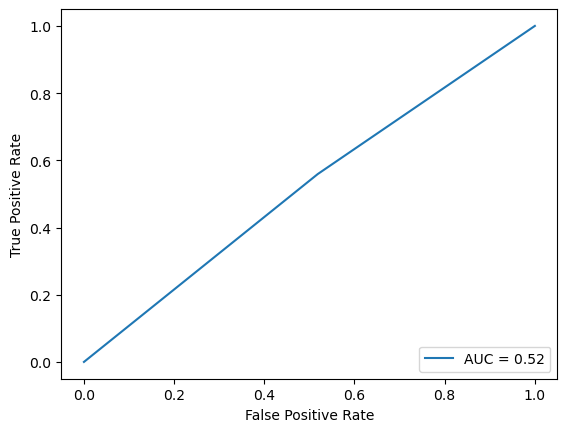

In [328]:
from sklearn.ensemble import BaggingClassifier
bg = BaggingClassifier(n_estimators=1500,max_features=37,random_state=42).fit(X_train_trans, Y_train_shift)
Y_pred = bg.predict(X_test_trans)
print('Bagging Classification Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Bagging Classification')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

KNN Accuracy: 0.587
--------------------------------------
              precision    recall  f1-score   support

           0       0.63      0.57      0.60       108
           1       0.55      0.60      0.57        93

    accuracy                           0.59       201
   macro avg       0.59      0.59      0.59       201
weighted avg       0.59      0.59      0.59       201



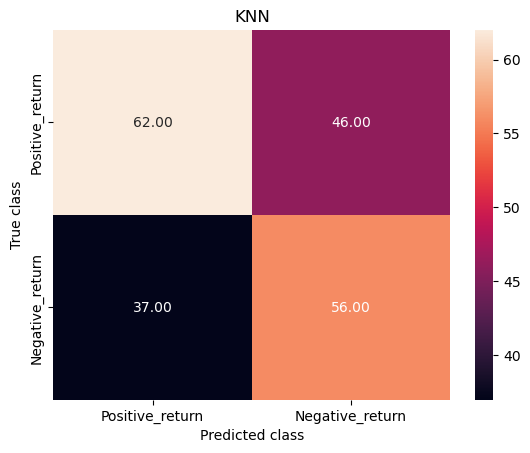

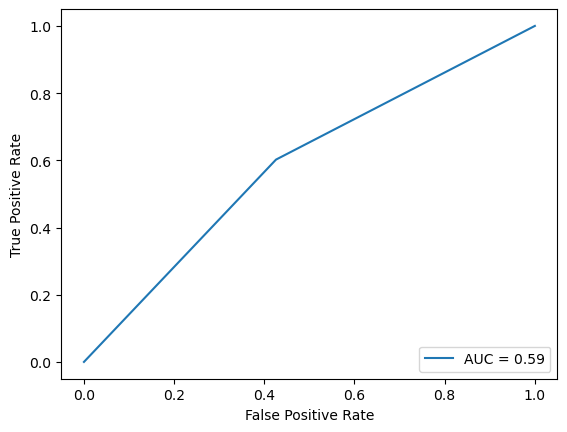

In [399]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=23,algorithm="brute",weights="uniform").fit(X_train_trans, Y_train_shift)
Y_pred = neigh.predict(X_test_trans)
print('KNN Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('KNN')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Extratrees classifier Accuracy: 0.483
--------------------------------------
              precision    recall  f1-score   support

           0       0.54      0.26      0.35       108
           1       0.46      0.74      0.57        93

    accuracy                           0.48       201
   macro avg       0.50      0.50      0.46       201
weighted avg       0.50      0.48      0.45       201



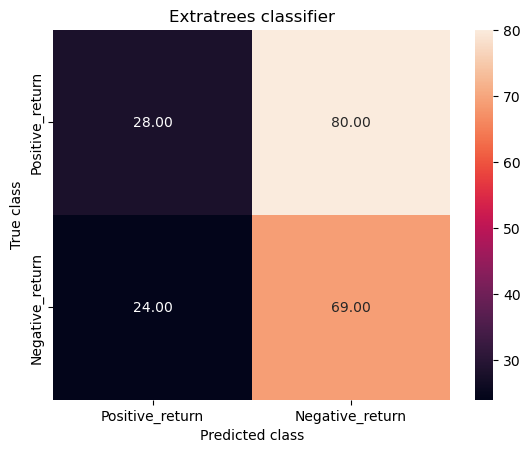

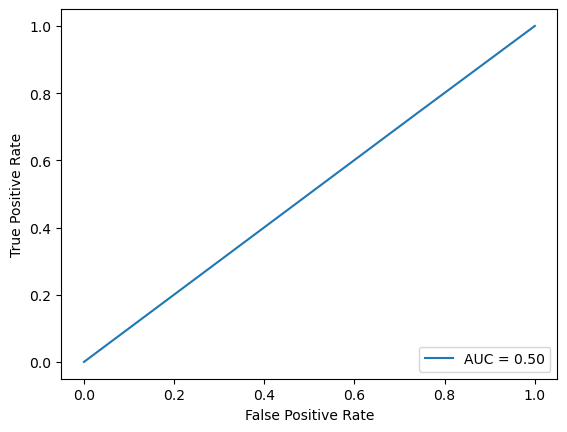

In [411]:
from sklearn.ensemble import ExtraTreesClassifier
extra = ExtraTreesClassifier(n_estimators=5500,max_depth=10,min_samples_leaf=0.05).fit(X_train_trans, Y_train_shift)
Y_pred = extra.predict(X_test_trans)
print('Extratrees classifier Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Extratrees classifier')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Linear SVC Accuracy: 0.473
--------------------------------------
              precision    recall  f1-score   support

           0       0.52      0.30      0.38       108
           1       0.45      0.68      0.54        93

    accuracy                           0.47       201
   macro avg       0.48      0.49      0.46       201
weighted avg       0.49      0.47      0.45       201



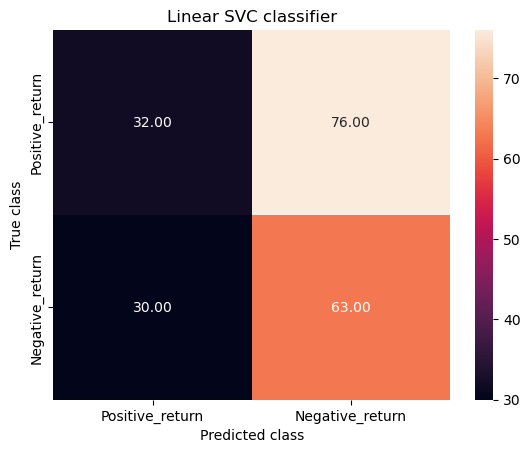

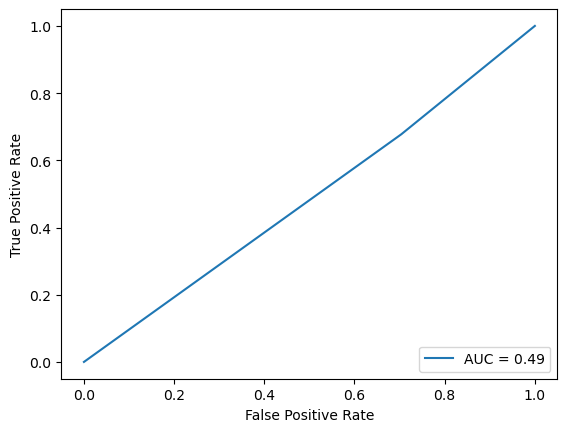

In [419]:
from sklearn.svm import LinearSVC
linear=LinearSVC(tol=1,penalty="l2").fit(X_train_trans, Y_train_shift)
Y_pred = linear.predict(X_test_trans)
print('Linear SVC Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Linear SVC classifier')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

In [420]:
china=pd.read_csv("C:/Users/attil/Downloads/Chi_Key_words (2)/Key_words/20230111225238_China_Zhongguo/China_keywords.csv");china

,Unnamed: 0,Date,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,26666,2/1/2020 14:18,0,NaN,0.0,0.0,0.0,0,0.0,0,...,"China Evaluation News Agency, Beijing, January...","China Evaluation News Agency, Beijing, January...",0.537220,positive,0.537220,positive,Community Relations,0.958187,Community Relations,0.958187
1,26746,4/1/2020 11:16,0,NaN,0.0,0.0,0.0,0,0.0,0,...,"On October 29, 2019, this is a pure-electric n...","On October 29, 2019, this is a pure-electric n...",0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
2,26747,4/1/2020 11:16,0,NaN,0.0,0.0,0.0,0,0.0,0,...,"On October 29, 2019, this is a pure-electric n...","On October 29, 2019, this is a pure-electric n...",0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
3,26748,4/1/2020 11:16,0,NaN,0.0,0.0,0.0,0,0.0,0,...,"On October 29, 2019, this is a pure-electric n...","On October 29, 2019, this is a pure-electric n...",0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
4,26762,5/1/2020 14:59,0,NaN,0.0,0.0,0.0,0,0.0,0,...,"China Evaluation Agency, Beijing, January 5th ...","China Evaluation Agency, Beijing, January 5th ...",0.518333,positive,0.518333,positive,Community Relations,0.957300,Community Relations,0.957300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9622,116972,30/9/2022 19:39,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Ambassador to Peru, Song Yang, attended the 73...","China Review Agency, Beijing, September 30th /...",0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9623,116973,30/9/2022 19:39,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Ambassador to Peru, Song Yang, attended the 73...","China Review Agency, Beijing, September 30th /...",0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9624,116962,30/9/2022 19:40,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Consul General Chen Peijie, Consul General in ...","China Review Agency, Beijing, September 30th /...",0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
9625,116967,30/9/2022 19:40,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Consul General Chen Peijie, Consul General in ...","China Review Agency, Beijing, September 30th /...",0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [475]:
china1=china.iloc[:,[1,-8,-7,-6,-5,-4,-3,-2,-1]];china1

,Date,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,2/1/2020 14:18,0.537220,positive,0.537220,positive,Community Relations,0.958187,Community Relations,0.958187
1,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
2,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
3,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
4,5/1/2020 14:59,0.518333,positive,0.518333,positive,Community Relations,0.957300,Community Relations,0.957300
...,...,...,...,...,...,...,...,...,...
9622,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9623,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9624,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
9625,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [476]:
china1.columns=["Date","senti_score_headline","senti_label_headline","senti_score_content","senti_label_content","ESG_label_headline","ESG_headline_score","ESG_label_content","ESG_content_score"];china1

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score
0,2/1/2020 14:18,0.537220,positive,0.537220,positive,Community Relations,0.958187,Community Relations,0.958187
1,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
2,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
3,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
4,5/1/2020 14:59,0.518333,positive,0.518333,positive,Community Relations,0.957300,Community Relations,0.957300
...,...,...,...,...,...,...,...,...,...
9622,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9623,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9624,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
9625,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [442]:
# china1["Date"]=pd.to_datetime(china1["Date"],errors="coerce",format="%D/%M/%Y %H:%M")
# china1["Date"]=china1["Date"].dt.strftime('%y-%m-%d')
# china1["Date"]=pd.to_datetime(china1["Date"],format='%y-%m-%d');china1

In [477]:
china1

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score
0,2/1/2020 14:18,0.537220,positive,0.537220,positive,Community Relations,0.958187,Community Relations,0.958187
1,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
2,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
3,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
4,5/1/2020 14:59,0.518333,positive,0.518333,positive,Community Relations,0.957300,Community Relations,0.957300
...,...,...,...,...,...,...,...,...,...
9622,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9623,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9624,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
9625,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [480]:
for word in range(len(china1["Date"])):
    china1.loc[word]["Date"]=str(china1.loc[word]["Date"][:-2])

In [481]:
china1

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score
0,2/1/2020 14:18,0.537220,positive,0.537220,positive,Community Relations,0.958187,Community Relations,0.958187
1,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
2,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
3,4/1/2020 11:16,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
4,5/1/2020 14:59,0.518333,positive,0.518333,positive,Community Relations,0.957300,Community Relations,0.957300
...,...,...,...,...,...,...,...,...,...
9622,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9623,30/9/2022 19:39,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9624,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
9625,30/9/2022 19:40,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [473]:
for word in range(len(china1["Date"])):
    if "pm" in china1.loc[word]["Date"]:
        print(word)

In [467]:
china1["Date"]=pd.to_datetime(china1["Date"],errors='coerce')
# china1["Date"]=china1["Date"].dt.strftime('%y-%m-%d')
# china1["Date"]=pd.to_datetime(china1["Date"],format='%y-%m-%d');china1

,Date,senti_score_headline,senti_label_headline,senti_score_content,senti_label_content,ESG_label_headline,ESG_headline_score,ESG_label_content,ESG_content_score
0,2020-02-01,0.537220,positive,0.537220,positive,Community Relations,0.958187,Community Relations,0.958187
1,2020-04-01,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
2,2020-04-01,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
3,2020-04-01,0.541372,positive,0.541372,positive,Climate Change,0.841170,Climate Change,0.841170
4,2020-05-01,0.518333,positive,0.518333,positive,Community Relations,0.957300,Community Relations,0.957300
...,...,...,...,...,...,...,...,...,...
9622,2022-09-30,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9623,2022-09-30,0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
9624,2022-09-30,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
9625,2022-09-30,0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [474]:
type(china1.loc[2]["Date"])

str

In [482]:
dev=pd.read_csv("C:/Users/attil/Downloads/Chi_Key_words (2)/Key_words/20230112000059_development_fazhang/develop_keywords.csv");dev

,Unnamed: 0,Date,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,26715,1/3/2020 8:08,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,"Li Weinong, the director of the Macau Economic...","Li Weinong, the director of the Macau Economic...",0.503600,positive,0.503600,positive,Community Relations,0.856447,Community Relations,0.856447
1,26712,1/3/2020 16:08,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,"Li Weinong, the director of the Macau Economic...","Li Weinong, the director of the Macau Economic...",0.509684,positive,0.509684,positive,Community Relations,0.831087,Community Relations,0.831087
2,26713,1/3/2020 16:08,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,"Li Weinong, the director of the Macau Economic...","Li Weinong, the director of the Macau Economic...",0.509684,positive,0.509684,positive,Community Relations,0.831087,Community Relations,0.831087
3,26714,1/3/2020 16:08,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,"Li Weinong, the director of the Macau Economic...","Li Weinong, the director of the Macau Economic...",0.509684,positive,0.509684,positive,Community Relations,0.831087,Community Relations,0.831087
4,26725,1/3/2020 16:08,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,"Li Weinong, the director of the Macau Economic...","Li Weinong, the director of the Macau Economic...",0.509684,positive,0.509684,positive,Community Relations,0.831087,Community Relations,0.831087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16333,116972,9/30/2022 19:39,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Ambassador to Peru, Song Yang, attended the 73...","China Review Agency, Beijing, September 30th /...",0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
16334,116973,9/30/2022 19:39,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Ambassador to Peru, Song Yang, attended the 73...","China Review Agency, Beijing, September 30th /...",0.918736,neutral,0.728135,neutral,Community Relations,0.983155,Community Relations,0.975746
16335,116962,9/30/2022 19:40,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Consul General Chen Peijie, Consul General in ...","China Review Agency, Beijing, September 30th /...",0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136
16336,116967,9/30/2022 19:40,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Consul General Chen Peijie, Consul General in ...","China Review Agency, Beijing, September 30th /...",0.914050,neutral,0.797920,positive,Human Capital,0.683613,Community Relations,0.984136


In [486]:
develop=dev.iloc[:,[1,-7,-5,-4,-2]];develop

,Date,Unnamed: 25,Unnamed: 27,Unnamed: 28,Unnamed: 30
0,1/3/2020 8:08,positive,positive,Community Relations,Community Relations
1,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
2,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
3,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
4,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
...,...,...,...,...,...
16333,9/30/2022 19:39,neutral,neutral,Community Relations,Community Relations
16334,9/30/2022 19:39,neutral,neutral,Community Relations,Community Relations
16335,9/30/2022 19:40,neutral,positive,Human Capital,Community Relations
16336,9/30/2022 19:40,neutral,positive,Human Capital,Community Relations


In [487]:
develop.columns=["Date","senti_label_headline","senti_label_content","ESG_label_headline","ESG_label_content"];develop

,Date,senti_label_headline,senti_label_content,ESG_label_headline,ESG_label_content
0,1/3/2020 8:08,positive,positive,Community Relations,Community Relations
1,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
2,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
3,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
4,1/3/2020 16:08,positive,positive,Community Relations,Community Relations
...,...,...,...,...,...
16333,9/30/2022 19:39,neutral,neutral,Community Relations,Community Relations
16334,9/30/2022 19:39,neutral,neutral,Community Relations,Community Relations
16335,9/30/2022 19:40,neutral,positive,Human Capital,Community Relations
16336,9/30/2022 19:40,neutral,positive,Human Capital,Community Relations


In [488]:
develop["Date"]=pd.to_datetime(develop["Date"])
develop["Date"]=develop["Date"].dt.strftime('%y-%m-%d')
develop["Date"]=pd.to_datetime(develop["Date"],format='%y-%m-%d');develop

,Date,senti_label_headline,senti_label_content,ESG_label_headline,ESG_label_content
0,2020-01-03,positive,positive,Community Relations,Community Relations
1,2020-01-03,positive,positive,Community Relations,Community Relations
2,2020-01-03,positive,positive,Community Relations,Community Relations
3,2020-01-03,positive,positive,Community Relations,Community Relations
4,2020-01-03,positive,positive,Community Relations,Community Relations
...,...,...,...,...,...
16333,2022-09-30,neutral,neutral,Community Relations,Community Relations
16334,2022-09-30,neutral,neutral,Community Relations,Community Relations
16335,2022-09-30,neutral,positive,Human Capital,Community Relations
16336,2022-09-30,neutral,positive,Human Capital,Community Relations


In [489]:
develop=develop.join(pd.get_dummies(develop[["senti_label_headline","senti_label_content","ESG_label_headline","ESG_label_content"]]));develop

,Date,senti_label_headline,senti_label_content,ESG_label_headline,ESG_label_content,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
0,2020-01-03,positive,positive,Community Relations,Community Relations,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
1,2020-01-03,positive,positive,Community Relations,Community Relations,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
2,2020-01-03,positive,positive,Community Relations,Community Relations,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
3,2020-01-03,positive,positive,Community Relations,Community Relations,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
4,2020-01-03,positive,positive,Community Relations,Community Relations,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16333,2022-09-30,neutral,neutral,Community Relations,Community Relations,0,1,0,0,1,...,0,0,0,1,0,0,0,0,0,0
16334,2022-09-30,neutral,neutral,Community Relations,Community Relations,0,1,0,0,1,...,0,0,0,1,0,0,0,0,0,0
16335,2022-09-30,neutral,positive,Human Capital,Community Relations,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
16336,2022-09-30,neutral,positive,Human Capital,Community Relations,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [490]:
develop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16338 entries, 0 to 16337
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Date                                         16338 non-null  datetime64[ns]
 1   senti_label_headline                         15944 non-null  object        
 2   senti_label_content                          15944 non-null  object        
 3   ESG_label_headline                           15944 non-null  object        
 4   ESG_label_content                            15944 non-null  object        
 5   senti_label_headline_negative                16338 non-null  uint8         
 6   senti_label_headline_neutral                 16338 non-null  uint8         
 7   senti_label_headline_positive                16338 non-null  uint8         
 8   senti_label_content_negative                 16338 non-null  uint8         


In [491]:
develop=develop.drop(["senti_label_headline","senti_label_content","ESG_label_headline","ESG_label_content"],axis=1)
develop_group=develop.groupby(pd.Grouper(key="Date",axis=0,freq="D")).sum();develop_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,0,5,0,0,5,0,0,5,0,...,0,0,0,5,0,0,0,0,0,0
2020-01-04,0,6,0,0,6,0,0,3,3,0,...,0,0,0,5,0,0,0,1,0,0
2020-01-05,0,2,1,0,0,3,0,0,3,0,...,0,0,0,3,0,0,0,0,0,0
2020-01-06,0,2,2,0,1,3,0,0,2,1,...,0,0,0,3,0,0,1,0,0,0
2020-01-07,0,0,9,0,0,9,0,0,9,0,...,0,0,0,9,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,1,7,1,0,6,3,1,2,5,0,...,1,0,2,5,0,0,0,1,0,1
2022-09-27,0,52,13,0,30,35,0,23,28,0,...,5,1,13,45,0,2,1,2,1,0
2022-09-28,0,25,10,0,7,28,0,8,18,0,...,8,0,7,15,0,13,0,0,0,0


In [492]:
develop_group.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1002 entries, 2020-01-03 to 2022-09-30
Freq: D
Data columns (total 24 columns):
 #   Column                                       Non-Null Count  Dtype
---  ------                                       --------------  -----
 0   senti_label_headline_negative                1002 non-null   uint8
 1   senti_label_headline_neutral                 1002 non-null   uint8
 2   senti_label_headline_positive                1002 non-null   uint8
 3   senti_label_content_negative                 1002 non-null   uint8
 4   senti_label_content_neutral                  1002 non-null   uint8
 5   senti_label_content_positive                 1002 non-null   uint8
 6   ESG_label_headline_Business Ethics & Values  1002 non-null   uint8
 7   ESG_label_headline_Climate Change            1002 non-null   uint8
 8   ESG_label_headline_Community Relations       1002 non-null   uint8
 9   ESG_label_headline_Corporate Governance      1002 non-null   uint8
 10

In [493]:
develop_group["ESG_average"]=(econ_group.iloc[:,6:].sum(axis=1))/18

In [494]:
develop_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,0,0,5,0,0,5,0,0,5,0,...,0,0,5,0,0,0,0,0,0,0.351673
2020-01-04,0,6,0,0,6,0,0,3,3,0,...,0,0,5,0,0,0,1,0,0,0.820988
2020-01-05,0,2,1,0,0,3,0,0,3,0,...,0,0,3,0,0,0,0,0,0,0.234568
2020-01-06,0,2,2,0,1,3,0,0,2,1,...,0,0,3,0,0,1,0,0,0,-0.000440
2020-01-07,0,0,9,0,0,9,0,0,9,0,...,0,0,9,0,0,0,0,0,0,0.234757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,1,7,1,0,6,3,1,2,5,0,...,0,2,5,0,0,0,1,0,1,-0.000242
2022-09-27,0,52,13,0,30,35,0,23,28,0,...,1,13,45,0,2,1,2,1,0,0.351868
2022-09-28,0,25,10,0,7,28,0,8,18,0,...,0,7,15,0,13,0,0,0,0,0.584524


In [495]:
hsi_daily

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2020-01-02,28249.369141,28543.519531,28245.970703,28543.519531,28543.519531,1262732800,0.012550
2020-01-03,28828.359375,28883.300781,28428.169922,28451.500000,28451.500000,1797904800,-0.003224
2020-01-06,28326.500000,28367.869141,28054.289063,28226.189453,28226.189453,1793426600,-0.007919
2020-01-07,28352.679688,28473.080078,28264.070313,28322.060547,28322.060547,1302687200,0.003397
2020-01-08,27999.580078,28198.609375,27857.730469,28087.919922,28087.919922,1709241600,-0.008267
...,...,...,...,...,...,...,...
2022-09-26,17781.869141,18077.640625,17727.400391,17855.140625,17855.140625,2557096600,-0.004357
2022-09-27,17838.650391,17904.210938,17648.419922,17860.310547,17860.310547,1900500000,0.000290
2022-09-28,17703.390625,17703.390625,17184.539063,17250.880859,17250.880859,2948457300,-0.034122


In [496]:
develop_group["hsi_return"]=hsi_daily["Daily_return"]
name=[ a for a in develop_group.columns if a !="hsi_return" ];name

['senti_label_headline_negative',
 'senti_label_headline_neutral',
 'senti_label_headline_positive',
 'senti_label_content_negative',
 'senti_label_content_neutral',
 'senti_label_content_positive',
 'ESG_label_headline_Business Ethics & Values',
 'ESG_label_headline_Climate Change',
 'ESG_label_headline_Community Relations',
 'ESG_label_headline_Corporate Governance',
 'ESG_label_headline_Human Capital',
 'ESG_label_headline_Natural Capital',
 'ESG_label_headline_Non-ESG',
 'ESG_label_headline_Pollution & Waste',
 'ESG_label_headline_Product Liability',
 'ESG_label_content_Business Ethics & Values',
 'ESG_label_content_Climate Change',
 'ESG_label_content_Community Relations',
 'ESG_label_content_Corporate Governance',
 'ESG_label_content_Human Capital',
 'ESG_label_content_Natural Capital',
 'ESG_label_content_Non-ESG',
 'ESG_label_content_Pollution & Waste',
 'ESG_label_content_Product Liability',
 'ESG_average']

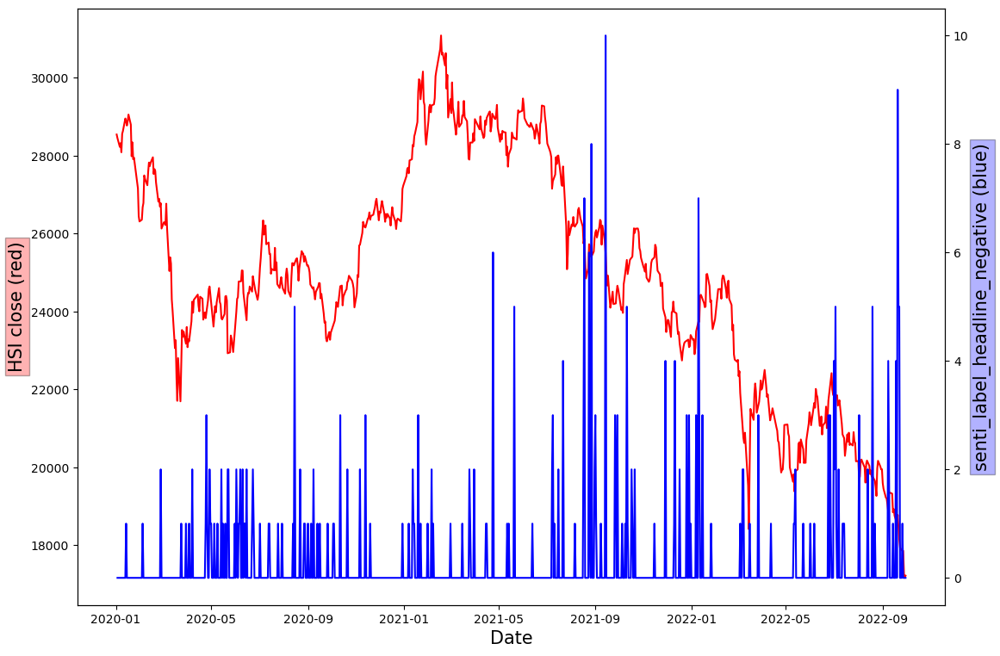

In [497]:
data_to_plot=develop_group["senti_label_headline_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('senti_label_headline_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

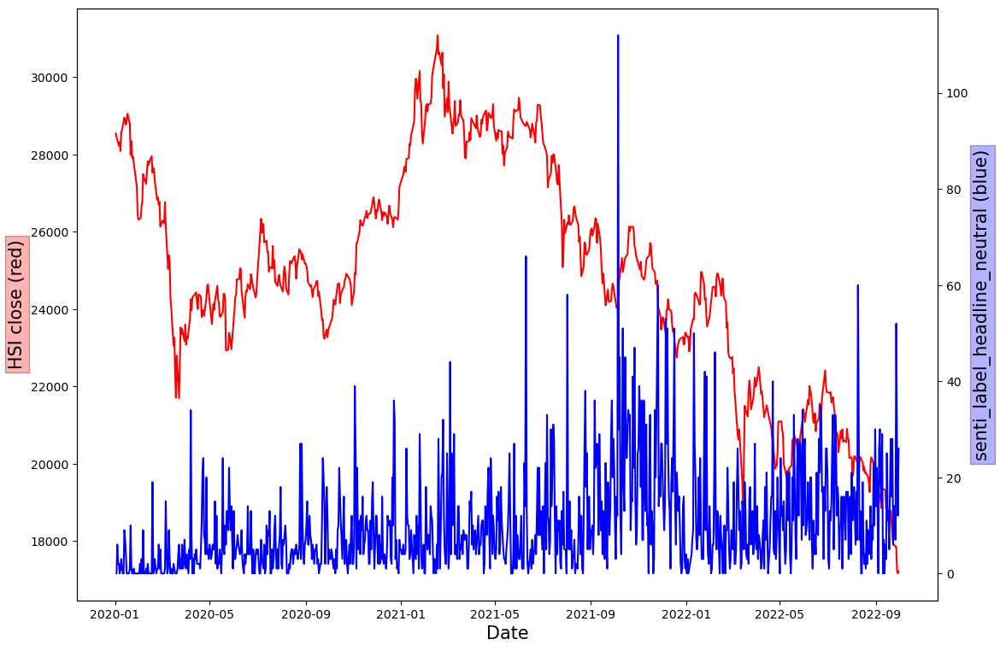

In [498]:
data_to_plot=develop_group["senti_label_headline_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('senti_label_headline_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

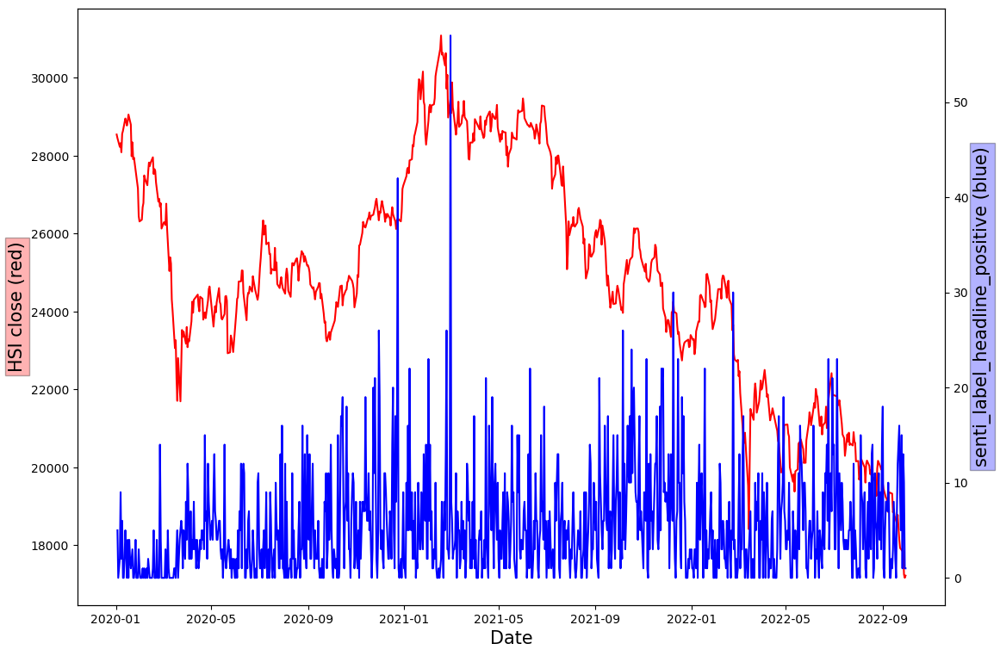

In [499]:
data_to_plot=develop_group["senti_label_headline_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('senti_label_headline_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

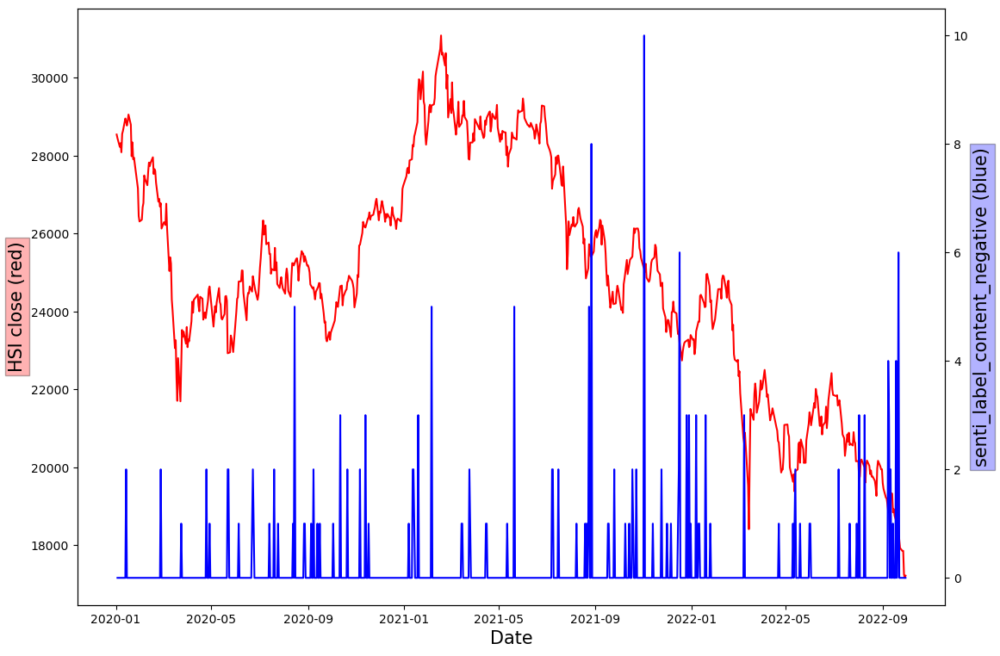

In [500]:
data_to_plot=develop_group["senti_label_content_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('senti_label_content_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

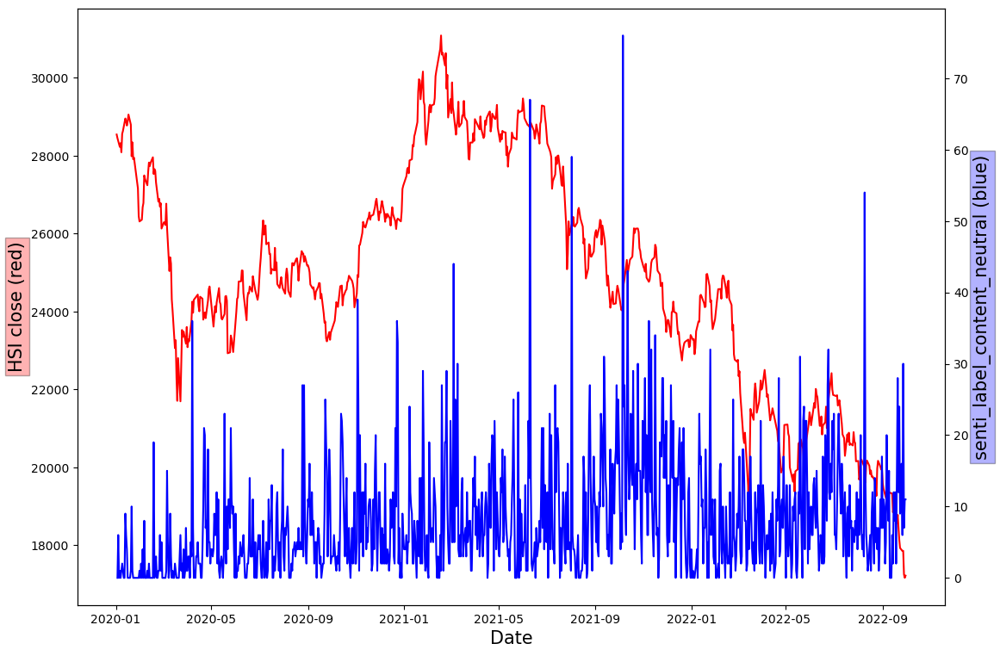

In [502]:
data_to_plot=develop_group["senti_label_content_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('senti_label_content_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

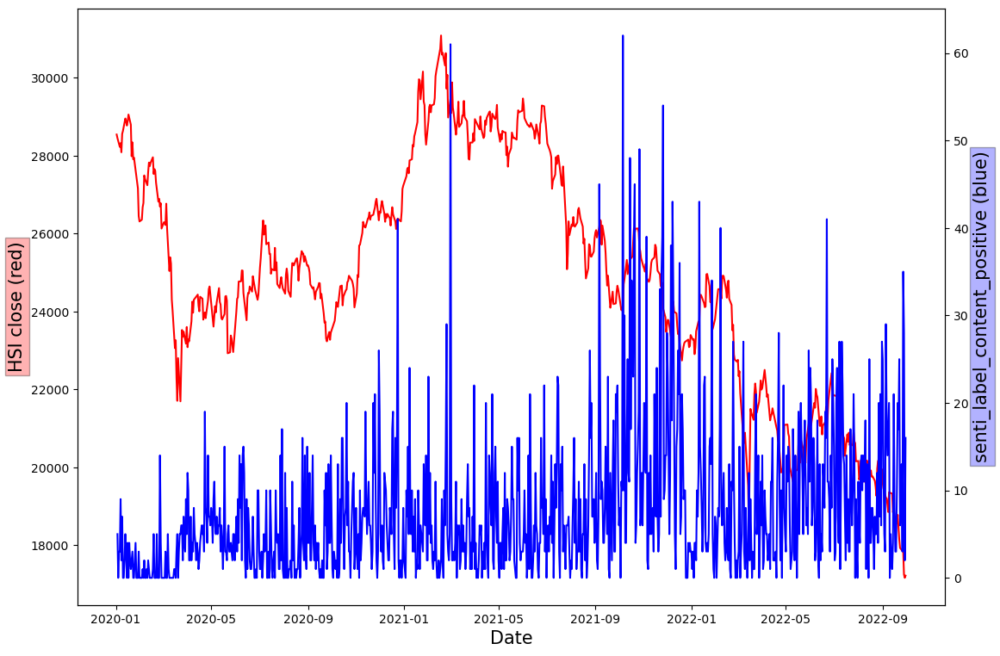

In [503]:
data_to_plot=develop_group["senti_label_content_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('senti_label_content_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

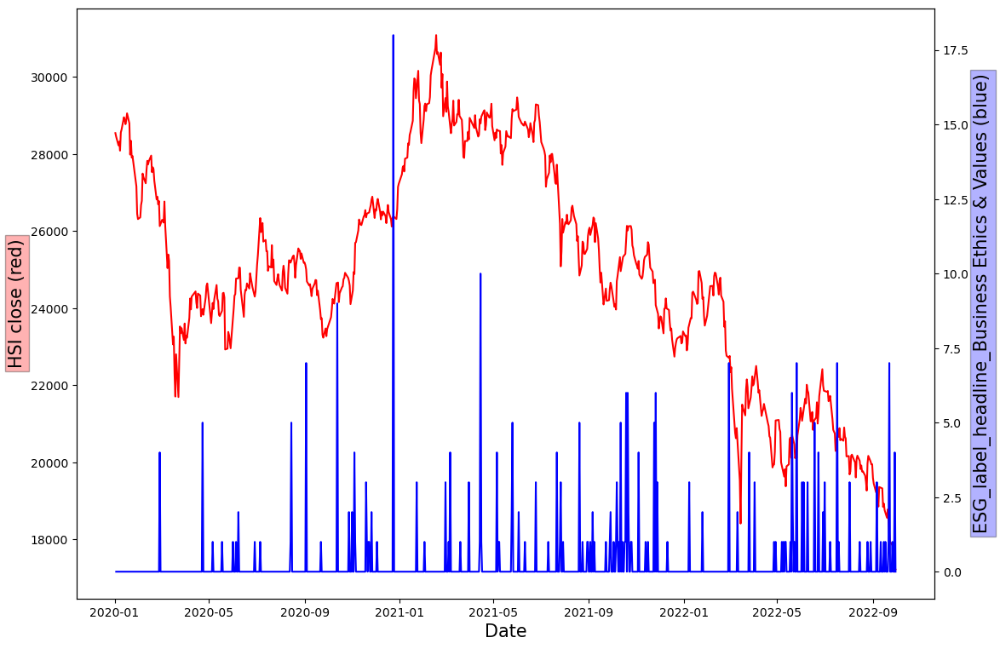

In [504]:
data_to_plot=develop_group["ESG_label_headline_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

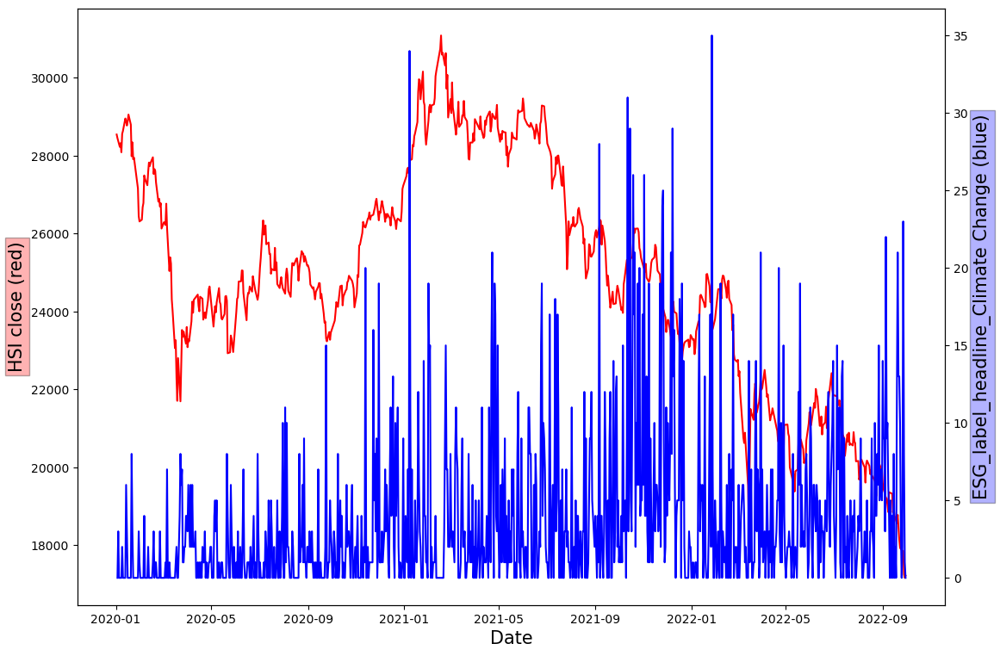

In [505]:
data_to_plot=develop_group["ESG_label_headline_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

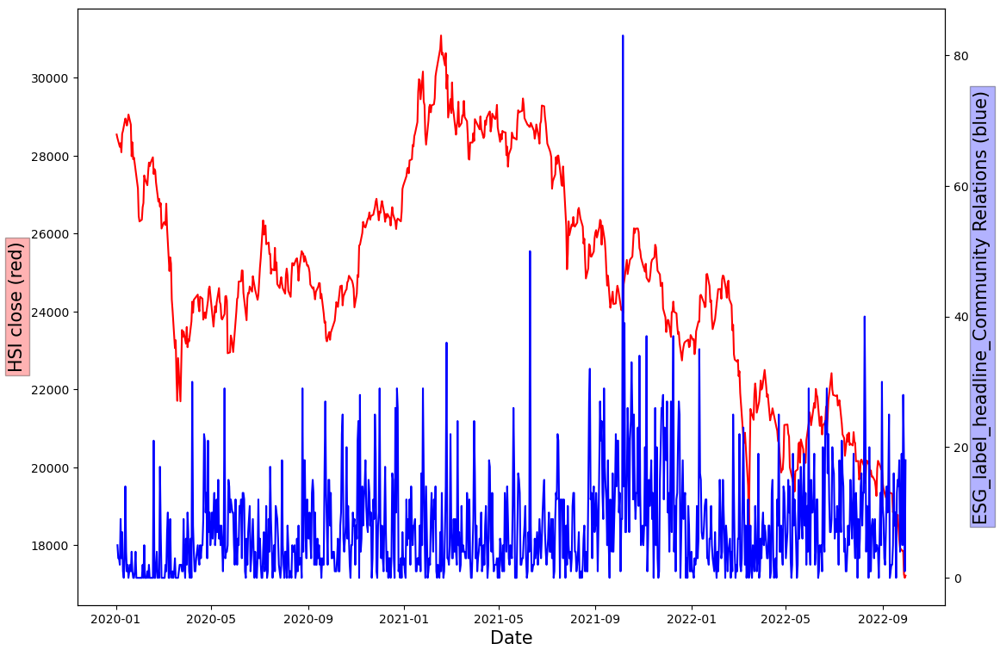

In [506]:
data_to_plot=develop_group["ESG_label_headline_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

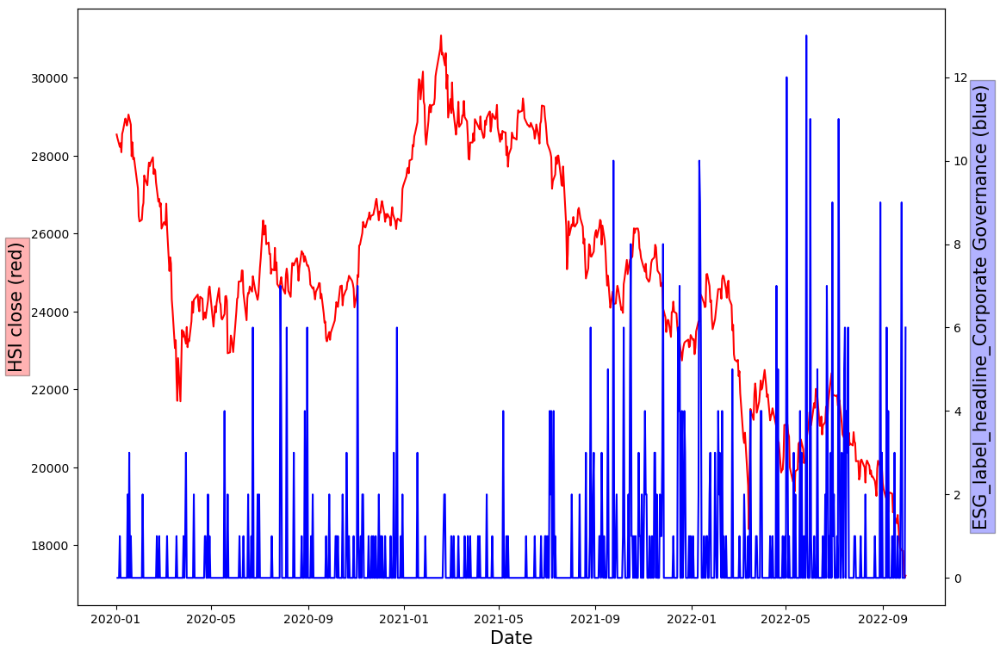

In [508]:
data_to_plot=develop_group["ESG_label_headline_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(70,-5) 
plt.ylabel('ESG_label_headline_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

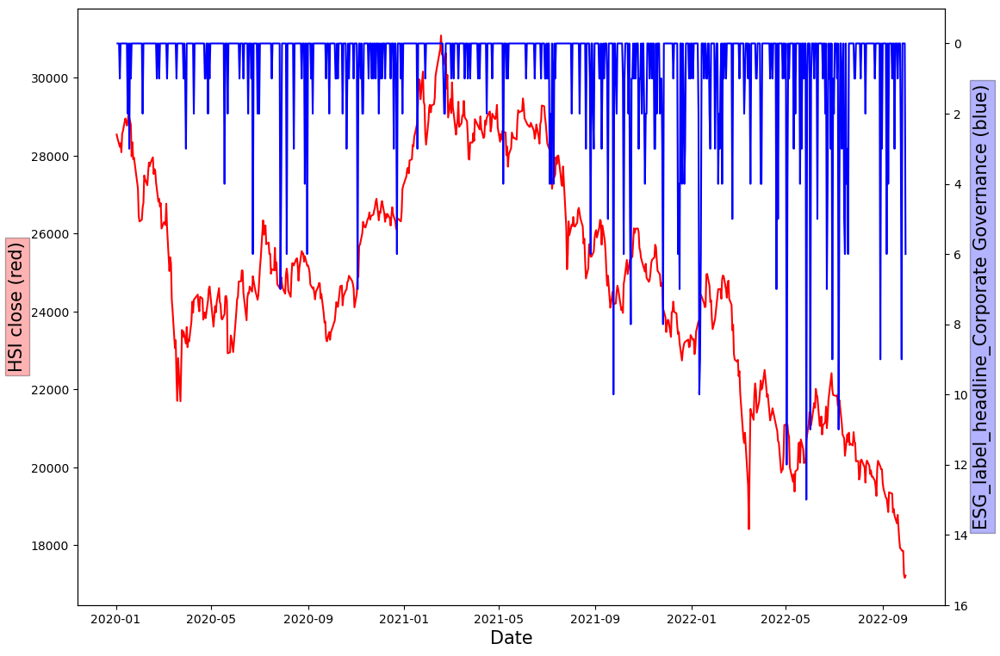

In [509]:
data_to_plot=develop_group["ESG_label_headline_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

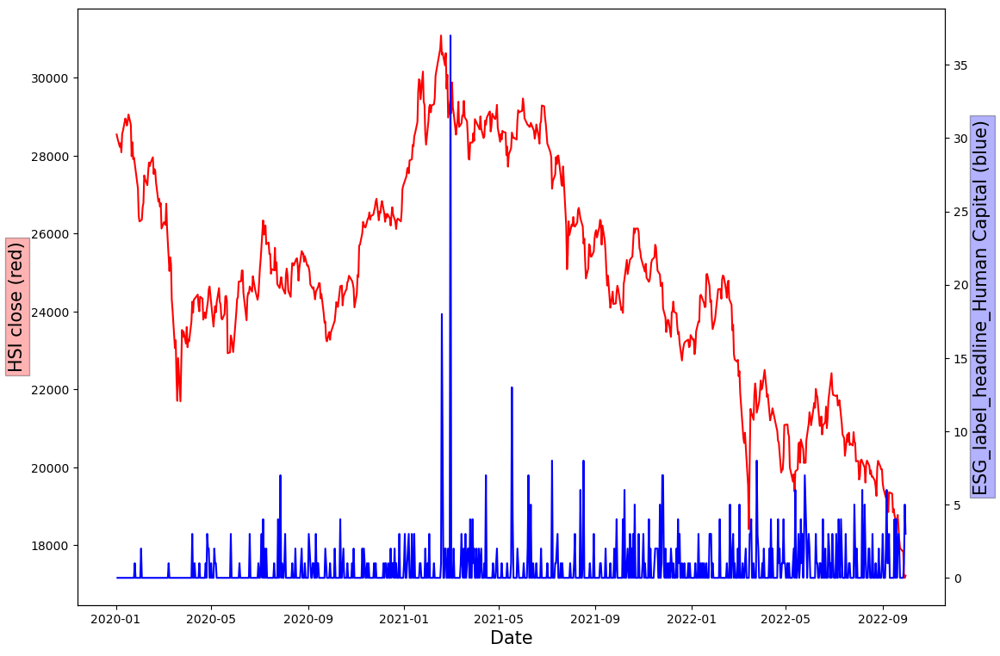

In [510]:
data_to_plot=develop_group["ESG_label_headline_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

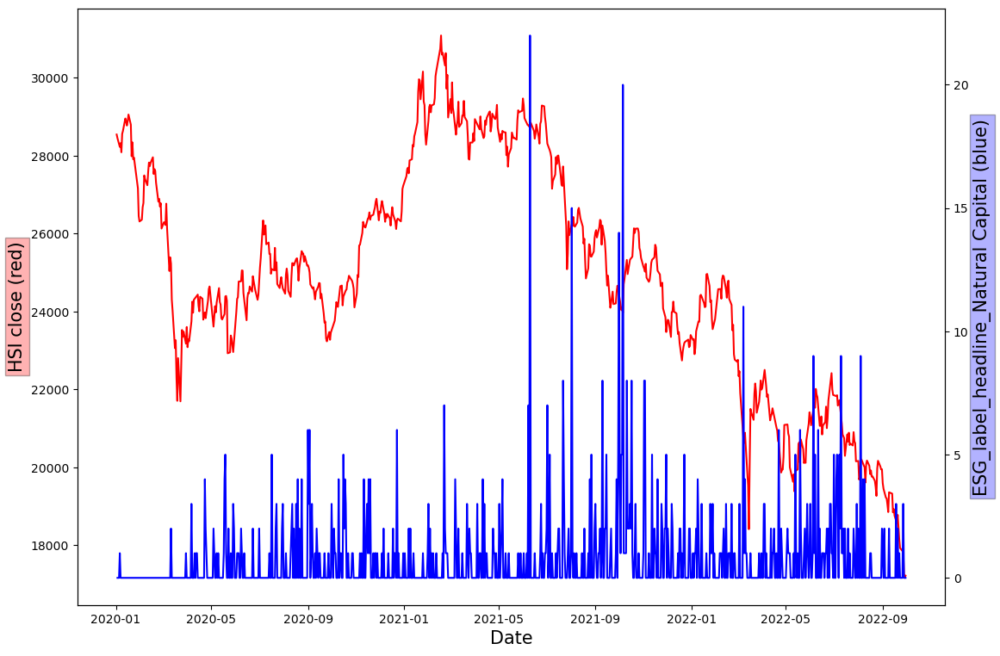

In [511]:
data_to_plot=develop_group["ESG_label_headline_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

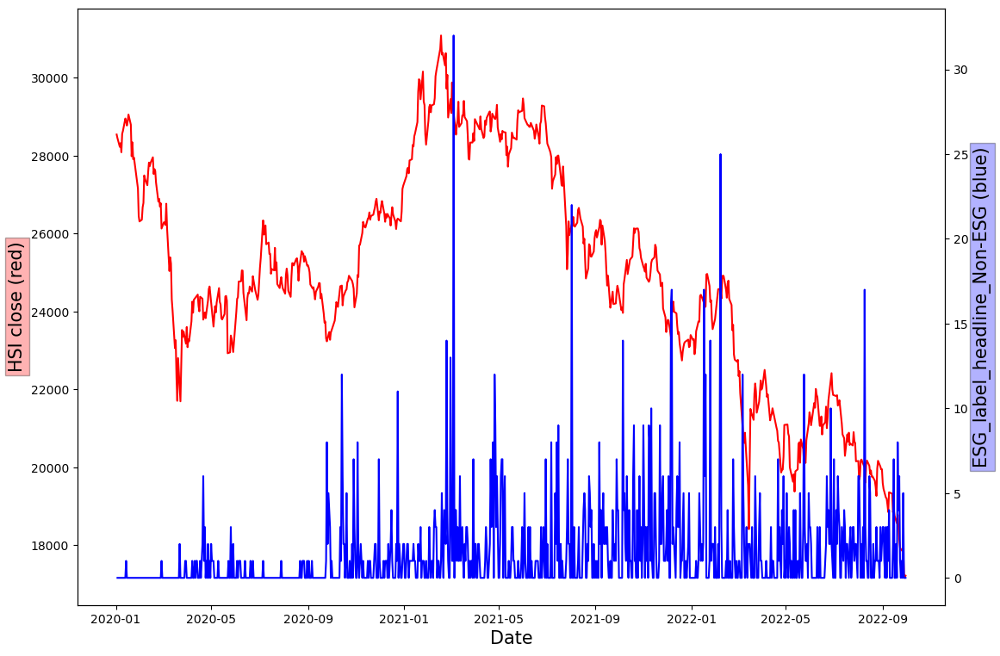

In [512]:
data_to_plot=develop_group["ESG_label_headline_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

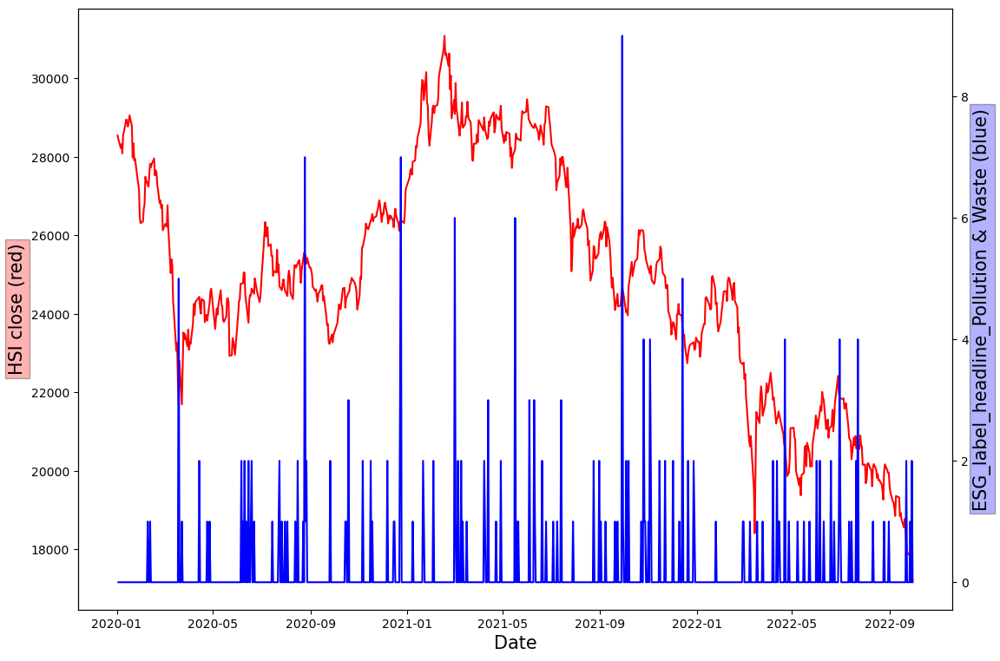

In [513]:
data_to_plot=develop_group["ESG_label_headline_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

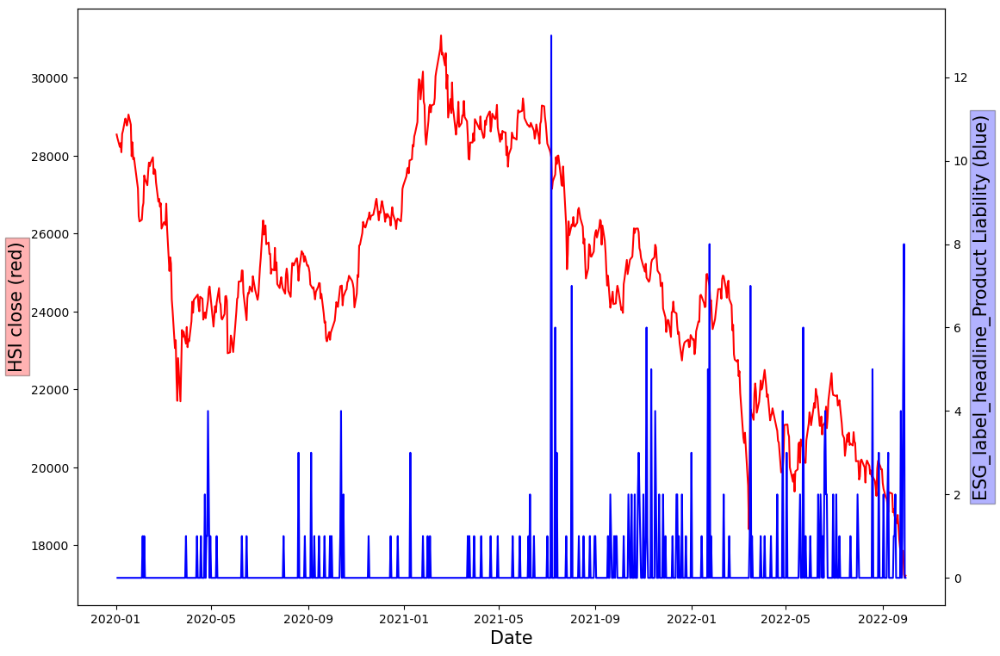

In [514]:
data_to_plot=develop_group["ESG_label_headline_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

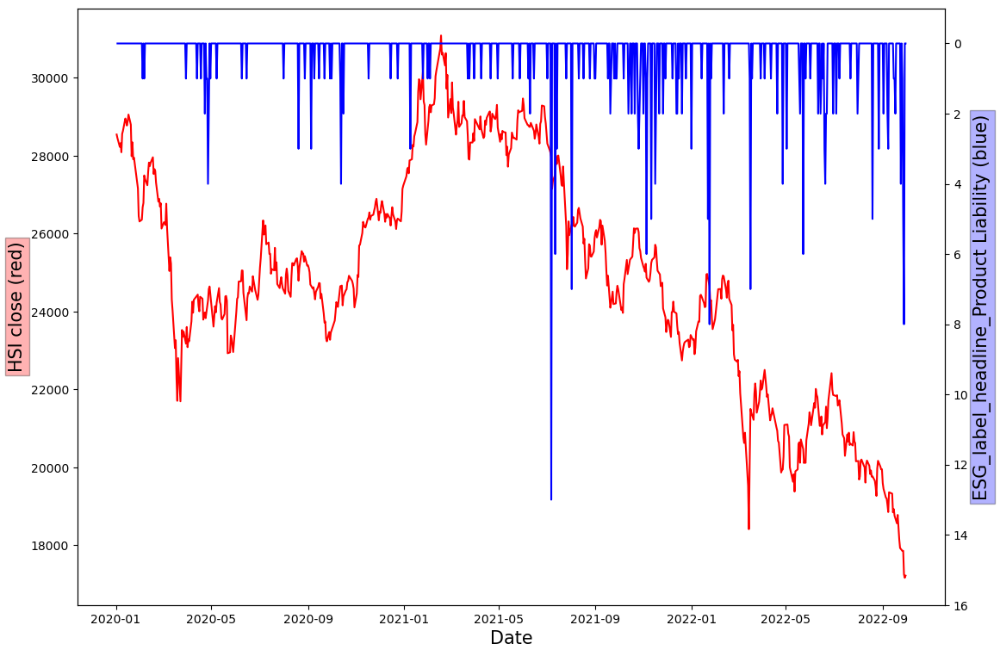

In [515]:
data_to_plot=develop_group["ESG_label_headline_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_headline_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

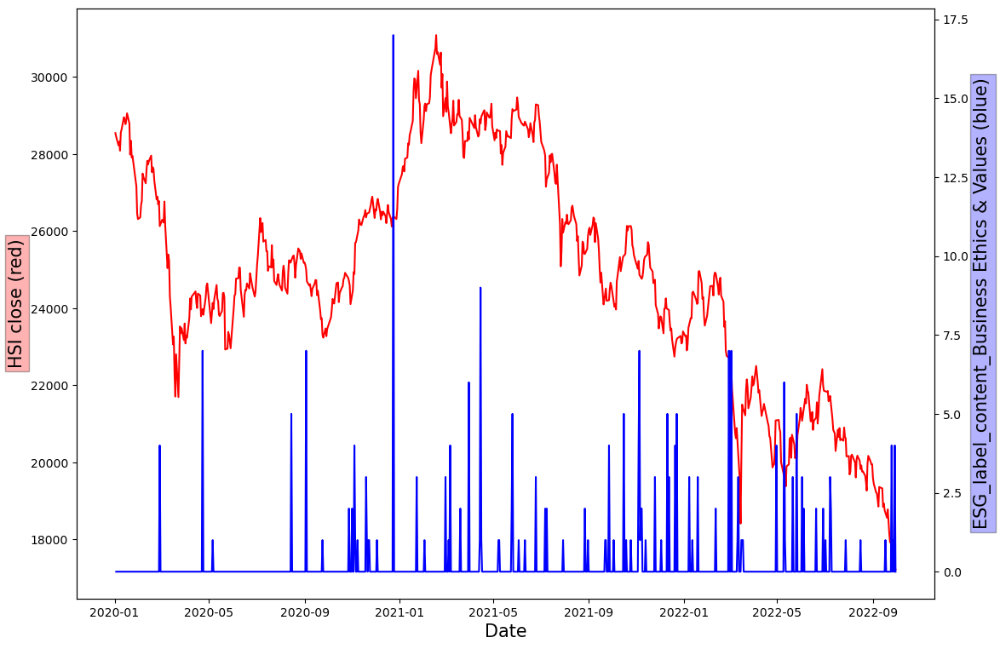

In [517]:
data_to_plot=develop_group["ESG_label_content_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

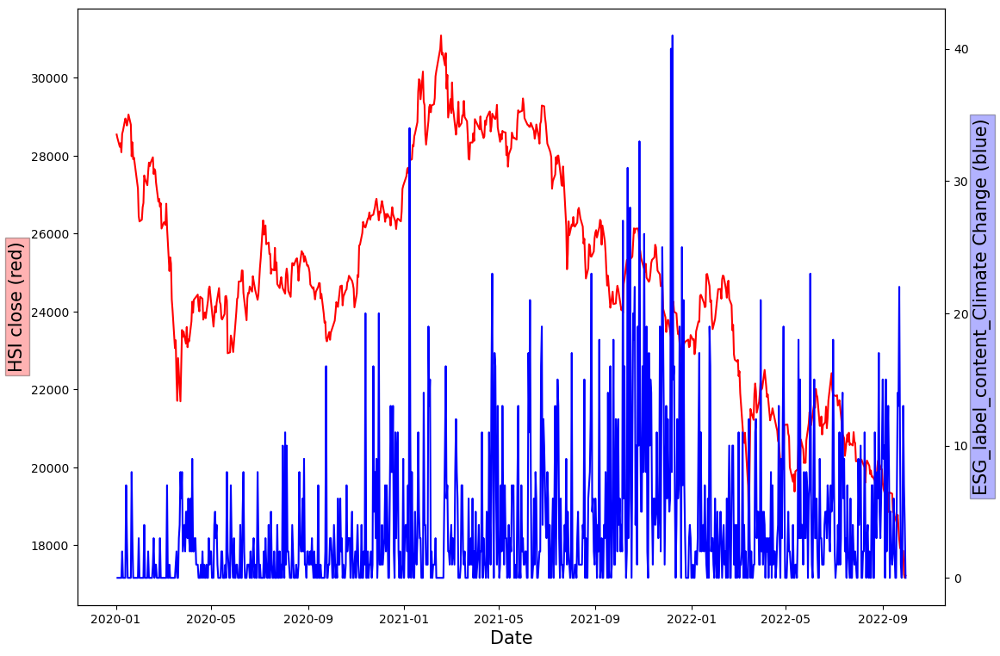

In [518]:
data_to_plot=develop_group["ESG_label_content_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

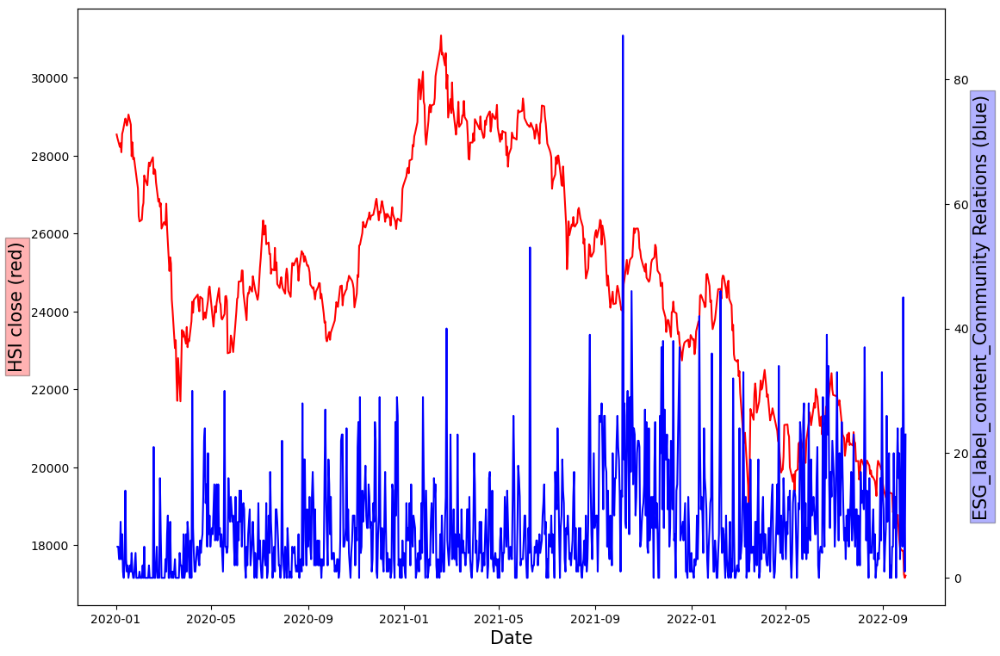

In [519]:
data_to_plot=develop_group["ESG_label_content_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

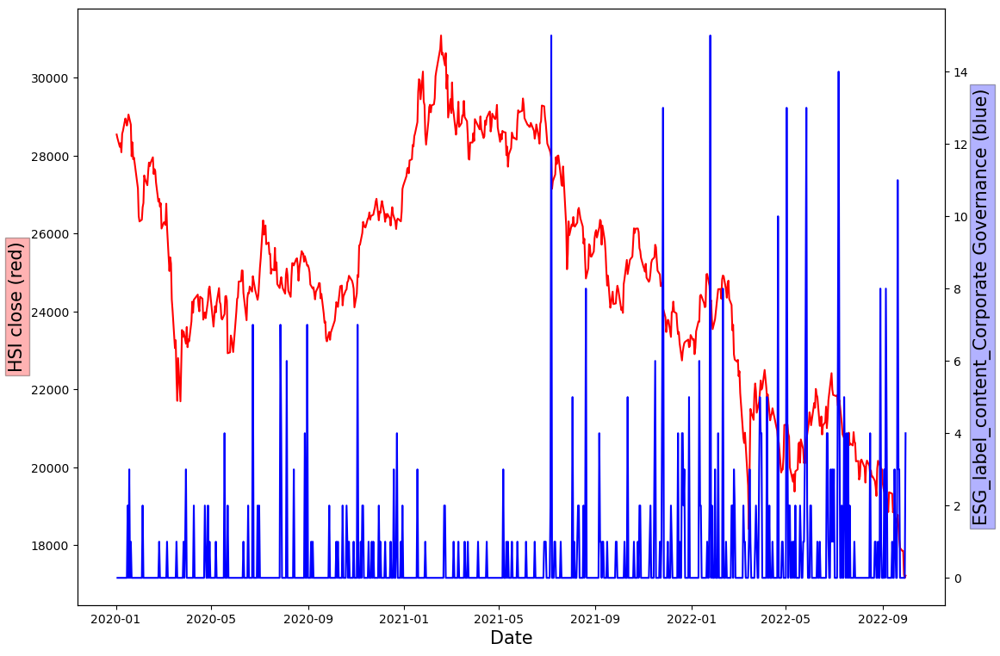

In [521]:
data_to_plot=develop_group["ESG_label_content_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

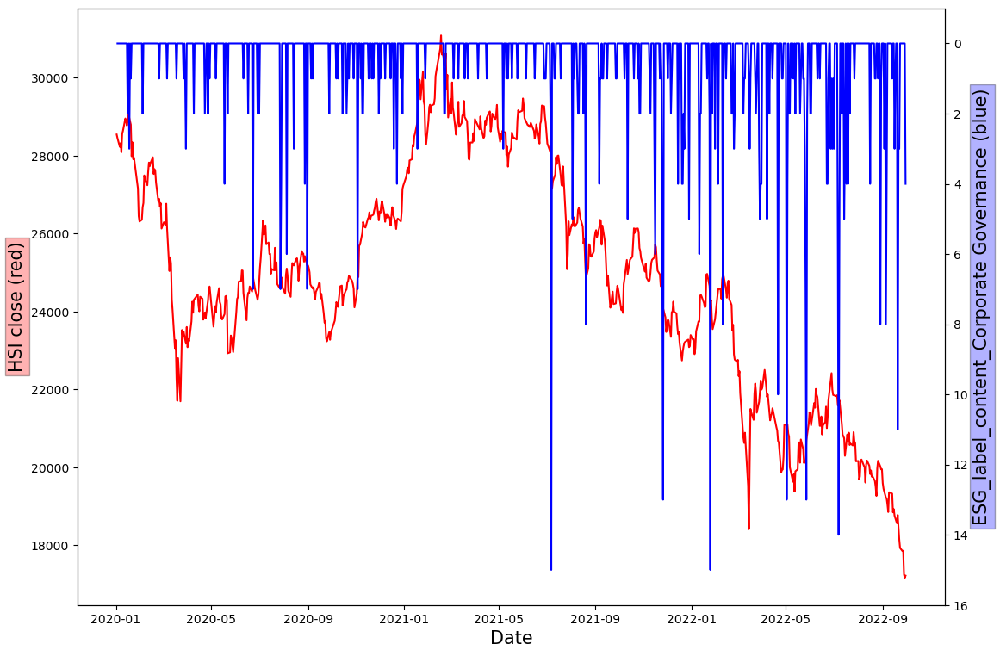

In [522]:
data_to_plot=develop_group["ESG_label_content_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

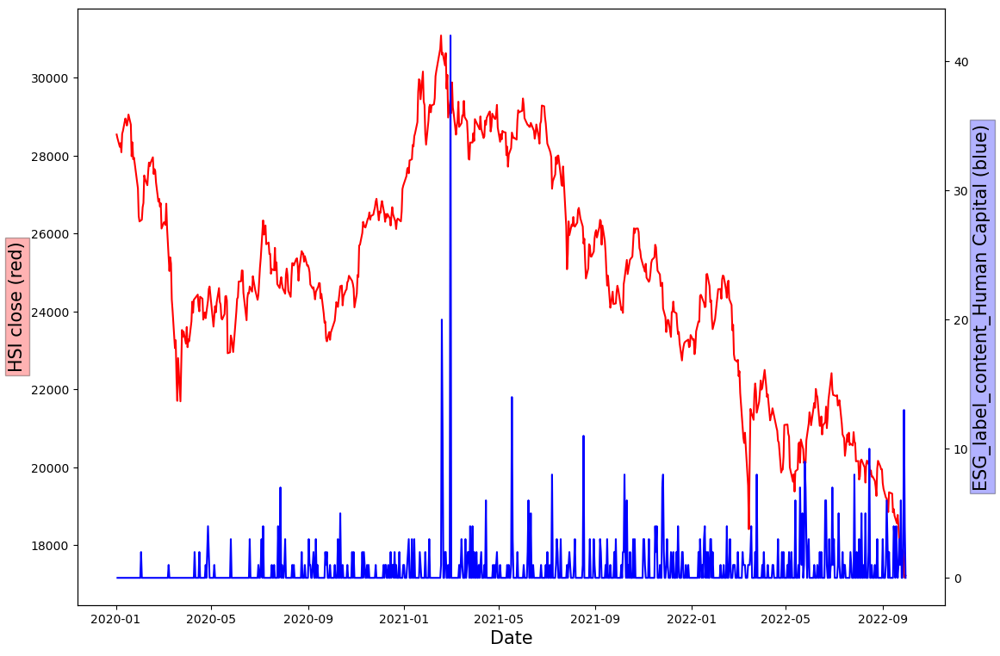

In [523]:
data_to_plot=develop_group["ESG_label_content_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

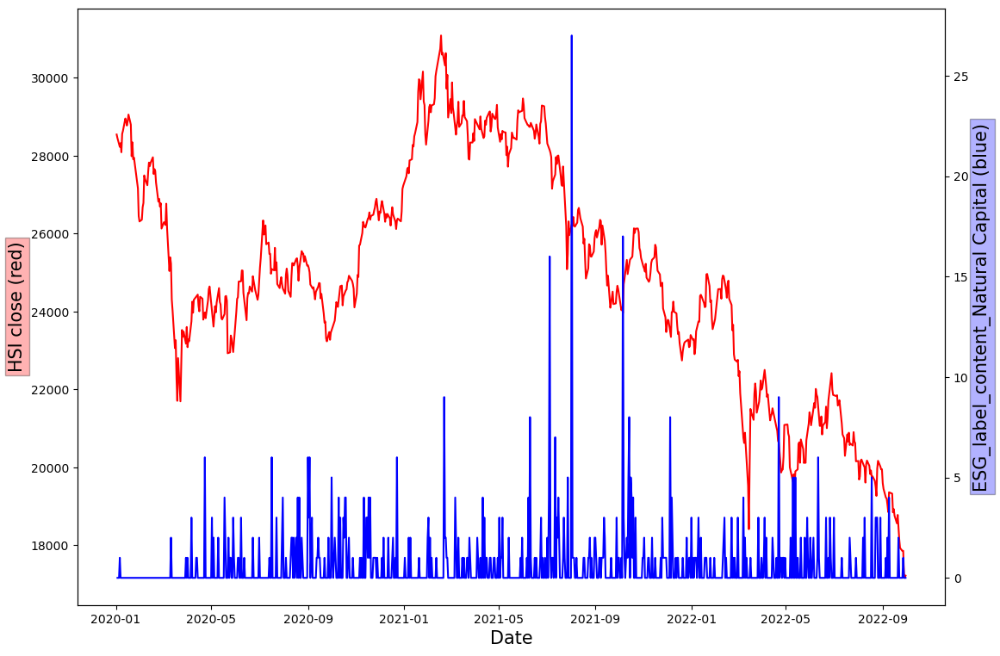

In [524]:
data_to_plot=develop_group["ESG_label_content_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

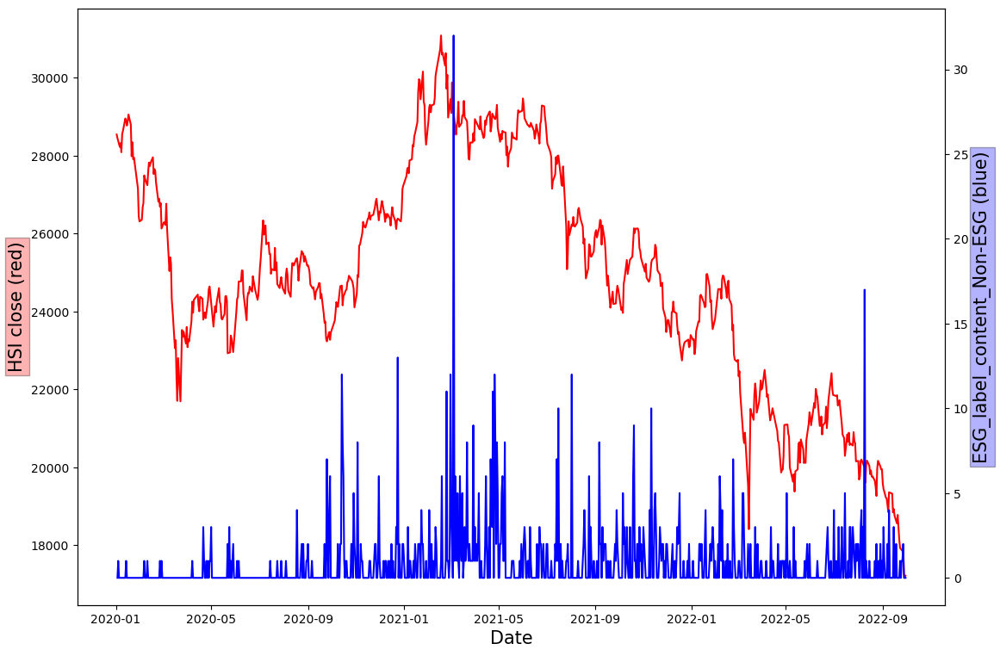

In [525]:
data_to_plot=develop_group["ESG_label_content_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

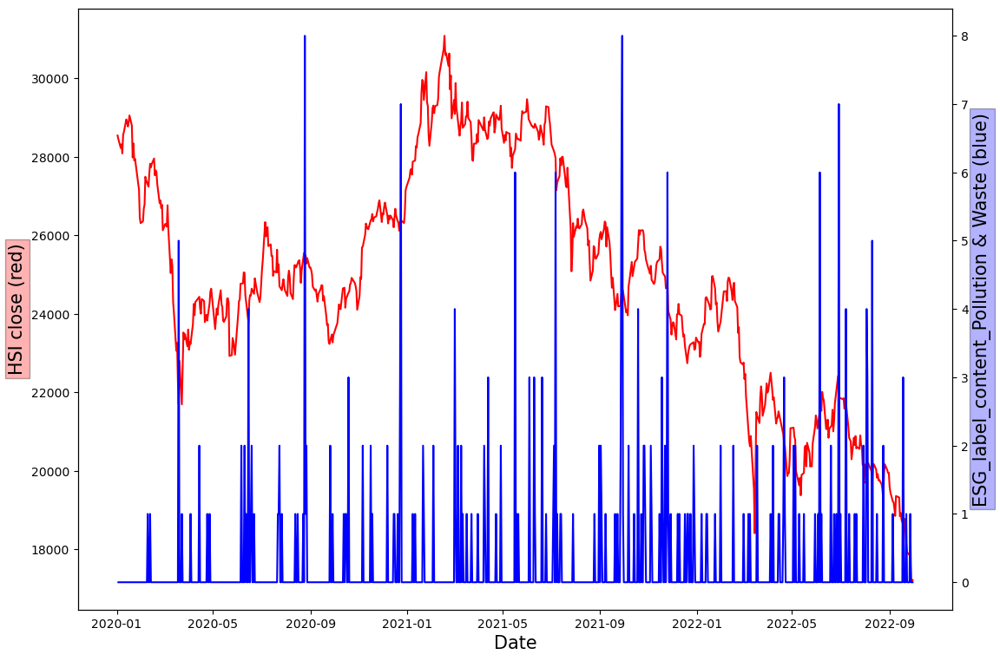

In [526]:
data_to_plot=develop_group["ESG_label_content_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

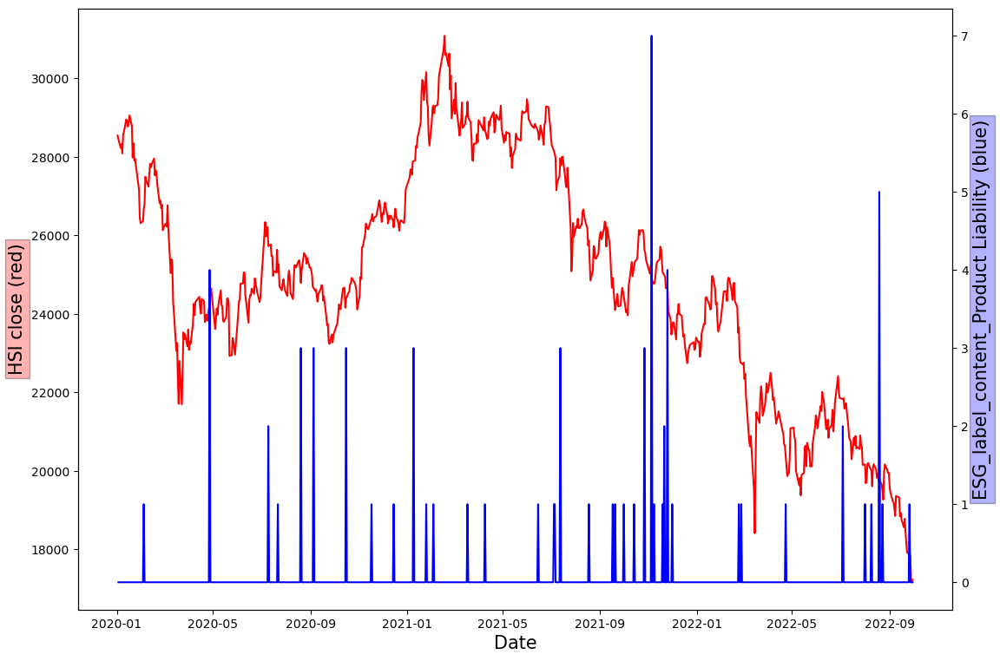

In [527]:
data_to_plot=develop_group["ESG_label_content_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_label_content_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

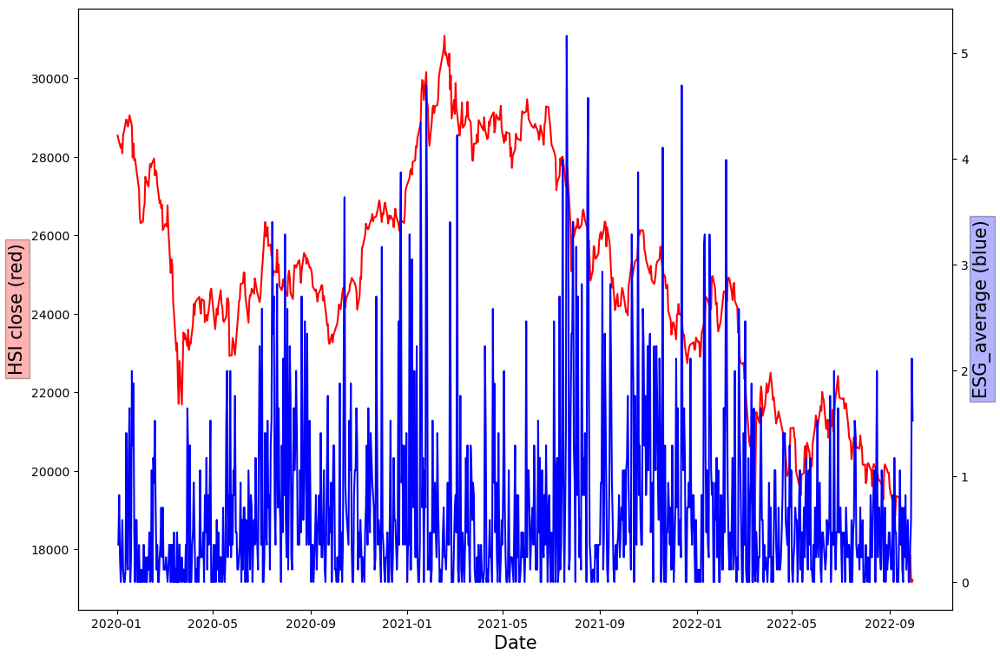

In [528]:
data_to_plot=develop_group["ESG_average"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_daily["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16,-1) 
plt.ylabel('ESG_average (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

<AxesSubplot:>

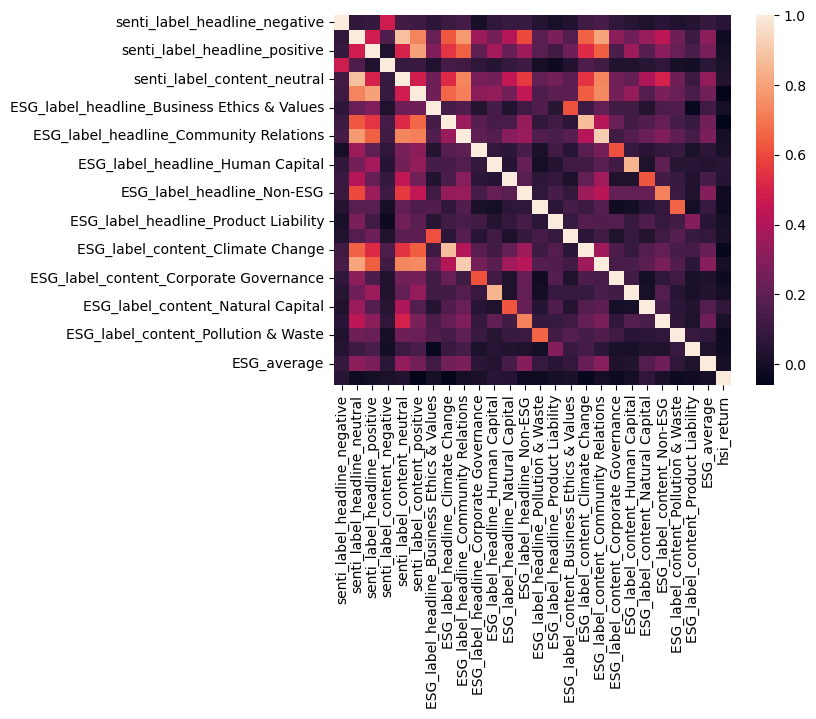

In [530]:
sns.heatmap(develop_group.corr())

In [532]:
hsi_daily

,Open,High,Low,Close,Adj Close,Volume,Daily_return
Date,,,,,,,
2020-01-02,28249.369141,28543.519531,28245.970703,28543.519531,28543.519531,1262732800,0.012550
2020-01-03,28828.359375,28883.300781,28428.169922,28451.500000,28451.500000,1797904800,-0.003224
2020-01-06,28326.500000,28367.869141,28054.289063,28226.189453,28226.189453,1793426600,-0.007919
2020-01-07,28352.679688,28473.080078,28264.070313,28322.060547,28322.060547,1302687200,0.003397
2020-01-08,27999.580078,28198.609375,27857.730469,28087.919922,28087.919922,1709241600,-0.008267
...,...,...,...,...,...,...,...
2022-09-26,17781.869141,18077.640625,17727.400391,17855.140625,17855.140625,2557096600,-0.004357
2022-09-27,17838.650391,17904.210938,17648.419922,17860.310547,17860.310547,1900500000,0.000290
2022-09-28,17703.390625,17703.390625,17184.539063,17250.880859,17250.880859,2948457300,-0.034122


In [533]:
develop_group=develop_group.apply(stats.zscore)
develop_group=develop_group.clip(lower=-2,upper=2)
develop_group['hsi_daily_return']=hsi_daily["Daily_return"];develop_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_return,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,-0.318600,-0.949466,-0.079209,-0.24849,-0.977138,-0.316683,-0.256918,-0.726731,-0.354697,-0.384254,...,-0.407551,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.419899,NaN,-0.003224
2020-01-04,-0.318600,-0.388520,-0.970979,-0.24849,-0.251974,-0.916753,-0.256918,-0.145578,-0.612238,-0.384254,...,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,-0.159134,0.156808,NaN,NaN
2020-01-05,-0.318600,-0.762484,-0.792625,-0.24849,-0.977138,-0.556711,-0.256918,-0.726731,-0.612238,-0.384254,...,-0.638396,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563801,NaN,NaN
2020-01-06,-0.318600,-0.762484,-0.614271,-0.24849,-0.856278,-0.556711,-0.256918,-0.726731,-0.741008,0.247967,...,-0.638396,-0.340669,-0.343555,0.215463,-0.447506,-0.319263,-0.159134,-0.852585,NaN,-0.007919
2020-01-07,-0.318600,-0.949466,0.634207,-0.24849,-0.977138,0.163372,-0.256918,-0.726731,0.160385,-0.384254,...,0.054140,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563569,NaN,0.003397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.701328,-0.295029,-0.792625,-0.24849,-0.251974,-0.556711,0.595505,-0.339296,-0.354697,-0.384254,...,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,2.000000,-0.852342,NaN,-0.004357
2022-09-27,-0.318600,2.000000,1.347623,-0.24849,2.000000,2.000000,-0.256918,2.000000,2.000000,-0.384254,...,2.000000,-0.340669,0.606079,0.215463,0.512668,0.815139,-0.159134,-0.419659,NaN,0.000290
2022-09-28,-0.318600,1.387810,0.812561,-0.24849,-0.131113,2.000000,-0.256918,0.823010,1.319319,-0.384254,...,0.746677,-0.340669,2.000000,-0.392688,-0.447506,-0.319263,-0.159134,-0.133765,NaN,-0.034122


In [534]:
develop_group=develop_group.drop(["hsi_return"],axis=1)
develop_group.fillna(value=0,inplace=True)

In [535]:
develop_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,-0.318600,-0.949466,-0.079209,-0.24849,-0.977138,-0.316683,-0.256918,-0.726731,-0.354697,-0.384254,...,-0.719711,-0.407551,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.419899,-0.003224
2020-01-04,-0.318600,-0.388520,-0.970979,-0.24849,-0.251974,-0.916753,-0.256918,-0.145578,-0.612238,-0.384254,...,-0.719711,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,-0.159134,0.156808,0.000000
2020-01-05,-0.318600,-0.762484,-0.792625,-0.24849,-0.977138,-0.556711,-0.256918,-0.726731,-0.612238,-0.384254,...,-0.719711,-0.638396,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563801,0.000000
2020-01-06,-0.318600,-0.762484,-0.614271,-0.24849,-0.856278,-0.556711,-0.256918,-0.726731,-0.741008,0.247967,...,-0.719711,-0.638396,-0.340669,-0.343555,0.215463,-0.447506,-0.319263,-0.159134,-0.852585,-0.007919
2020-01-07,-0.318600,-0.949466,0.634207,-0.24849,-0.977138,0.163372,-0.256918,-0.726731,0.160385,-0.384254,...,-0.719711,0.054140,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563569,0.003397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.701328,-0.295029,-0.792625,-0.24849,-0.251974,-0.556711,0.595505,-0.339296,-0.354697,-0.384254,...,-0.353552,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,2.000000,-0.852342,-0.004357
2022-09-27,-0.318600,2.000000,1.347623,-0.24849,2.000000,2.000000,-0.256918,2.000000,2.000000,-0.384254,...,1.660324,2.000000,-0.340669,0.606079,0.215463,0.512668,0.815139,-0.159134,-0.419659,0.000290
2022-09-28,-0.318600,1.387810,0.812561,-0.24849,-0.131113,2.000000,-0.256918,0.823010,1.319319,-0.384254,...,0.561846,0.746677,-0.340669,2.000000,-0.392688,-0.447506,-0.319263,-0.159134,-0.133765,-0.034122


In [536]:
name=[ a for a in develop_group.columns if a != "hsi_daily_return" ]
data_train=develop_group[:600]
data_test=develop_group[600:]
x_train=data_train[name]
y_train=data_train["hsi_daily_return"]
X_train_shift = x_train.values
Y_train_shift = y_train.values
x_test=data_test[name]
y_test=data_test["hsi_daily_return"]
X_test_shift = x_test.values
Y_test_shift = y_test.values

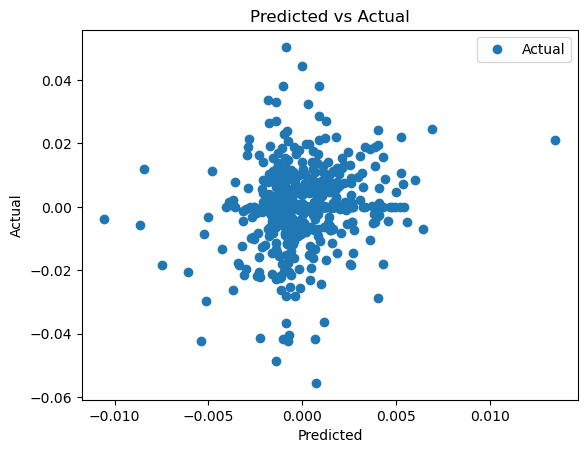

In [537]:
scaler = preprocessing.MinMaxScaler()
X_train_trans = scaler.fit_transform(X_train_shift)
# X_test_trans=scaler.fit_transform(X_test_shift)

from sklearn.linear_model import LinearRegression
clf = LinearRegression().fit(X_train_trans,Y_train_shift)
Y_train_pred = clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({'Actual': Y_train_shift, 'Predicted': Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [538]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.0073255326928455475
Mean Squared Error: 0.00013046595531122758
Root Mean Squared Error: 0.011422169466052743
R-square: 0.031416360188674


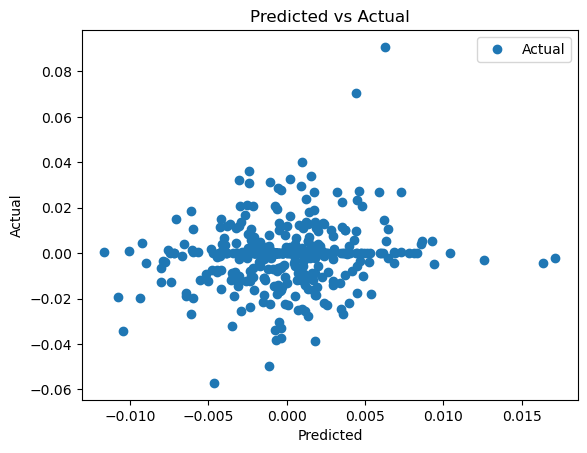

In [539]:
X_test_trans = scaler.transform(X_test_shift)
Y_test_pred = clf.predict(X_test_trans)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [540]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.00908225060062368
Mean Squared Error: 0.00018865689293374302
Root Mean Squared Error: 0.013735242732975017
R-square: 0.0030862518052504617


In [541]:
overall_keyword_develop=pd.concat([train_act_pred,test_act_pred],ignore_index=True)
overall_keyword_develop["Actual_accu_return"]=overall_keyword_develop["Actual"]+1
overall_keyword_develop["Predicted_accu_return"]=overall_keyword_develop["Predicted"]+1
overall_keyword_develop["Actual_accu_return"]=overall_keyword_develop['Actual_accu_return'].cumprod()
overall_keyword_develop["Predicted_accu_return"]=overall_keyword_develop['Predicted_accu_return'].cumprod();overall_keyword_develop


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,-0.001220,0.996776,0.998780
1,0.000000,-0.001702,0.996776,0.997080
2,0.000000,-0.001297,0.996776,0.995787
3,-0.007919,0.000180,0.988883,0.995966
4,0.003397,-0.001478,0.992241,0.994493
...,...,...,...,...
997,-0.004357,0.000469,0.625541,0.870542
998,0.000290,-0.005638,0.625722,0.865634
999,-0.034122,-0.010418,0.604371,0.856616
1000,-0.004928,0.009429,0.601393,0.864693


<AxesSubplot:>

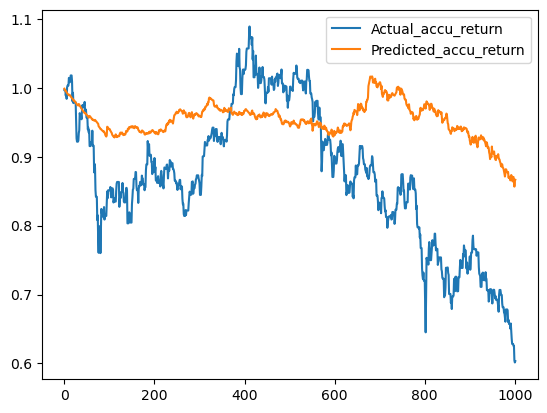

In [542]:
overall_keyword_develop.iloc[:,2:].plot()

In [543]:
overall_keyword_develop.iloc[:,2:].corr()

,Actual_accu_return,Predicted_accu_return
Actual_accu_return,1.000000,0.452036
Predicted_accu_return,0.452036,1.000000


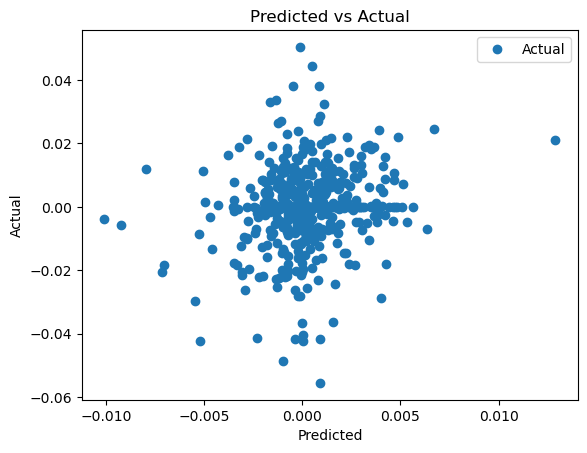

In [544]:
from sklearn.linear_model import Lasso
clf=Lasso(alpha=0.000000012, fit_intercept=False)
clf.fit(X_train_trans, Y_train_shift)
Y_train_pred=clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({"Actual": Y_train_shift, "Predicted": Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [545]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.007259469483050248
Mean Squared Error: 0.0001307036457970931
Root Mean Squared Error: 0.011432569518576876
R-square: 0.029651738028057872


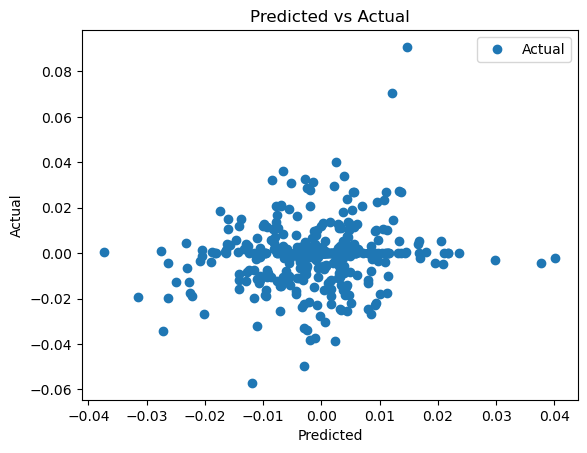

In [546]:
Y_test_pred = clf.predict(X_test_shift)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [547]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.0110778581308492
Mean Squared Error: 0.00024152384947505648
Root Mean Squared Error: 0.015541037593257938
R-square: -0.27627696138918867


In [548]:
overall_keyword_develop_lasso=pd.concat([train_act_pred,test_act_pred],ignore_index=True)
overall_keyword_develop_lasso["Actual_accu_return"]=overall_keyword_develop_lasso["Actual"]+1
overall_keyword_develop_lasso["Predicted_accu_return"]=overall_keyword_develop_lasso["Predicted"]+1
overall_keyword_develop_lasso["Actual_accu_return"]=overall_keyword_develop_lasso['Actual_accu_return'].cumprod()
overall_keyword_develop_lasso["Predicted_accu_return"]=overall_keyword_develop_lasso['Predicted_accu_return'].cumprod();overall_keyword_develop_lasso


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,-0.000661,0.996776,0.999339
1,0.000000,-0.001142,0.996776,0.998198
2,0.000000,-0.000602,0.996776,0.997597
3,-0.007919,0.000819,0.988883,0.998414
4,0.003397,-0.001049,0.992241,0.997367
...,...,...,...,...
997,-0.004357,0.001975,0.625541,0.705525
998,0.000290,-0.018770,0.625722,0.692282
999,-0.034122,-0.027231,0.604371,0.673431
1000,-0.004928,0.020950,0.601393,0.687539


<AxesSubplot:>

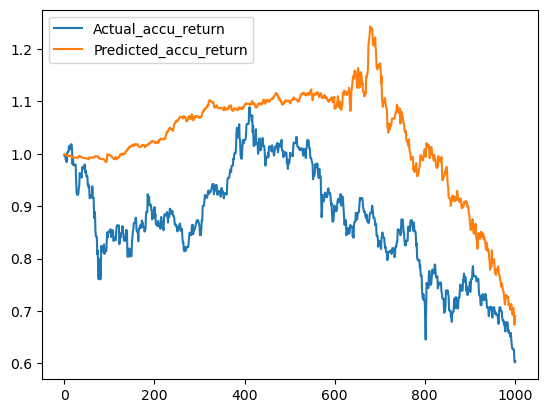

In [551]:
overall_keyword_develop_lasso.iloc[:,2:].plot()

In [552]:
overall_keyword_develop_lasso.iloc[:,2:].corr()

,Actual_accu_return,Predicted_accu_return
Actual_accu_return,1.000000,0.726922
Predicted_accu_return,0.726922,1.000000


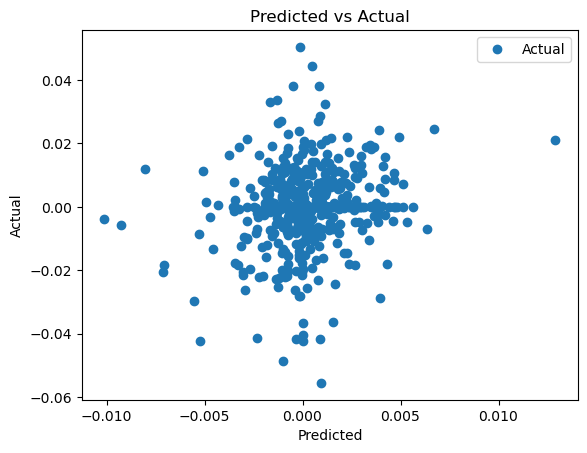

In [559]:
from sklearn.linear_model import Ridge
clf=Ridge(alpha=0.0002, fit_intercept=False)
clf.fit(X_train_trans, Y_train_shift)
Y_train_pred=clf.predict(X_train_trans)
train_act_pred=pd.DataFrame({"Actual": Y_train_shift, "Predicted": Y_train_pred})
train_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [560]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_train_shift,Y_train_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_train_shift,Y_train_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_train_shift,Y_train_pred)))     
print('R-square:', metrics.r2_score(Y_train_shift,Y_train_pred))

Mean Absolute Error: 0.0072593624419862775
Mean Squared Error: 0.0001307035132386528
Root Mean Squared Error: 0.011432563721171766
R-square: 0.029652722146376598


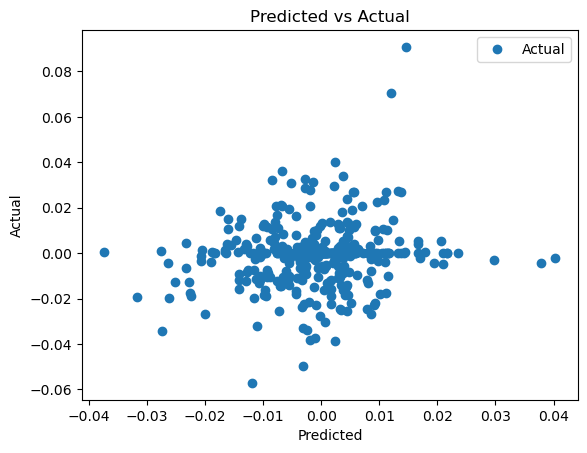

In [561]:
Y_test_pred = clf.predict(X_test_shift)
test_act_pred=pd.DataFrame({'Actual': Y_test_shift, 'Predicted': Y_test_pred})
test_act_pred.plot(x='Predicted',y='Actual',style='o')
plt.title('Predicted vs Actual')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [562]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test_shift,Y_test_pred))
print('Mean Squared Error:', metrics.mean_squared_error(Y_test_shift,Y_test_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test_shift,Y_test_pred)))     
print('R-square:', metrics.r2_score(Y_test_shift,Y_test_pred))

Mean Absolute Error: 0.011080424809973361
Mean Squared Error: 0.00024164017395118229
Root Mean Squared Error: 0.015544779636623424
R-square: -0.27689165119828085


In [563]:
overall_keyword_develop_ridge=pd.concat([train_act_pred,test_act_pred],ignore_index=True)
overall_keyword_develop_ridge["Actual_accu_return"]=overall_keyword_develop_ridge["Actual"]+1
overall_keyword_develop_ridge["Predicted_accu_return"]=overall_keyword_develop_ridge["Predicted"]+1
overall_keyword_develop_ridge["Actual_accu_return"]=overall_keyword_develop_ridge['Actual_accu_return'].cumprod()
overall_keyword_develop_ridge["Predicted_accu_return"]=overall_keyword_develop_ridge['Predicted_accu_return'].cumprod();overall_keyword_develop_ridge


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
0,-0.003224,-0.000663,0.996776,0.999337
1,0.000000,-0.001143,0.996776,0.998195
2,0.000000,-0.000600,0.996776,0.997596
3,-0.007919,0.000821,0.988883,0.998416
4,0.003397,-0.001052,0.992241,0.997366
...,...,...,...,...
997,-0.004357,0.001967,0.625541,0.703781
998,0.000290,-0.018731,0.625722,0.690598
999,-0.034122,-0.027347,0.604371,0.671713
1000,-0.004928,0.020901,0.601393,0.685752


<AxesSubplot:>

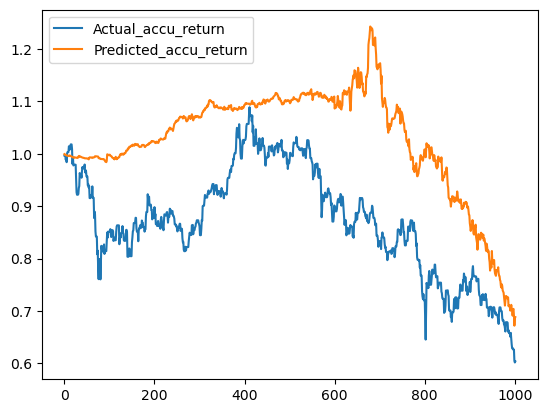

In [564]:
overall_keyword_develop_ridge.iloc[:,2:].plot()

In [565]:
overall_keyword_develop_ridge.iloc[:,2:].corr()

,Actual_accu_return,Predicted_accu_return
Actual_accu_return,1.000000,0.727909
Predicted_accu_return,0.727909,1.000000


In [566]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
poly = PolynomialFeatures(degree=2, include_bias=False)
X,y=develop_group[name],develop_group["hsi_daily_return"]
poly_features = poly.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=42)
poly_reg_model = LinearRegression()
poly_reg_model.fit(X_train, y_train)

LinearRegression()

In [568]:
poly_reg_y_predicted = poly_reg_model.predict(X_test)
poly_reg_train_predicted = poly_reg_model.predict(X_train)
from sklearn.metrics import mean_squared_error
poly_reg_rmse_test = np.sqrt(mean_squared_error(y_test, poly_reg_y_predicted))
poly_reg_rmse_train = np.sqrt(mean_squared_error(y_train, poly_reg_train_predicted))
print(poly_reg_rmse_train,poly_reg_rmse_test)

0.0076723573279287895 0.0674613386764661


In [570]:
test_act_pred=pd.DataFrame({'Actual': y_test, 'Predicted': poly_reg_y_predicted})
train_act_pred=pd.DataFrame({"Actual": y_train, "Predicted": poly_reg_train_predicted})
overall_keyword_develop_poly2=pd.concat([train_act_pred,test_act_pred])
overall_keyword_develop_poly2=overall_keyword_develop_poly2.sort_index()

overall_keyword_develop_poly2["Actual_accu_return"]=overall_keyword_develop_poly2["Actual"]+1
overall_keyword_develop_poly2["Predicted_accu_return"]=overall_keyword_develop_poly2["Predicted"]+1
overall_keyword_develop_poly2["Actual_accu_return"]=overall_keyword_develop_poly2['Actual_accu_return'].cumprod()
overall_keyword_develop_poly2["Predicted_accu_return"]=overall_keyword_develop_poly2['Predicted_accu_return'].cumprod();overall_keyword_develop_poly2


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
Date,,,,
2020-01-03,-0.003224,-0.002298,0.996776,0.997702
2020-01-04,0.000000,0.006738,0.996776,1.004424
2020-01-05,0.000000,-0.001715,0.996776,1.002702
2020-01-06,-0.007919,-0.001346,0.988883,1.001352
2020-01-07,0.003397,-0.003625,0.992241,0.997722
...,...,...,...,...
2022-09-26,-0.004357,0.018427,0.625541,1.873000
2022-09-27,0.000290,0.001383,0.625722,1.875591
2022-09-28,-0.034122,-0.032869,0.604371,1.813942


<AxesSubplot:xlabel='Date'>

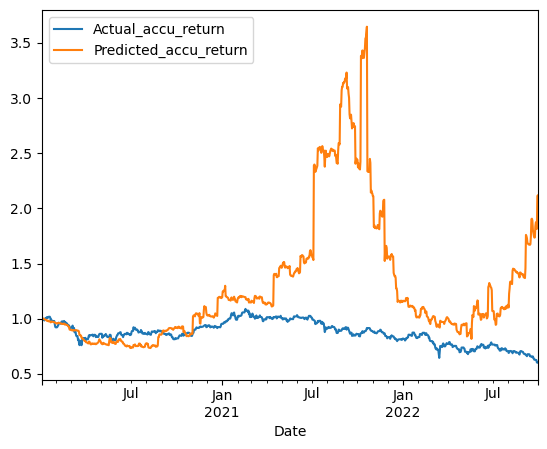

In [571]:
overall_keyword_develop_poly2.iloc[:,2:].plot()

In [572]:
poly = PolynomialFeatures(degree=3, include_bias=False)
X,y=develop_group[name],develop_group["hsi_daily_return"]
poly_features = poly.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=42)
poly_reg_model = LinearRegression()
poly_reg_model.fit(X_train, y_train)

LinearRegression()

In [573]:
poly_reg_y_predicted = poly_reg_model.predict(X_test)
poly_reg_train_predicted = poly_reg_model.predict(X_train)
from sklearn.metrics import mean_squared_error
poly_reg_rmse_test = np.sqrt(mean_squared_error(y_test, poly_reg_y_predicted))
poly_reg_rmse_train = np.sqrt(mean_squared_error(y_train, poly_reg_train_predicted))
print(poly_reg_rmse_train,poly_reg_rmse_test)

0.0025910535455529946 240079305.2558465


In [574]:
test_act_pred=pd.DataFrame({'Actual': y_test, 'Predicted': poly_reg_y_predicted})
train_act_pred=pd.DataFrame({"Actual": y_train, "Predicted": poly_reg_train_predicted})
overall_keyword_develop_poly3=pd.concat([train_act_pred,test_act_pred])
overall_keyword_develop_poly3=overall_keyword_develop_poly3.sort_index()

overall_keyword_develop_poly3["Actual_accu_return"]=overall_keyword_develop_poly3["Actual"]+1
overall_keyword_develop_poly3["Predicted_accu_return"]=overall_keyword_develop_poly3["Predicted"]+1
overall_keyword_develop_poly3["Actual_accu_return"]=overall_keyword_develop_poly3['Actual_accu_return'].cumprod()
overall_keyword_develop_poly3["Predicted_accu_return"]=overall_keyword_develop_poly3['Predicted_accu_return'].cumprod();overall_keyword_develop_poly3


,Actual,Predicted,Actual_accu_return,Predicted_accu_return
Date,,,,
2020-01-03,-0.003224,-6.241575e-04,0.996776,9.993758e-01
2020-01-04,0.000000,6.556511e-06,0.996776,9.993824e-01
2020-01-05,0.000000,-5.932957e+05,0.996776,-5.929283e+05
2020-01-06,-0.007919,-9.308397e+06,0.988883,5.519212e+12
2020-01-07,0.003397,3.557511e-03,0.992241,5.538846e+12
...,...,...,...,...
2022-09-26,-0.004357,1.893287e+08,0.625541,-inf
2022-09-27,0.000290,2.938434e-04,0.625722,-inf
2022-09-28,-0.034122,-3.411616e-02,0.604371,-inf


In [575]:
develop_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_daily_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,-0.318600,-0.949466,-0.079209,-0.24849,-0.977138,-0.316683,-0.256918,-0.726731,-0.354697,-0.384254,...,-0.719711,-0.407551,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.419899,-0.003224
2020-01-04,-0.318600,-0.388520,-0.970979,-0.24849,-0.251974,-0.916753,-0.256918,-0.145578,-0.612238,-0.384254,...,-0.719711,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,-0.159134,0.156808,0.000000
2020-01-05,-0.318600,-0.762484,-0.792625,-0.24849,-0.977138,-0.556711,-0.256918,-0.726731,-0.612238,-0.384254,...,-0.719711,-0.638396,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563801,0.000000
2020-01-06,-0.318600,-0.762484,-0.614271,-0.24849,-0.856278,-0.556711,-0.256918,-0.726731,-0.741008,0.247967,...,-0.719711,-0.638396,-0.340669,-0.343555,0.215463,-0.447506,-0.319263,-0.159134,-0.852585,-0.007919
2020-01-07,-0.318600,-0.949466,0.634207,-0.24849,-0.977138,0.163372,-0.256918,-0.726731,0.160385,-0.384254,...,-0.719711,0.054140,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563569,0.003397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.701328,-0.295029,-0.792625,-0.24849,-0.251974,-0.556711,0.595505,-0.339296,-0.354697,-0.384254,...,-0.353552,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,2.000000,-0.852342,-0.004357
2022-09-27,-0.318600,2.000000,1.347623,-0.24849,2.000000,2.000000,-0.256918,2.000000,2.000000,-0.384254,...,1.660324,2.000000,-0.340669,0.606079,0.215463,0.512668,0.815139,-0.159134,-0.419659,0.000290
2022-09-28,-0.318600,1.387810,0.812561,-0.24849,-0.131113,2.000000,-0.256918,0.823010,1.319319,-0.384254,...,0.561846,0.746677,-0.340669,2.000000,-0.392688,-0.447506,-0.319263,-0.159134,-0.133765,-0.034122


In [577]:
develop_group["Positive_or_negative_return"]=np.where(develop_group["hsi_daily_return"]>=0,1,0);develop_group

,senti_label_headline_negative,senti_label_headline_neutral,senti_label_headline_positive,senti_label_content_negative,senti_label_content_neutral,senti_label_content_positive,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_daily_return,Positive_or_negative_return
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-03,-0.318600,-0.949466,-0.079209,-0.24849,-0.977138,-0.316683,-0.256918,-0.726731,-0.354697,-0.384254,...,-0.407551,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.419899,-0.003224,0
2020-01-04,-0.318600,-0.388520,-0.970979,-0.24849,-0.251974,-0.916753,-0.256918,-0.145578,-0.612238,-0.384254,...,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,-0.159134,0.156808,0.000000,1
2020-01-05,-0.318600,-0.762484,-0.792625,-0.24849,-0.977138,-0.556711,-0.256918,-0.726731,-0.612238,-0.384254,...,-0.638396,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563801,0.000000,1
2020-01-06,-0.318600,-0.762484,-0.614271,-0.24849,-0.856278,-0.556711,-0.256918,-0.726731,-0.741008,0.247967,...,-0.638396,-0.340669,-0.343555,0.215463,-0.447506,-0.319263,-0.159134,-0.852585,-0.007919,0
2020-01-07,-0.318600,-0.949466,0.634207,-0.24849,-0.977138,0.163372,-0.256918,-0.726731,0.160385,-0.384254,...,0.054140,-0.340669,-0.343555,-0.392688,-0.447506,-0.319263,-0.159134,-0.563569,0.003397,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.701328,-0.295029,-0.792625,-0.24849,-0.251974,-0.556711,0.595505,-0.339296,-0.354697,-0.384254,...,-0.407551,-0.340669,-0.343555,-0.392688,0.032581,-0.319263,2.000000,-0.852342,-0.004357,0
2022-09-27,-0.318600,2.000000,1.347623,-0.24849,2.000000,2.000000,-0.256918,2.000000,2.000000,-0.384254,...,2.000000,-0.340669,0.606079,0.215463,0.512668,0.815139,-0.159134,-0.419659,0.000290,1
2022-09-28,-0.318600,1.387810,0.812561,-0.24849,-0.131113,2.000000,-0.256918,0.823010,1.319319,-0.384254,...,0.746677,-0.340669,2.000000,-0.392688,-0.447506,-0.319263,-0.159134,-0.133765,-0.034122,0


In [578]:
len(develop_group[develop_group["Positive_or_negative_return"]==1])

663

In [579]:
len(develop_group[develop_group["Positive_or_negative_return"]==0])

339

In [580]:
name

['senti_label_headline_negative',
 'senti_label_headline_neutral',
 'senti_label_headline_positive',
 'senti_label_content_negative',
 'senti_label_content_neutral',
 'senti_label_content_positive',
 'ESG_label_headline_Business Ethics & Values',
 'ESG_label_headline_Climate Change',
 'ESG_label_headline_Community Relations',
 'ESG_label_headline_Corporate Governance',
 'ESG_label_headline_Human Capital',
 'ESG_label_headline_Natural Capital',
 'ESG_label_headline_Non-ESG',
 'ESG_label_headline_Pollution & Waste',
 'ESG_label_headline_Product Liability',
 'ESG_label_content_Business Ethics & Values',
 'ESG_label_content_Climate Change',
 'ESG_label_content_Community Relations',
 'ESG_label_content_Corporate Governance',
 'ESG_label_content_Human Capital',
 'ESG_label_content_Natural Capital',
 'ESG_label_content_Non-ESG',
 'ESG_label_content_Pollution & Waste',
 'ESG_label_content_Product Liability',
 'ESG_average']

In [582]:
x_train=develop_group[name][:700]
y_train=develop_group["Positive_or_negative_return"][:700]
x_test=develop_group[name][700:]
y_test=develop_group["Positive_or_negative_return"][700:]
X_train_shift = x_train.values
Y_train_shift = y_train.values
X_test_shift = x_test.values
Y_test_shift = y_test.values
from sklearn import preprocessing, metrics
scaler = preprocessing.MinMaxScaler()
X_train_trans = scaler.fit_transform(X_train_shift)
X_test_trans = scaler.transform(X_test_shift)

Random Forest Accuracy: 0.921
--------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.86      0.89       110
           1       0.92      0.95      0.94       192

    accuracy                           0.92       302
   macro avg       0.92      0.91      0.91       302
weighted avg       0.92      0.92      0.92       302



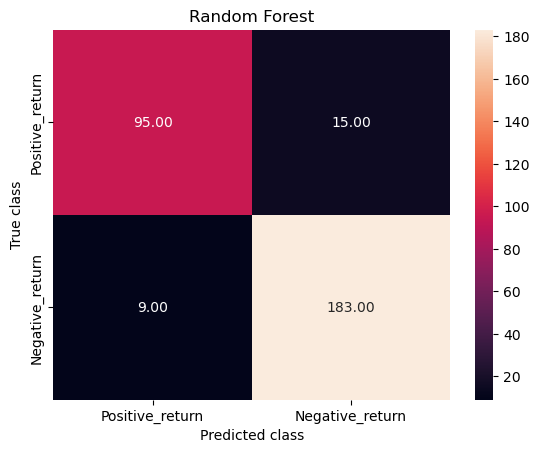

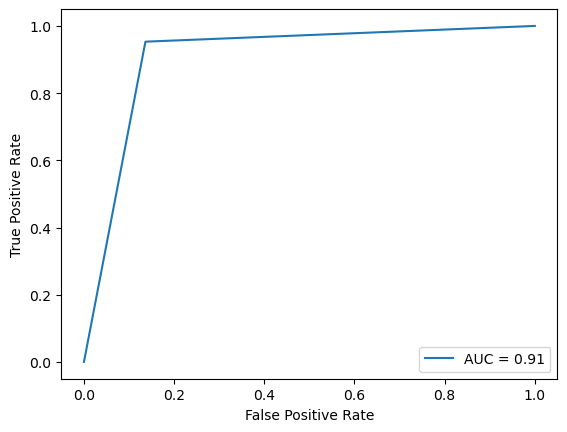

In [602]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
clf = RandomForestClassifier(max_depth=28,n_estimators=15000,random_state=42,max_features=None)
clf.fit(X_train_trans, Y_train_shift)
# Predict!
Y_pred = clf.predict(X_test_trans)
print('Random Forest Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))
clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Random Forest')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Gradient Boosting Accuracy: 0.970
--------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       110
           1       0.98      0.97      0.98       192

    accuracy                           0.97       302
   macro avg       0.97      0.97      0.97       302
weighted avg       0.97      0.97      0.97       302



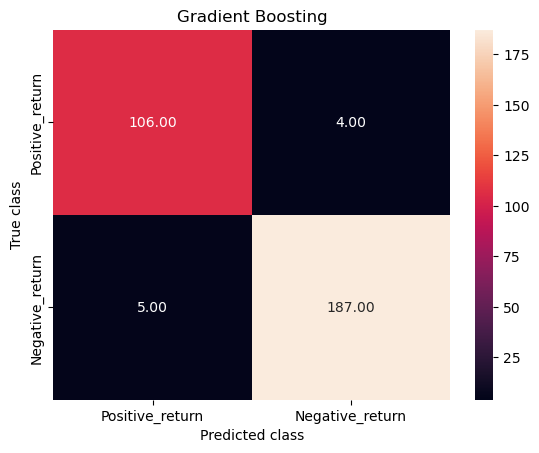

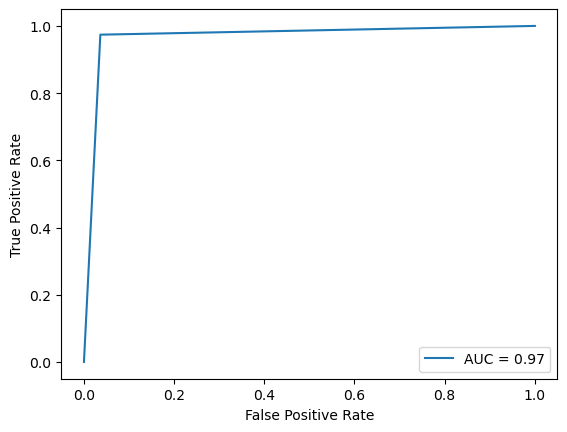

In [610]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier(learning_rate=0.00125,n_estimators=17500,max_depth=15,max_features=None)
clf.fit(X_train_trans, Y_train_shift)

Y_pred = clf.predict(X_test_trans)
print('Gradient Boosting Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Gradient Boosting')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

AdaBoosting Accuracy: 0.904
--------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.81      0.86       110
           1       0.90      0.96      0.93       192

    accuracy                           0.90       302
   macro avg       0.91      0.88      0.89       302
weighted avg       0.90      0.90      0.90       302



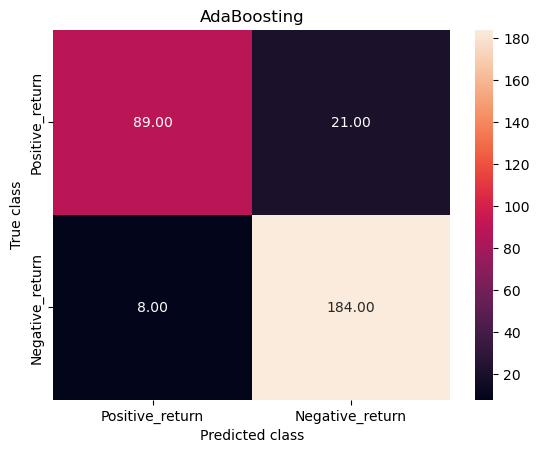

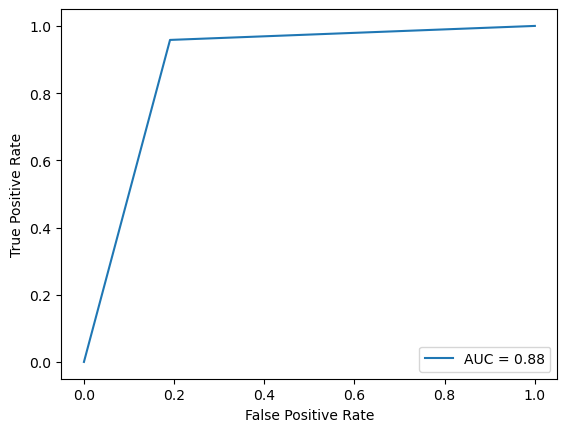

In [621]:
from sklearn.ensemble import AdaBoostClassifier

adab = AdaBoostClassifier(n_estimators=1500,random_state=42, learning_rate=0.18775)
adab.fit(X_train_trans, Y_train_shift)

# Predict!
Y_pred = adab.predict(X_test_trans)
print('AdaBoosting Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('AdaBoosting')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Support Vector Classification Accuracy: 0.646
--------------------------------------
              precision    recall  f1-score   support

           0       0.80      0.04      0.07       110
           1       0.64      0.99      0.78       192

    accuracy                           0.65       302
   macro avg       0.72      0.52      0.43       302
weighted avg       0.70      0.65      0.52       302



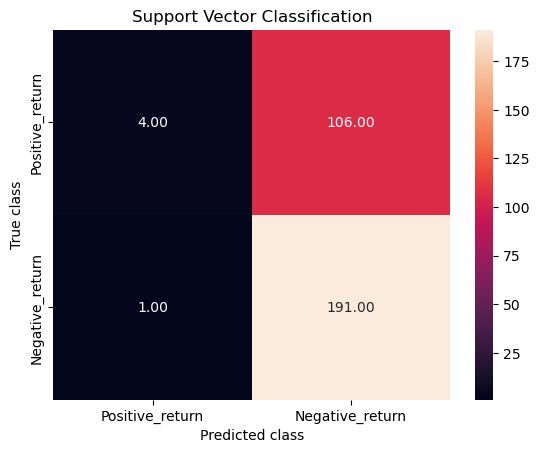

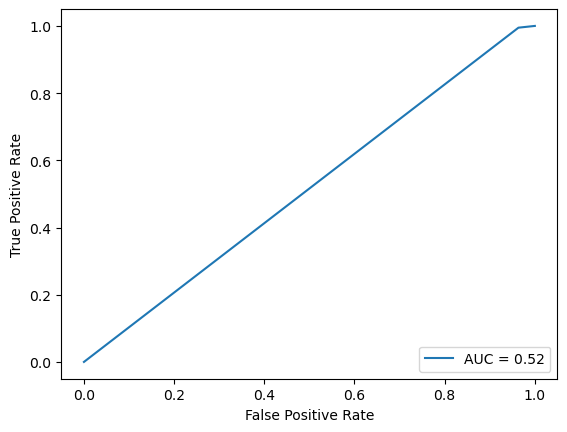

In [632]:
from sklearn.svm import SVC

svc = SVC(kernel='poly',random_state=42,degree=6,C=0.00015).fit(X_train_trans, Y_train_shift)


# Predict!
Y_pred = svc.predict(X_test_trans)
print('Support Vector Classification Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Support Vector Classification')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()


Bagging Classification Accuracy: 0.921
--------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.86      0.89       110
           1       0.92      0.95      0.94       192

    accuracy                           0.92       302
   macro avg       0.92      0.91      0.91       302
weighted avg       0.92      0.92      0.92       302



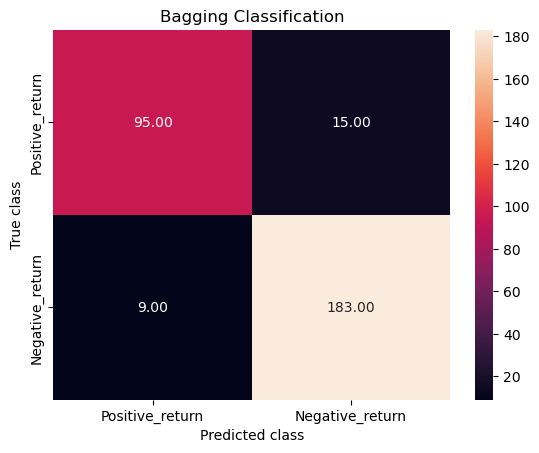

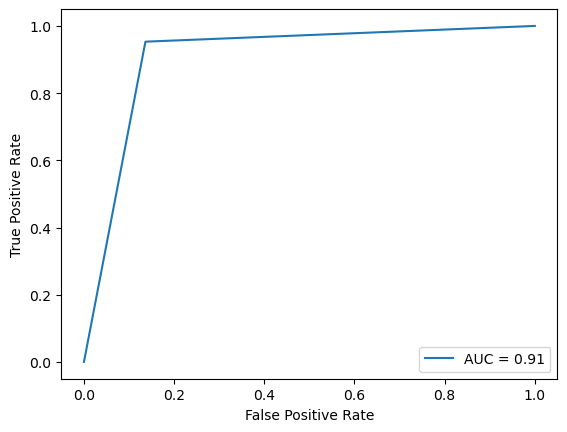

In [638]:
from sklearn.ensemble import BaggingClassifier
bg = BaggingClassifier(n_estimators=7500,random_state=42).fit(X_train_trans, Y_train_shift)
Y_pred = bg.predict(X_test_trans)
print('Bagging Classification Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Bagging Classification')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

KNN Accuracy: 0.639
--------------------------------------
              precision    recall  f1-score   support

           0       0.52      0.10      0.17       110
           1       0.65      0.95      0.77       192

    accuracy                           0.64       302
   macro avg       0.59      0.52      0.47       302
weighted avg       0.60      0.64      0.55       302



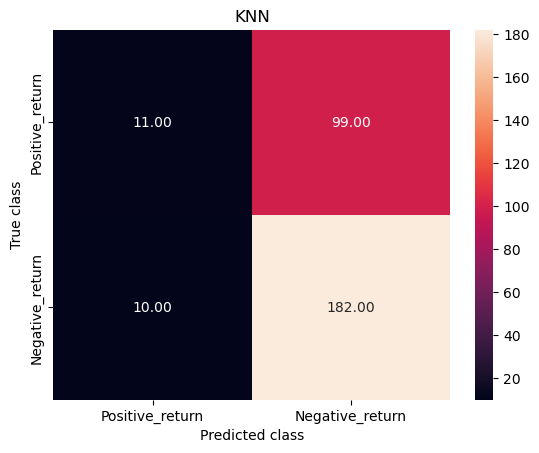

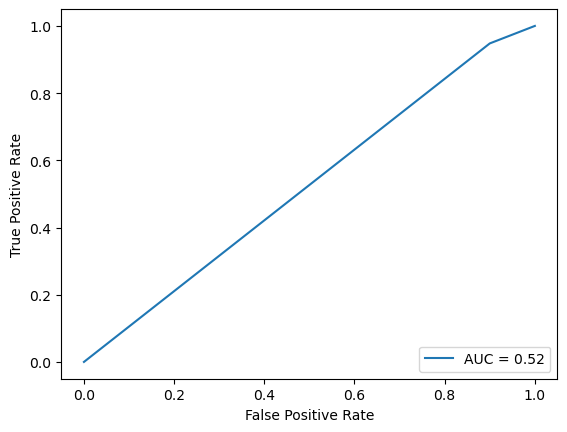

In [643]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=35,algorithm="brute").fit(X_train_trans, Y_train_shift)
Y_pred = neigh.predict(X_test_trans)
print('KNN Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))

clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('KNN')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Extratrees classifier Accuracy: 0.662
--------------------------------------
              precision    recall  f1-score   support

           0       0.55      0.38      0.45       110
           1       0.70      0.82      0.76       192

    accuracy                           0.66       302
   macro avg       0.63      0.60      0.60       302
weighted avg       0.65      0.66      0.65       302



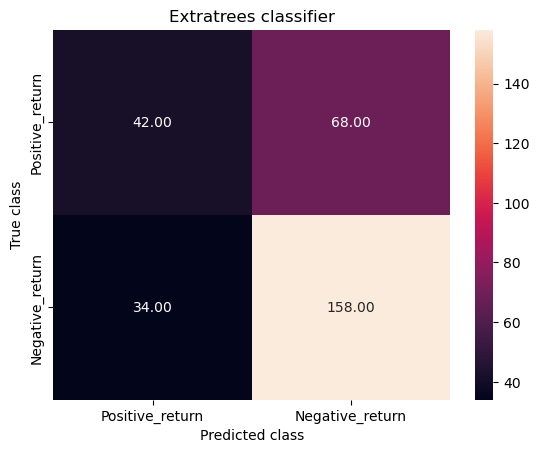

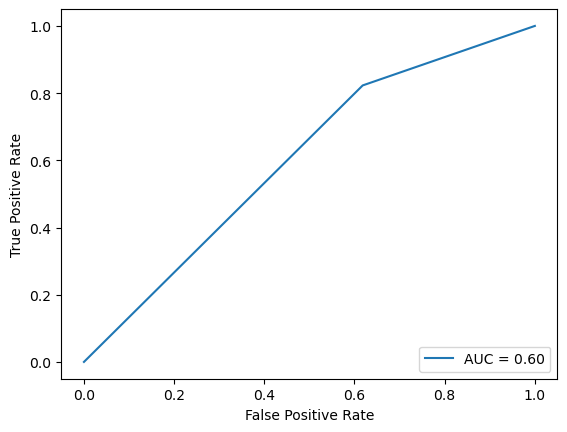

In [649]:
from sklearn.ensemble import ExtraTreesClassifier
extra = ExtraTreesClassifier(n_estimators=15500,max_depth=25,max_features=None).fit(X_train_trans, Y_train_shift)
Y_pred = extra.predict(X_test_trans)
print('Extratrees classifier Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))

clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Extratrees classifier')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

Linear SVC Accuracy: 0.659
--------------------------------------
              precision    recall  f1-score   support

           0       0.56      0.28      0.38       110
           1       0.68      0.88      0.77       192

    accuracy                           0.66       302
   macro avg       0.62      0.58      0.57       302
weighted avg       0.64      0.66      0.62       302



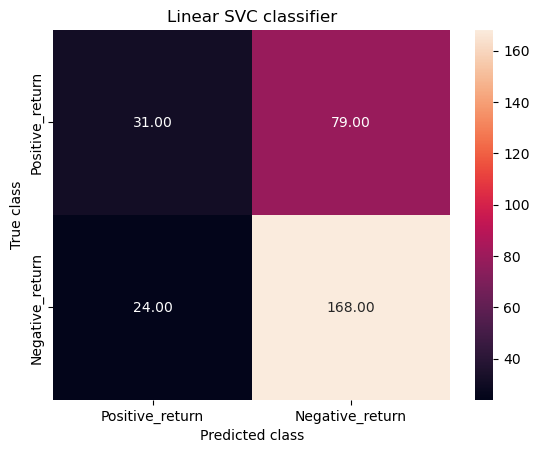

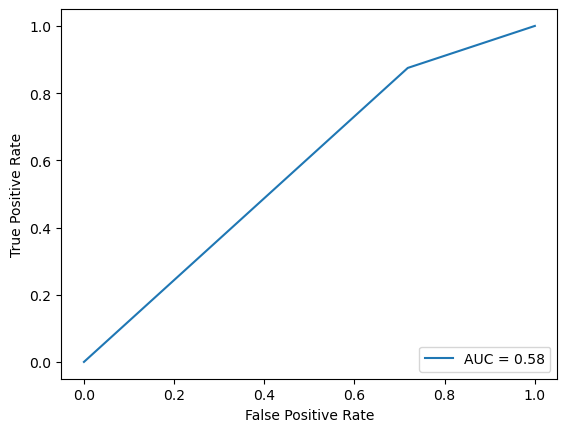

In [652]:
from sklearn.svm import LinearSVC
linear=LinearSVC(tol=1e-4,penalty="l2").fit(X_train_trans, Y_train_shift)
Y_pred = linear.predict(X_test_trans)
print('Linear SVC Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Linear SVC classifier')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()

plt.show()

MLPClassifier Accuracy: 0.636
--------------------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       110
           1       0.64      1.00      0.78       192

    accuracy                           0.64       302
   macro avg       0.32      0.50      0.39       302
weighted avg       0.40      0.64      0.49       302



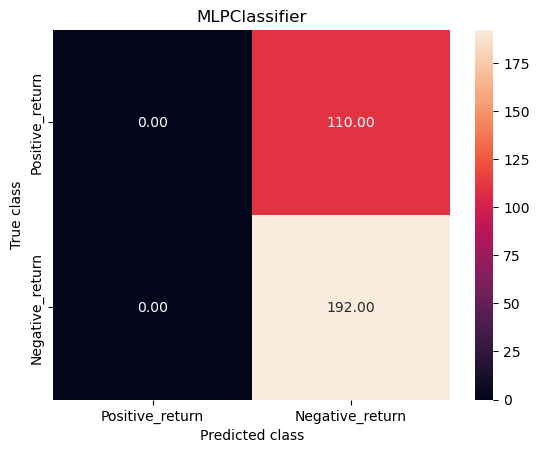

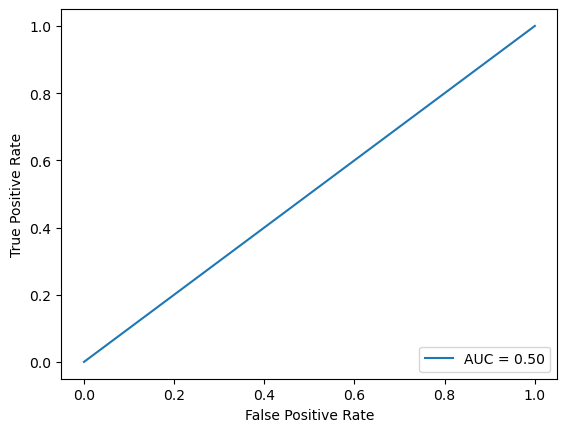

In [686]:
from sklearn.neural_network import MLPClassifier
model=MLPClassifier(hidden_layer_sizes=(8,8,8,8,8), random_state=42, max_iter=3000,activation="relu",solver="adam",batch_size=200,
    learning_rate="invscaling",alpha=0.00015,beta_1=0.95,beta_2=0.9999,learning_rate_init=0.0000105).fit(X_train_trans, Y_train_shift)
Y_pred = model.predict(X_test_trans)
print('MLPClassifier Accuracy: {:.3f}'.format(accuracy_score(Y_test_shift, Y_pred)))
print('--------------------------------------')
print(classification_report(Y_test_shift, Y_pred))


clf_confm = confusion_matrix(Y_test_shift, Y_pred)
sns.heatmap(clf_confm, annot=True, fmt='.2f',xticklabels = ["Positive_return", "Negative_return"] , yticklabels = ["Positive_return", "Negative_return"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('MLPClassifier')
plt.show()
fpr, tpr, thresholds = metrics.roc_curve(Y_test_shift, Y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()


